In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.datasets import make_blobs
from scipy.stats import multivariate_normal
from scipy.optimize import linear_sum_assignment
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE
import umap
from sklearn.cluster import KMeans, DBSCAN, SpectralClustering
from sklearn.mixture import GaussianMixture
from sklearn.neighbors import NearestNeighbors
from pyclustering.cluster.kmedoids import kmedoids
from pyclustering.utils import distance_metric, type_metric
from sklearn.metrics import confusion_matrix, classification_report, adjusted_rand_score, normalized_mutual_info_score, silhouette_score
from matplotlib.lines import Line2D
import warnings
warnings.filterwarnings("ignore", category=UserWarning) 
warnings.filterwarnings("ignore", message="'force_all_finite' was renamed")
from main import CorrelatedClusterGenerator


# data

In [2]:
np.random.seed(42)

In [3]:
cluster_generator = CorrelatedClusterGenerator(n_samples=100000,n_features=20,n_clusters=3,correlation=0.2,cluster_std=[1.0, 5.5, 0.5],separation_factor=3.0,random_state=42)

In [4]:
X, y, centers = cluster_generator.generate_clusters()

In [5]:
X = X + np.random.normal(scale=9,size=X.shape) 

In [6]:
label_0 = 2500

In [7]:
label_1 = 1500

In [8]:
label_2 = 1000

In [9]:
X = np.vstack((X[y == 0][:label_0], X[y == 1][:label_1], X[y == 2][:label_2]))  

In [10]:
y = [0] * label_0 + [1] * label_1 + [2] * label_2

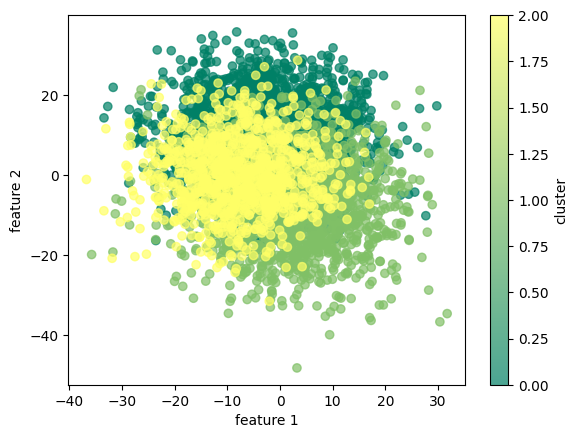

In [11]:
plt.scatter(X[:,0],X[:,1],c=y,cmap='summer',alpha=0.7)
plt.xlabel("feature 1")
plt.ylabel("feature 2")
plt.colorbar(label="cluster")
plt.show()

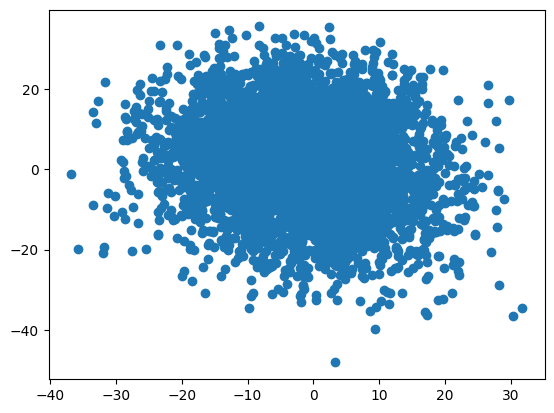

In [12]:
plt.scatter(X[:,0],X[:,1])
plt.show()

In [13]:
corr_dataset = pd.DataFrame(X) 

In [14]:
corr_dataset.columns = [f"vab_{col+1}" for col in corr_dataset.columns]

In [15]:
corr_dataset['target'] = y

In [16]:
corr_dataset

,vab_1,vab_2,vab_3,vab_4,vab_5,vab_6,vab_7,vab_8,vab_9,vab_10,...,vab_12,vab_13,vab_14,vab_15,vab_16,vab_17,vab_18,vab_19,vab_20,target
0,-3.809655,7.452653,1.621266,5.962703,-20.914807,-8.423689,-8.428553,9.096505,21.201735,2.588196,...,8.595133,13.283968,2.550128,-15.015724,-3.239401,11.489176,10.971089,-8.309928,3.946436,0
1,1.718677,17.454119,4.097770,10.133191,4.828268,13.212596,-4.307133,9.559942,-0.863631,20.272341,...,3.457638,1.397689,-12.102205,-9.325296,4.879407,-10.138815,-0.100435,0.289000,-0.733288,0
2,5.739965,13.635069,5.916122,2.276878,-28.387848,-15.937000,-9.527188,10.810504,2.315007,14.456410,...,12.474967,8.812864,-8.108574,14.782889,-8.321536,-7.157955,6.945980,5.029422,4.222092,0
3,-4.238654,24.096863,-9.541265,-2.624971,-17.097469,-13.364005,0.732528,-8.317549,-6.192643,8.681732,...,26.856927,16.110083,14.050932,-2.290120,-8.231265,-7.154030,-5.391910,2.873629,-1.193631,0
4,2.163853,19.171583,22.662716,7.527734,-5.851084,-13.330661,-4.765595,4.136365,10.117018,-6.905581,...,11.801474,-4.679307,-11.528358,-11.265091,3.498680,-16.718362,-4.685691,5.584172,9.084073,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4995,-7.055721,-4.933603,-19.823557,16.800567,-1.211606,-3.712822,-0.637370,13.386826,8.358516,9.134989,...,6.537525,25.085684,15.552802,0.702485,21.954281,-22.892991,-14.438625,-12.967728,-5.037305,2
4996,2.843118,-5.627838,-22.490543,14.119613,1.163222,-6.984198,-7.366098,-6.001417,-11.501928,-12.883781,...,24.608013,-10.154374,-3.362936,5.876437,10.028466,-12.892411,-5.886227,-5.661087,-11.650669,2
4997,-10.554707,-12.143863,-14.814216,-3.226853,-1.324445,4.964251,-9.565188,19.327803,6.022009,0.986751,...,5.678098,-3.791063,3.040745,2.070332,19.373326,-15.786374,-21.285011,-20.995450,0.845541,2
4998,-12.870637,-8.643988,-6.075779,4.484099,-21.532395,-5.134373,-0.485018,-5.882840,-5.950231,-8.705161,...,5.429664,7.601373,25.977478,-6.552291,7.896572,2.455856,-3.093609,-17.791757,-15.966041,2


## correlation matrix

In [17]:
corr_dataset.iloc[:,:-1].corr()

,vab_1,vab_2,vab_3,vab_4,vab_5,vab_6,vab_7,vab_8,vab_9,vab_10,vab_11,vab_12,vab_13,vab_14,vab_15,vab_16,vab_17,vab_18,vab_19,vab_20
vab_1,1.000000,-0.124837,0.041489,-0.105622,0.042174,0.046526,-0.034598,-0.019764,-0.006275,-0.052012,-0.044813,-0.147039,-0.204568,0.045828,0.082364,-0.001241,0.059739,-0.029518,0.143917,0.030322
vab_2,-0.124837,1.000000,0.244722,0.084051,-0.136628,-0.312619,-0.080176,0.223410,0.017745,0.312411,-0.292865,0.345332,0.313714,-0.352196,-0.361786,-0.310107,-0.019754,0.198747,-0.077741,-0.086863
vab_3,0.041489,0.244722,1.000000,-0.029244,-0.081664,-0.244628,-0.081403,0.177599,0.038083,0.251119,-0.311748,0.155926,0.072637,-0.290221,-0.236082,-0.294844,0.063702,0.176887,0.086695,-0.029715
vab_4,-0.105622,0.084051,-0.029244,1.000000,-0.050717,-0.067956,0.022063,0.000452,0.003386,0.009846,0.071934,0.113841,0.166944,-0.025962,-0.068115,0.028970,-0.080597,0.002760,-0.144770,-0.049726
vab_5,0.042174,-0.136628,-0.081664,-0.050717,1.000000,0.124832,0.022771,-0.063954,-0.014342,-0.108673,0.092738,-0.142497,-0.127526,0.087174,0.137574,0.087988,0.015074,-0.083657,0.031545,0.005842
vab_6,0.046526,-0.312619,-0.244628,-0.067956,0.124832,1.000000,0.074466,-0.190648,-0.049307,-0.277740,0.310929,-0.272985,-0.214794,0.309300,0.303069,0.283771,-0.016589,-0.203472,0.002165,0.069289
vab_7,-0.034598,-0.080176,-0.081403,0.022063,0.022771,0.074466,1.000000,-0.034494,-0.021149,-0.104965,0.152185,-0.080476,-0.004693,0.123604,0.110301,0.125337,-0.070320,-0.090130,-0.009977,0.006671
vab_8,-0.019764,0.223410,0.177599,0.000452,-0.063954,-0.190648,-0.034494,1.000000,0.022935,0.176184,-0.191276,0.167706,0.133400,-0.204046,-0.185331,-0.186469,0.007884,0.119616,0.032133,-0.064938
vab_9,-0.006275,0.017745,0.038083,0.003386,-0.014342,-0.049307,-0.021149,0.022935,1.000000,0.013156,-0.037435,0.004202,0.009795,-0.048929,-0.038454,-0.024205,-0.007642,0.017082,-0.010558,-0.004590
vab_10,-0.052012,0.312411,0.251119,0.009846,-0.108673,-0.277740,-0.104965,0.176184,0.013156,1.000000,-0.322941,0.282010,0.204499,-0.323235,-0.335699,-0.301462,0.026758,0.210883,-0.027836,-0.083811


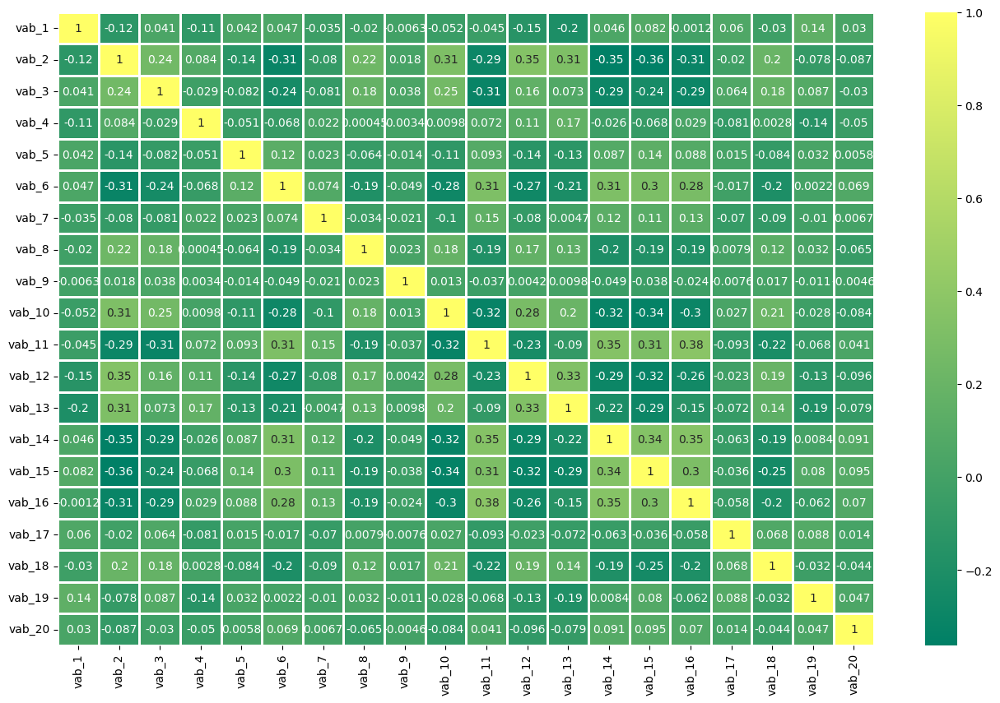

In [18]:
plt.figure(figsize=(16,10))
sns.heatmap(corr_dataset.iloc[:,:-1].corr(),cmap='summer',annot=True,linewidths=1)
plt.show()

## data standardization

In [19]:
X_values = corr_dataset.iloc[:,:-1].values

In [20]:
y_values = corr_dataset.iloc[:,-1].values

In [21]:
scaler = StandardScaler()

In [22]:
X_values = scaler.fit_transform(X_values)

In [23]:
np.mean(X_values),np.std(X_values)

(1.148237060988322e-16, 1.0000000000000002)

In [24]:
pd.DataFrame(X_values)

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19
0,-0.160208,0.427904,0.218411,0.379965,-1.624149,-0.660966,-0.162027,0.517080,2.053325,0.403686,-0.702597,0.414708,0.909839,0.098357,-1.310225,-0.302543,1.683452,1.376769,-0.633143,0.744272
1,0.391553,1.259584,0.440816,0.790814,0.963819,1.265959,0.262410,0.562793,-0.274432,1.980427,0.078122,-0.031632,-0.092344,-1.152632,-0.821434,0.399657,-0.557576,0.304146,0.175527,0.248783
2,0.792902,0.942008,0.604116,0.016861,-2.375419,-1.330101,-0.275168,0.686148,0.060894,1.461871,-1.913992,0.751784,0.532861,-0.811663,1.249390,-0.742100,-0.248708,0.986811,0.621331,0.773459
3,-0.203025,1.811966,-0.784054,-0.466037,-1.240390,-1.100950,0.781411,-1.200636,-0.836609,0.946994,-0.352206,2.001273,1.148120,1.080275,-0.217132,-0.734292,-0.248302,-0.208498,0.418593,0.200042
4,0.435984,1.402401,2.108064,0.534142,-0.109783,-1.097980,0.215197,0.027814,0.883957,-0.442791,-0.407674,0.693272,-0.604721,-1.103638,-0.988057,0.280237,-1.239329,-0.140079,0.673501,1.288245
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4995,-0.484185,-0.602084,-1.707468,1.447641,0.356627,-0.241417,0.640334,0.940276,0.698447,0.987407,0.837478,0.235945,1.904891,1.208502,0.039924,1.876471,-1.879126,-1.084955,-1.071177,-0.206926
4996,0.503779,-0.659814,-1.946980,1.183531,0.595370,-0.532765,-0.052612,-0.972174,-1.396705,-0.975814,2.281601,1.805890,-1.066347,-0.406489,0.484351,0.845001,-0.842896,-0.256388,-0.384038,-0.907149
4997,-0.833405,-1.201659,-1.257598,-0.525331,0.345283,0.531362,-0.279081,1.526292,0.451960,0.260900,0.483072,0.161279,-0.529829,0.140245,0.157418,1.653243,-1.142760,-1.748241,-1.826129,0.415950
4998,-1.064549,-0.910624,-0.472832,0.234302,-1.686236,-0.368020,0.656024,-0.960477,-0.811036,-0.603243,1.154426,0.139695,0.430715,2.098541,-0.583241,0.660613,0.747446,0.014164,-1.524844,-1.364060


## pca 

In [25]:
pca_general = PCA()

In [26]:
pca_general.fit(X_values)

,n_components,None
,copy,True
,whiten,False
,svd_solver,'auto'
,tol,0.0
,iterated_power,'auto'
,n_oversamples,10
,power_iteration_normalizer,'auto'
,random_state,None


In [27]:
explained_variance = pca_general.explained_variance_ratio_

In [28]:
explained_variance

array([0.19825547, 0.08554075, 0.05146303, 0.05044984, 0.05007037,
       0.04691254, 0.04641822, 0.04462566, 0.04362899, 0.04255503,
       0.04084335, 0.03799898, 0.03565522, 0.03512438, 0.03451315,
       0.03289609, 0.03132078, 0.03122796, 0.03080153, 0.02969868])

In [29]:
eigenvalues = pca_general.explained_variance_

In [30]:
pd.DataFrame(eigenvalues)

,0
0,3.965902
1,1.711157
2,1.029466
3,1.009199
4,1.001608
5,0.938438
6,0.928550
7,0.892692
8,0.872754
9,0.851271


In [31]:
eigenvectors = pca_general.components_

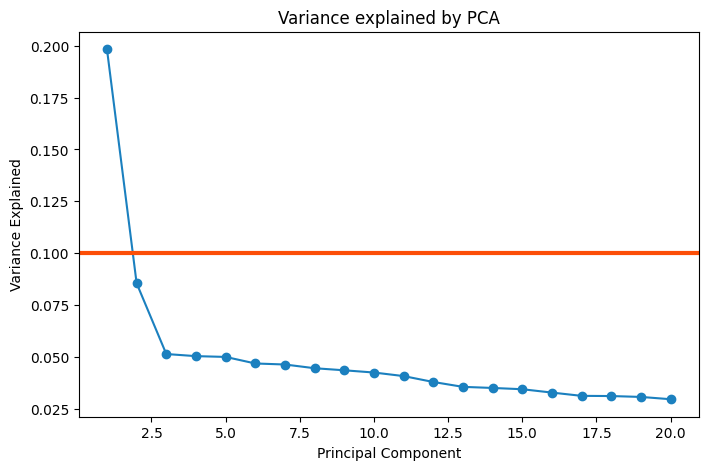

In [32]:
plt.figure(figsize=(8,5))
plt.plot(range(1, len(explained_variance) + 1), explained_variance, marker='o', linestyle='-', color='#1B80BF')
plt.axhline(y=0.1, color='#FC4E07', linewidth=3)
plt.title('Variance explained by PCA')
plt.xlabel('Principal Component')
plt.ylabel('Variance Explained')
plt.show()

In [33]:
pca = PCA(n_components=3)

In [34]:
X_pca = pca.fit_transform(X_values)

In [35]:
pd.DataFrame(X_pca).head(8)

,0,1,2
0,2.256809,-0.177759,-1.148674
1,1.192995,-0.095685,0.446414
2,2.810060,1.023180,0.564602
3,1.618481,-1.187891,0.191714
4,1.764301,0.534787,1.383652
5,2.096674,0.176017,-0.185171
6,0.855177,0.877980,-0.138304
7,1.471992,1.505909,-1.448608


In [36]:
principal_df = pd.DataFrame(data = X_pca,columns = ['principal component 1','principal component 2','principal component 3'])

In [37]:
final_df = pd.concat([principal_df,corr_dataset[['target']]],axis = 1)

In [38]:
final_df

,principal component 1,principal component 2,principal component 3,target
0,2.256809,-0.177759,-1.148674,0
1,1.192995,-0.095685,0.446414,0
2,2.810060,1.023180,0.564602,0
3,1.618481,-1.187891,0.191714,0
4,1.764301,0.534787,1.383652,0
...,...,...,...,...
4995,-0.997333,-3.564631,1.159542,2
4996,-1.789546,-1.903338,-0.436672,2
4997,-1.635817,-1.549907,0.319441,2
4998,-1.175517,-2.288219,-0.946556,2


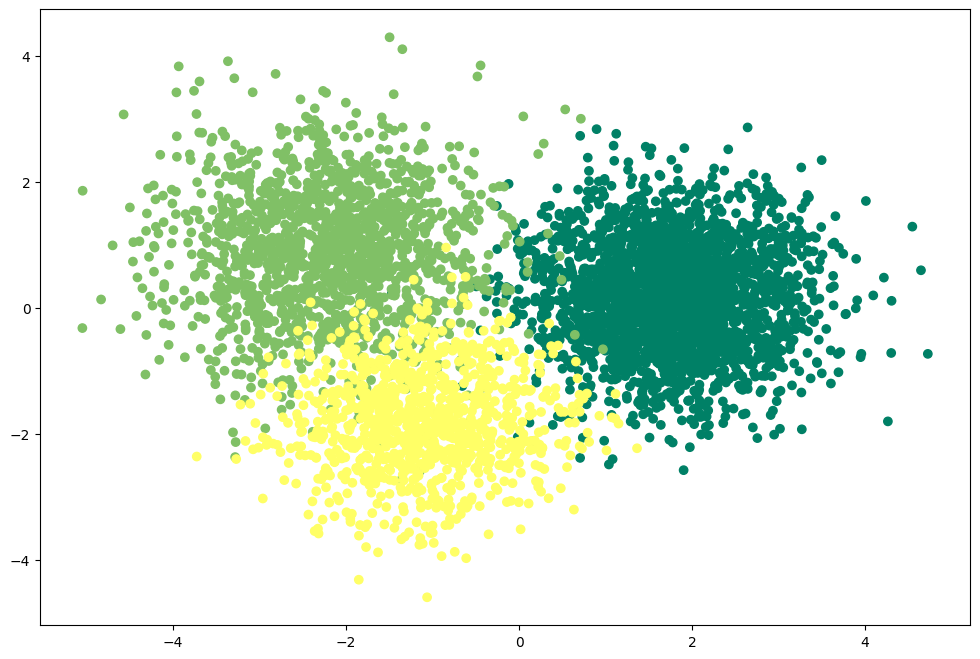

In [39]:
fig = plt.figure(figsize=(12,8))
plt.scatter(x=final_df['principal component 1'],y=final_df['principal component 2'],c=final_df['target'],cmap='summer')
plt.show()

## t-SNE

In [40]:
tsne = TSNE(n_components=3,random_state=42)

In [41]:
X_tsne = tsne.fit_transform(X_values)

In [42]:
tsne_data = pd.concat([pd.DataFrame(X_tsne,columns=('dim_1','dim_2','dim_3')),corr_dataset['target']],axis=1)

In [43]:
tsne_data

,dim_1,dim_2,dim_3,target
0,27.575926,6.772835,30.755861,0
1,22.308699,-2.431415,-12.665780,0
2,33.890411,-2.765210,-24.709202,0
3,13.191100,-33.858894,-2.716115,0
4,10.978120,-16.358929,-11.688762,0
...,...,...,...,...
4995,-3.443294,2.481065,14.695673,2
4996,-15.858646,21.963120,-11.327615,2
4997,-16.661875,-17.591448,-14.469466,2
4998,-3.725259,-26.030815,19.042171,2


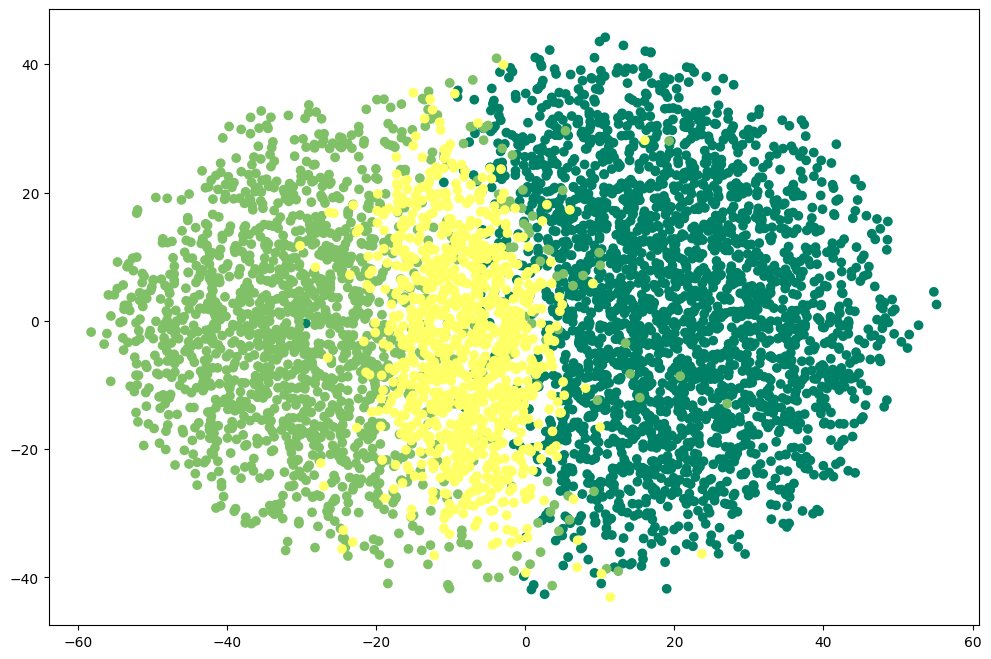

In [44]:
fig = plt.figure(figsize=(12,8))
plt.scatter(x=tsne_data['dim_1'],y=tsne_data['dim_2'],c=tsne_data['target'],cmap='summer')
plt.show()

In [45]:
tsne.kl_divergence_

3.042299270629883

## umap

In [46]:
umap = umap.UMAP(n_components=3,random_state=42)

In [47]:
X_umap = umap.fit_transform(X_values)

In [48]:
umap_data = pd.concat([pd.DataFrame(X_umap,columns=('dim_1','dim_2','dim_3')),corr_dataset['target']],axis=1)

In [49]:
umap_data

,dim_1,dim_2,dim_3,target
0,8.534871,3.932154,5.918611,0
1,7.332027,2.994253,4.670614,0
2,8.225533,2.686104,4.880893,0
3,6.664459,2.590339,4.960834,0
4,8.079132,2.487788,4.345153,0
...,...,...,...,...
4995,2.726015,4.239058,5.177792,2
4996,2.721657,3.649072,4.901885,2
4997,2.231953,3.944607,5.527086,2
4998,3.549637,3.461584,5.844418,2


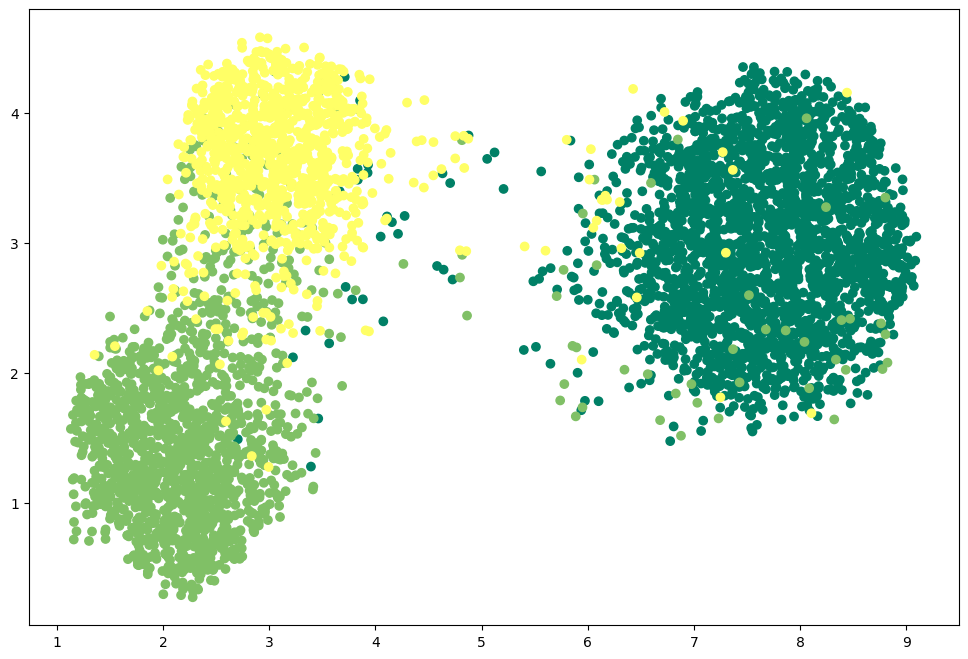

In [50]:
fig = plt.figure(figsize=(12,8))
plt.scatter(umap_data['dim_1'],umap_data['dim_2'],c=umap_data['target'],cmap='summer')
plt.show()

## k-means 

In [51]:
kmeans = KMeans(n_clusters=3,init='k-means++',random_state=42)

In [52]:
kmeans.fit(X_values)

,n_clusters,3
,init,'k-means++'
,n_init,'auto'
,max_iter,300
,tol,0.0001
,verbose,0
,random_state,42
,copy_x,True
,algorithm,'lloyd'


In [53]:
df_kmeans = corr_dataset.copy()

In [54]:
df_kmeans['k_means'] = kmeans.labels_

In [55]:
df_kmeans

,vab_1,vab_2,vab_3,vab_4,vab_5,vab_6,vab_7,vab_8,vab_9,vab_10,...,vab_13,vab_14,vab_15,vab_16,vab_17,vab_18,vab_19,vab_20,target,k_means
0,-3.809655,7.452653,1.621266,5.962703,-20.914807,-8.423689,-8.428553,9.096505,21.201735,2.588196,...,13.283968,2.550128,-15.015724,-3.239401,11.489176,10.971089,-8.309928,3.946436,0,0
1,1.718677,17.454119,4.097770,10.133191,4.828268,13.212596,-4.307133,9.559942,-0.863631,20.272341,...,1.397689,-12.102205,-9.325296,4.879407,-10.138815,-0.100435,0.289000,-0.733288,0,0
2,5.739965,13.635069,5.916122,2.276878,-28.387848,-15.937000,-9.527188,10.810504,2.315007,14.456410,...,8.812864,-8.108574,14.782889,-8.321536,-7.157955,6.945980,5.029422,4.222092,0,0
3,-4.238654,24.096863,-9.541265,-2.624971,-17.097469,-13.364005,0.732528,-8.317549,-6.192643,8.681732,...,16.110083,14.050932,-2.290120,-8.231265,-7.154030,-5.391910,2.873629,-1.193631,0,0
4,2.163853,19.171583,22.662716,7.527734,-5.851084,-13.330661,-4.765595,4.136365,10.117018,-6.905581,...,-4.679307,-11.528358,-11.265091,3.498680,-16.718362,-4.685691,5.584172,9.084073,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4995,-7.055721,-4.933603,-19.823557,16.800567,-1.211606,-3.712822,-0.637370,13.386826,8.358516,9.134989,...,25.085684,15.552802,0.702485,21.954281,-22.892991,-14.438625,-12.967728,-5.037305,2,2
4996,2.843118,-5.627838,-22.490543,14.119613,1.163222,-6.984198,-7.366098,-6.001417,-11.501928,-12.883781,...,-10.154374,-3.362936,5.876437,10.028466,-12.892411,-5.886227,-5.661087,-11.650669,2,2
4997,-10.554707,-12.143863,-14.814216,-3.226853,-1.324445,4.964251,-9.565188,19.327803,6.022009,0.986751,...,-3.791063,3.040745,2.070332,19.373326,-15.786374,-21.285011,-20.995450,0.845541,2,2
4998,-12.870637,-8.643988,-6.075779,4.484099,-21.532395,-5.134373,-0.485018,-5.882840,-5.950231,-8.705161,...,7.601373,25.977478,-6.552291,7.896572,2.455856,-3.093609,-17.791757,-15.966041,2,2


In [56]:
y_true = df_kmeans['target'].values  
y_kmeans = df_kmeans['k_means'].values  

conf_matrix = confusion_matrix(y_true, y_kmeans)

row_ind, col_ind = linear_sum_assignment(-conf_matrix)  

mapping = {old: new for old, new in zip(col_ind, row_ind)}
df_kmeans['k_means'] = np.array([mapping[label] for label in y_kmeans])

print("accuracy before:", np.mean(y_kmeans == y_true))
print("accuracy after:", np.mean(df_kmeans['k_means'] == y_true))

accuracy before: 0.9594
accuracy after: 0.9594


In [57]:
df_kmeans

,vab_1,vab_2,vab_3,vab_4,vab_5,vab_6,vab_7,vab_8,vab_9,vab_10,...,vab_13,vab_14,vab_15,vab_16,vab_17,vab_18,vab_19,vab_20,target,k_means
0,-3.809655,7.452653,1.621266,5.962703,-20.914807,-8.423689,-8.428553,9.096505,21.201735,2.588196,...,13.283968,2.550128,-15.015724,-3.239401,11.489176,10.971089,-8.309928,3.946436,0,0
1,1.718677,17.454119,4.097770,10.133191,4.828268,13.212596,-4.307133,9.559942,-0.863631,20.272341,...,1.397689,-12.102205,-9.325296,4.879407,-10.138815,-0.100435,0.289000,-0.733288,0,0
2,5.739965,13.635069,5.916122,2.276878,-28.387848,-15.937000,-9.527188,10.810504,2.315007,14.456410,...,8.812864,-8.108574,14.782889,-8.321536,-7.157955,6.945980,5.029422,4.222092,0,0
3,-4.238654,24.096863,-9.541265,-2.624971,-17.097469,-13.364005,0.732528,-8.317549,-6.192643,8.681732,...,16.110083,14.050932,-2.290120,-8.231265,-7.154030,-5.391910,2.873629,-1.193631,0,0
4,2.163853,19.171583,22.662716,7.527734,-5.851084,-13.330661,-4.765595,4.136365,10.117018,-6.905581,...,-4.679307,-11.528358,-11.265091,3.498680,-16.718362,-4.685691,5.584172,9.084073,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4995,-7.055721,-4.933603,-19.823557,16.800567,-1.211606,-3.712822,-0.637370,13.386826,8.358516,9.134989,...,25.085684,15.552802,0.702485,21.954281,-22.892991,-14.438625,-12.967728,-5.037305,2,2
4996,2.843118,-5.627838,-22.490543,14.119613,1.163222,-6.984198,-7.366098,-6.001417,-11.501928,-12.883781,...,-10.154374,-3.362936,5.876437,10.028466,-12.892411,-5.886227,-5.661087,-11.650669,2,2
4997,-10.554707,-12.143863,-14.814216,-3.226853,-1.324445,4.964251,-9.565188,19.327803,6.022009,0.986751,...,-3.791063,3.040745,2.070332,19.373326,-15.786374,-21.285011,-20.995450,0.845541,2,2
4998,-12.870637,-8.643988,-6.075779,4.484099,-21.532395,-5.134373,-0.485018,-5.882840,-5.950231,-8.705161,...,7.601373,25.977478,-6.552291,7.896572,2.455856,-3.093609,-17.791757,-15.966041,2,2


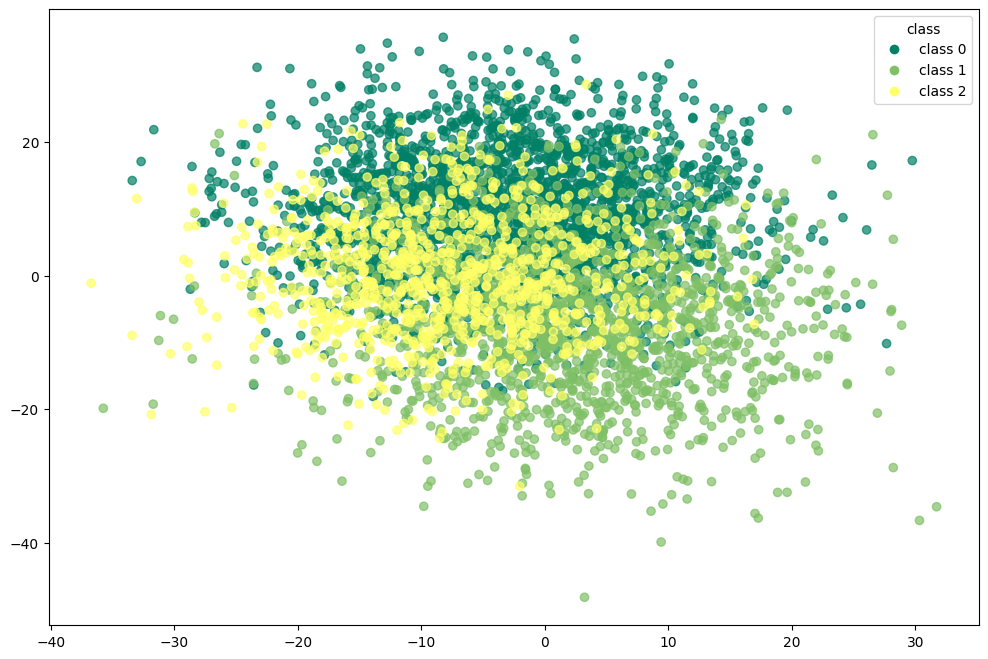

In [58]:
plt.figure(figsize=(12,8))
scatter = plt.scatter(df_kmeans.iloc[:, 0],df_kmeans.iloc[:, 1], 
                      c=df_kmeans['target'],cmap='summer',alpha=0.7)

unique_labels = np.unique(df_kmeans['target'])
legend_elements = [Line2D([0], [0],marker='o',color='w',label=f'class {label}',
                          markerfacecolor=scatter.cmap(scatter.norm(label)), markersize=8) 
                   for label in unique_labels]
plt.legend(handles=legend_elements,title="class")
plt.show()

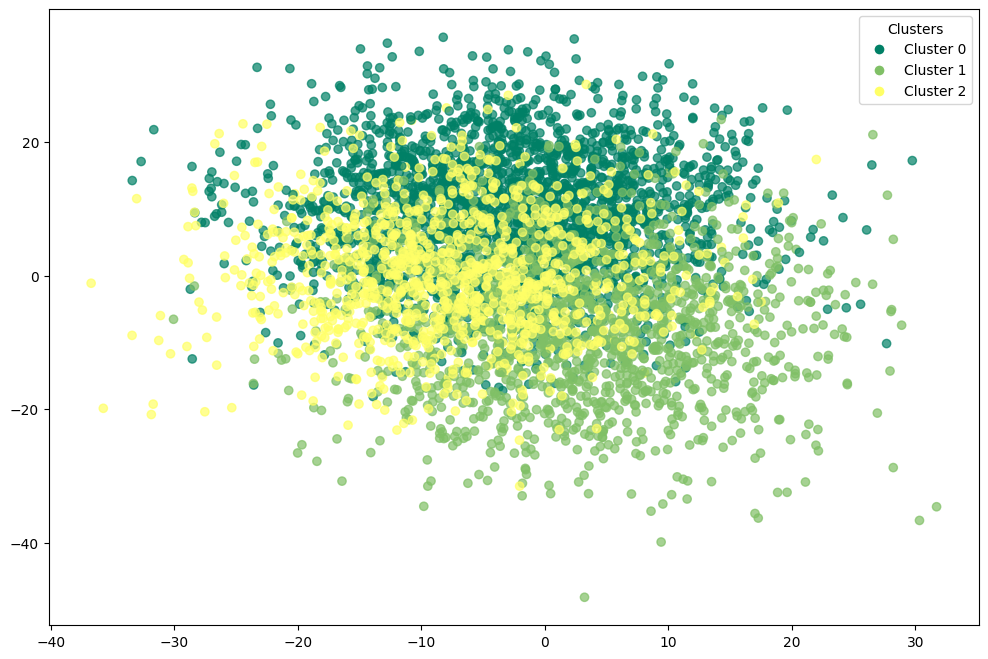

In [59]:
plt.figure(figsize=(12,8))
scatter = plt.scatter(df_kmeans.iloc[:, 0], df_kmeans.iloc[:, 1], 
                      c=df_kmeans['k_means'], cmap='summer', alpha=0.7)
unique_clusters = np.unique(df_kmeans['k_means'])
legend_elements = [Line2D([0], [0], marker='o', color='w', label=f'Cluster {cluster}',
                          markerfacecolor=scatter.cmap(scatter.norm(cluster)), markersize=8) 
                   for cluster in unique_clusters]
plt.legend(handles=legend_elements, title="Clusters")
plt.show()

In [60]:
kmeans.cluster_centers_

array([[-5.24904673e-02,  5.63083364e-01,  4.85008206e-01,
        -3.04027095e-04, -2.01381786e-01, -5.25995002e-01,
        -1.95754658e-01,  3.49261198e-01,  5.49897561e-02,
         5.33429887e-01, -6.11959160e-01,  4.67791771e-01,
         3.25421152e-01, -5.96227009e-01, -5.55751501e-01,
        -5.75938040e-01,  9.94267072e-02,  3.74105533e-01,
         3.28990501e-02, -1.22139875e-01],
       [ 5.15498414e-01, -8.72193389e-01, -2.70905742e-01,
        -4.52381768e-01,  3.53111049e-01,  6.27617432e-01,
         1.05185394e-01, -3.54325501e-01, -4.02835892e-02,
        -6.25527329e-01,  3.72688545e-01, -9.02036030e-01,
        -9.63265495e-01,  6.42128870e-01,  8.19128586e-01,
         4.65201056e-01,  1.44738653e-01, -4.69902358e-01,
         5.16963368e-01,  2.50866320e-01],
       [-5.38709115e-01, -1.68390964e-01, -7.58388583e-01,
         5.78323595e-01,  7.64369242e-03,  3.96236671e-01,
         3.11399565e-01, -3.42794757e-01, -7.37675757e-02,
        -4.15833699e-01,  9.1

In [61]:
print(confusion_matrix(df_kmeans['target'],df_kmeans['k_means']))

[[2469    6   25]
 [  19 1368  113]
 [  12   28  960]]


In [62]:
print(classification_report(df_kmeans['target'],df_kmeans['k_means']))

              precision    recall  f1-score   support

           0       0.99      0.99      0.99      2500
           1       0.98      0.91      0.94      1500
           2       0.87      0.96      0.92      1000

    accuracy                           0.96      5000
   macro avg       0.95      0.95      0.95      5000
weighted avg       0.96      0.96      0.96      5000



In [63]:
adjusted_rand_score(df_kmeans['target'],df_kmeans['k_means'])

0.905266766390596

In [64]:
normalized_mutual_info_score(df_kmeans['target'],df_kmeans['k_means'])

0.8335020993226708

In [65]:
silhouette_score(df_kmeans.drop(columns=['target','k_means']).values,df_kmeans['k_means'])

0.14068190776986583

### k-means with pca

In [66]:
kmeans_pca = KMeans(n_clusters=3,init='k-means++',random_state=42)

In [67]:
kmeans_pca.fit(X_pca)

,n_clusters,3
,init,'k-means++'
,n_init,'auto'
,max_iter,300
,tol,0.0001
,verbose,0
,random_state,42
,copy_x,True
,algorithm,'lloyd'


In [68]:
df_pca_kmeans = corr_dataset.copy()

In [69]:
df_pca_kmeans["kmeans_pca"] = kmeans_pca.labels_

In [70]:
df_pca_kmeans

,vab_1,vab_2,vab_3,vab_4,vab_5,vab_6,vab_7,vab_8,vab_9,vab_10,...,vab_13,vab_14,vab_15,vab_16,vab_17,vab_18,vab_19,vab_20,target,kmeans_pca
0,-3.809655,7.452653,1.621266,5.962703,-20.914807,-8.423689,-8.428553,9.096505,21.201735,2.588196,...,13.283968,2.550128,-15.015724,-3.239401,11.489176,10.971089,-8.309928,3.946436,0,0
1,1.718677,17.454119,4.097770,10.133191,4.828268,13.212596,-4.307133,9.559942,-0.863631,20.272341,...,1.397689,-12.102205,-9.325296,4.879407,-10.138815,-0.100435,0.289000,-0.733288,0,0
2,5.739965,13.635069,5.916122,2.276878,-28.387848,-15.937000,-9.527188,10.810504,2.315007,14.456410,...,8.812864,-8.108574,14.782889,-8.321536,-7.157955,6.945980,5.029422,4.222092,0,0
3,-4.238654,24.096863,-9.541265,-2.624971,-17.097469,-13.364005,0.732528,-8.317549,-6.192643,8.681732,...,16.110083,14.050932,-2.290120,-8.231265,-7.154030,-5.391910,2.873629,-1.193631,0,0
4,2.163853,19.171583,22.662716,7.527734,-5.851084,-13.330661,-4.765595,4.136365,10.117018,-6.905581,...,-4.679307,-11.528358,-11.265091,3.498680,-16.718362,-4.685691,5.584172,9.084073,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4995,-7.055721,-4.933603,-19.823557,16.800567,-1.211606,-3.712822,-0.637370,13.386826,8.358516,9.134989,...,25.085684,15.552802,0.702485,21.954281,-22.892991,-14.438625,-12.967728,-5.037305,2,2
4996,2.843118,-5.627838,-22.490543,14.119613,1.163222,-6.984198,-7.366098,-6.001417,-11.501928,-12.883781,...,-10.154374,-3.362936,5.876437,10.028466,-12.892411,-5.886227,-5.661087,-11.650669,2,2
4997,-10.554707,-12.143863,-14.814216,-3.226853,-1.324445,4.964251,-9.565188,19.327803,6.022009,0.986751,...,-3.791063,3.040745,2.070332,19.373326,-15.786374,-21.285011,-20.995450,0.845541,2,2
4998,-12.870637,-8.643988,-6.075779,4.484099,-21.532395,-5.134373,-0.485018,-5.882840,-5.950231,-8.705161,...,7.601373,25.977478,-6.552291,7.896572,2.455856,-3.093609,-17.791757,-15.966041,2,2


In [71]:
y_true = df_pca_kmeans['target'].values  
y_kmeans = df_pca_kmeans['kmeans_pca'].values  

conf_matrix = confusion_matrix(y_true, y_kmeans)

row_ind, col_ind = linear_sum_assignment(-conf_matrix)  

mapping = {old: new for old, new in zip(col_ind, row_ind)}
df_pca_kmeans['kmeans_pca'] = np.array([mapping[label] for label in y_kmeans])

print("accuracy before:", np.mean(y_kmeans == y_true))
print("accuracy after:", np.mean(df_pca_kmeans['kmeans_pca'] == y_true))

accuracy before: 0.9594
accuracy after: 0.9594


In [72]:
df_pca_kmeans

,vab_1,vab_2,vab_3,vab_4,vab_5,vab_6,vab_7,vab_8,vab_9,vab_10,...,vab_13,vab_14,vab_15,vab_16,vab_17,vab_18,vab_19,vab_20,target,kmeans_pca
0,-3.809655,7.452653,1.621266,5.962703,-20.914807,-8.423689,-8.428553,9.096505,21.201735,2.588196,...,13.283968,2.550128,-15.015724,-3.239401,11.489176,10.971089,-8.309928,3.946436,0,0
1,1.718677,17.454119,4.097770,10.133191,4.828268,13.212596,-4.307133,9.559942,-0.863631,20.272341,...,1.397689,-12.102205,-9.325296,4.879407,-10.138815,-0.100435,0.289000,-0.733288,0,0
2,5.739965,13.635069,5.916122,2.276878,-28.387848,-15.937000,-9.527188,10.810504,2.315007,14.456410,...,8.812864,-8.108574,14.782889,-8.321536,-7.157955,6.945980,5.029422,4.222092,0,0
3,-4.238654,24.096863,-9.541265,-2.624971,-17.097469,-13.364005,0.732528,-8.317549,-6.192643,8.681732,...,16.110083,14.050932,-2.290120,-8.231265,-7.154030,-5.391910,2.873629,-1.193631,0,0
4,2.163853,19.171583,22.662716,7.527734,-5.851084,-13.330661,-4.765595,4.136365,10.117018,-6.905581,...,-4.679307,-11.528358,-11.265091,3.498680,-16.718362,-4.685691,5.584172,9.084073,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4995,-7.055721,-4.933603,-19.823557,16.800567,-1.211606,-3.712822,-0.637370,13.386826,8.358516,9.134989,...,25.085684,15.552802,0.702485,21.954281,-22.892991,-14.438625,-12.967728,-5.037305,2,2
4996,2.843118,-5.627838,-22.490543,14.119613,1.163222,-6.984198,-7.366098,-6.001417,-11.501928,-12.883781,...,-10.154374,-3.362936,5.876437,10.028466,-12.892411,-5.886227,-5.661087,-11.650669,2,2
4997,-10.554707,-12.143863,-14.814216,-3.226853,-1.324445,4.964251,-9.565188,19.327803,6.022009,0.986751,...,-3.791063,3.040745,2.070332,19.373326,-15.786374,-21.285011,-20.995450,0.845541,2,2
4998,-12.870637,-8.643988,-6.075779,4.484099,-21.532395,-5.134373,-0.485018,-5.882840,-5.950231,-8.705161,...,7.601373,25.977478,-6.552291,7.896572,2.455856,-3.093609,-17.791757,-15.966041,2,2


In [73]:
print(confusion_matrix(df_pca_kmeans['target'],df_pca_kmeans['kmeans_pca']))

[[2467    6   27]
 [  20 1372  108]
 [  13   29  958]]


In [74]:
print(classification_report(df_pca_kmeans['target'],df_pca_kmeans['kmeans_pca']))

              precision    recall  f1-score   support

           0       0.99      0.99      0.99      2500
           1       0.98      0.91      0.94      1500
           2       0.88      0.96      0.92      1000

    accuracy                           0.96      5000
   macro avg       0.95      0.95      0.95      5000
weighted avg       0.96      0.96      0.96      5000



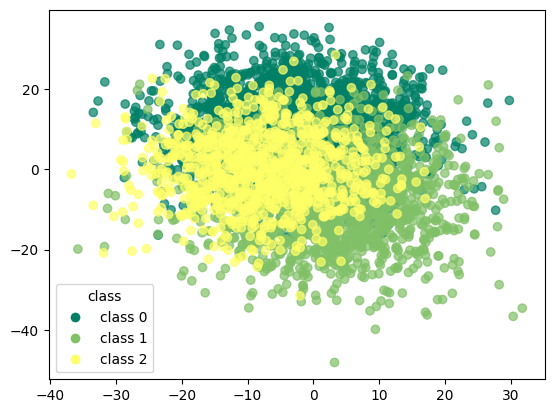

In [ ]:
plt.figure(figsize=(12,8))
scatter = plt.scatter(df_pca_kmeans.iloc[:, 0], df_pca_kmeans.iloc[:, 1], 
                      c=df_pca_kmeans['target'], cmap='summer', alpha=0.7)

unique_labels = np.unique(df_pca_kmeans['target'])
legend_elements = [Line2D([0], [0], marker='o', color='w', label=f'class {label}',
                          markerfacecolor=scatter.cmap(scatter.norm(label)), markersize=8) 
                   for label in unique_labels]
plt.legend(handles=legend_elements, title="class")
plt.show()

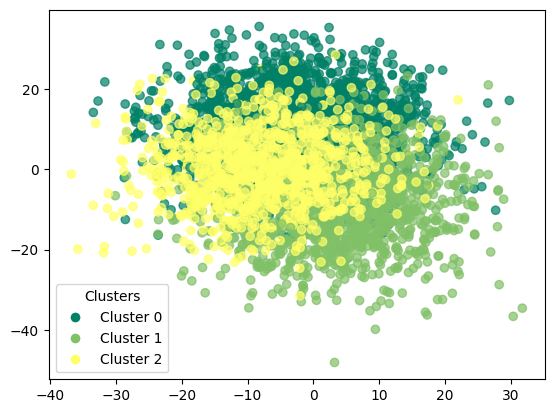

In [ ]:
plt.figure(figsize=(12,8))
scatter = plt.scatter(df_pca_kmeans.iloc[:, 0], df_pca_kmeans.iloc[:, 1], 
                      c=df_pca_kmeans['kmeans_pca'], cmap='summer', alpha=0.7)
unique_clusters = np.unique(df_pca_kmeans['kmeans_pca'])
legend_elements = [Line2D([0], [0], marker='o', color='w', label=f'Cluster {cluster}',
                          markerfacecolor=scatter.cmap(scatter.norm(cluster)), markersize=8) 
                   for cluster in unique_clusters]
plt.legend(handles=legend_elements, title="Clusters")
plt.show()

In [79]:
adjusted_rand_score(df_pca_kmeans['target'],df_pca_kmeans['kmeans_pca'])

0.904392833645849

In [80]:
normalized_mutual_info_score(df_pca_kmeans['target'],df_pca_kmeans['kmeans_pca'])

0.8316909845783227

In [81]:
silhouette_score(df_pca_kmeans.drop(columns=['target','kmeans_pca']).values,df_pca_kmeans['kmeans_pca'])

0.14016535979490266

### k-means with t-SNE

In [82]:
kmeans_tsne = KMeans(n_clusters=3,init='k-means++',random_state=42)

In [83]:
kmeans_tsne.fit(X_tsne)

,n_clusters,3
,init,'k-means++'
,n_init,'auto'
,max_iter,300
,tol,0.0001
,verbose,0
,random_state,42
,copy_x,True
,algorithm,'lloyd'


In [84]:
df_tsne_kmeans = corr_dataset.copy()

In [85]:
df_tsne_kmeans['kmeans_tsne'] = kmeans_tsne.labels_

In [86]:
df_tsne_kmeans

,vab_1,vab_2,vab_3,vab_4,vab_5,vab_6,vab_7,vab_8,vab_9,vab_10,...,vab_13,vab_14,vab_15,vab_16,vab_17,vab_18,vab_19,vab_20,target,kmeans_tsne
0,-3.809655,7.452653,1.621266,5.962703,-20.914807,-8.423689,-8.428553,9.096505,21.201735,2.588196,...,13.283968,2.550128,-15.015724,-3.239401,11.489176,10.971089,-8.309928,3.946436,0,2
1,1.718677,17.454119,4.097770,10.133191,4.828268,13.212596,-4.307133,9.559942,-0.863631,20.272341,...,1.397689,-12.102205,-9.325296,4.879407,-10.138815,-0.100435,0.289000,-0.733288,0,0
2,5.739965,13.635069,5.916122,2.276878,-28.387848,-15.937000,-9.527188,10.810504,2.315007,14.456410,...,8.812864,-8.108574,14.782889,-8.321536,-7.157955,6.945980,5.029422,4.222092,0,0
3,-4.238654,24.096863,-9.541265,-2.624971,-17.097469,-13.364005,0.732528,-8.317549,-6.192643,8.681732,...,16.110083,14.050932,-2.290120,-8.231265,-7.154030,-5.391910,2.873629,-1.193631,0,0
4,2.163853,19.171583,22.662716,7.527734,-5.851084,-13.330661,-4.765595,4.136365,10.117018,-6.905581,...,-4.679307,-11.528358,-11.265091,3.498680,-16.718362,-4.685691,5.584172,9.084073,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4995,-7.055721,-4.933603,-19.823557,16.800567,-1.211606,-3.712822,-0.637370,13.386826,8.358516,9.134989,...,25.085684,15.552802,0.702485,21.954281,-22.892991,-14.438625,-12.967728,-5.037305,2,2
4996,2.843118,-5.627838,-22.490543,14.119613,1.163222,-6.984198,-7.366098,-6.001417,-11.501928,-12.883781,...,-10.154374,-3.362936,5.876437,10.028466,-12.892411,-5.886227,-5.661087,-11.650669,2,1
4997,-10.554707,-12.143863,-14.814216,-3.226853,-1.324445,4.964251,-9.565188,19.327803,6.022009,0.986751,...,-3.791063,3.040745,2.070332,19.373326,-15.786374,-21.285011,-20.995450,0.845541,2,1
4998,-12.870637,-8.643988,-6.075779,4.484099,-21.532395,-5.134373,-0.485018,-5.882840,-5.950231,-8.705161,...,7.601373,25.977478,-6.552291,7.896572,2.455856,-3.093609,-17.791757,-15.966041,2,0


In [87]:
y_true = df_tsne_kmeans['target'].values  
y_kmeans = df_tsne_kmeans['kmeans_tsne'].values  

conf_matrix = confusion_matrix(y_true, y_kmeans)

row_ind, col_ind = linear_sum_assignment(-conf_matrix)  

mapping = {old: new for old, new in zip(col_ind, row_ind)}
df_tsne_kmeans['kmeans_tsne'] = np.array([mapping[label] for label in y_kmeans])

print("accuracy before:", np.mean(y_kmeans == y_true))
print("accuracy after:", np.mean(df_tsne_kmeans['kmeans_tsne'] == y_true))

accuracy before: 0.5748
accuracy after: 0.5748


In [88]:
df_tsne_kmeans

,vab_1,vab_2,vab_3,vab_4,vab_5,vab_6,vab_7,vab_8,vab_9,vab_10,...,vab_13,vab_14,vab_15,vab_16,vab_17,vab_18,vab_19,vab_20,target,kmeans_tsne
0,-3.809655,7.452653,1.621266,5.962703,-20.914807,-8.423689,-8.428553,9.096505,21.201735,2.588196,...,13.283968,2.550128,-15.015724,-3.239401,11.489176,10.971089,-8.309928,3.946436,0,2
1,1.718677,17.454119,4.097770,10.133191,4.828268,13.212596,-4.307133,9.559942,-0.863631,20.272341,...,1.397689,-12.102205,-9.325296,4.879407,-10.138815,-0.100435,0.289000,-0.733288,0,0
2,5.739965,13.635069,5.916122,2.276878,-28.387848,-15.937000,-9.527188,10.810504,2.315007,14.456410,...,8.812864,-8.108574,14.782889,-8.321536,-7.157955,6.945980,5.029422,4.222092,0,0
3,-4.238654,24.096863,-9.541265,-2.624971,-17.097469,-13.364005,0.732528,-8.317549,-6.192643,8.681732,...,16.110083,14.050932,-2.290120,-8.231265,-7.154030,-5.391910,2.873629,-1.193631,0,0
4,2.163853,19.171583,22.662716,7.527734,-5.851084,-13.330661,-4.765595,4.136365,10.117018,-6.905581,...,-4.679307,-11.528358,-11.265091,3.498680,-16.718362,-4.685691,5.584172,9.084073,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4995,-7.055721,-4.933603,-19.823557,16.800567,-1.211606,-3.712822,-0.637370,13.386826,8.358516,9.134989,...,25.085684,15.552802,0.702485,21.954281,-22.892991,-14.438625,-12.967728,-5.037305,2,2
4996,2.843118,-5.627838,-22.490543,14.119613,1.163222,-6.984198,-7.366098,-6.001417,-11.501928,-12.883781,...,-10.154374,-3.362936,5.876437,10.028466,-12.892411,-5.886227,-5.661087,-11.650669,2,1
4997,-10.554707,-12.143863,-14.814216,-3.226853,-1.324445,4.964251,-9.565188,19.327803,6.022009,0.986751,...,-3.791063,3.040745,2.070332,19.373326,-15.786374,-21.285011,-20.995450,0.845541,2,1
4998,-12.870637,-8.643988,-6.075779,4.484099,-21.532395,-5.134373,-0.485018,-5.882840,-5.950231,-8.705161,...,7.601373,25.977478,-6.552291,7.896572,2.455856,-3.093609,-17.791757,-15.966041,2,0


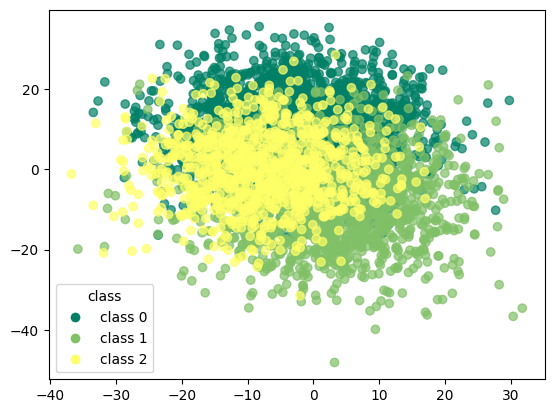

In [ ]:
plt.figure(figsize=(12,8))
scatter = plt.scatter(df_tsne_kmeans.iloc[:, 0], df_tsne_kmeans.iloc[:, 1], 
                      c=df_tsne_kmeans['target'], cmap='summer', alpha=0.7)

unique_labels = np.unique(df_tsne_kmeans['target'])
legend_elements = [Line2D([0], [0], marker='o', color='w', label=f'class {label}',
                          markerfacecolor=scatter.cmap(scatter.norm(label)), markersize=8) 
                   for label in unique_labels]
plt.legend(handles=legend_elements, title="class")
plt.show()

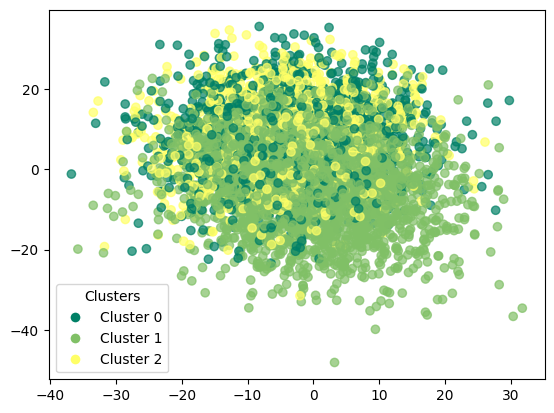

In [ ]:
plt.figure(figsize=(12,8))
scatter = plt.scatter(df_tsne_kmeans.iloc[:, 0], df_tsne_kmeans.iloc[:, 1], 
                      c=df_tsne_kmeans['kmeans_tsne'], cmap='summer', alpha=0.7)
unique_clusters = np.unique(df_tsne_kmeans['kmeans_tsne'])
legend_elements = [Line2D([0], [0], marker='o', color='w', label=f'Cluster {cluster}',
                          markerfacecolor=scatter.cmap(scatter.norm(cluster)), markersize=8) 
                   for cluster in unique_clusters]
plt.legend(handles=legend_elements, title="Clusters")
plt.show()

In [91]:
print(confusion_matrix(df_tsne_kmeans['target'],df_tsne_kmeans['kmeans_tsne']))

[[1303   10 1187]
 [  43 1393   64]
 [ 223  599  178]]


In [92]:
print(classification_report(df_tsne_kmeans['target'],df_tsne_kmeans['kmeans_tsne'])) 

              precision    recall  f1-score   support

           0       0.83      0.52      0.64      2500
           1       0.70      0.93      0.80      1500
           2       0.12      0.18      0.15      1000

    accuracy                           0.57      5000
   macro avg       0.55      0.54      0.53      5000
weighted avg       0.65      0.57      0.59      5000



In [93]:
adjusted_rand_score(df_tsne_kmeans['target'],df_tsne_kmeans['kmeans_tsne'])

0.3911959331087826

In [94]:
normalized_mutual_info_score(df_tsne_kmeans['target'],df_tsne_kmeans['kmeans_tsne'])

0.4241573984929037

In [95]:
silhouette_score(df_tsne_kmeans.drop(columns=['target','kmeans_tsne']).values,df_tsne_kmeans['kmeans_tsne'])

0.04742932877705834

### k-means with umap

In [96]:
kmeans_umap = KMeans(n_clusters=3,init='k-means++',random_state=42)

In [97]:
kmeans_umap.fit(X_umap)

,n_clusters,3
,init,'k-means++'
,n_init,'auto'
,max_iter,300
,tol,0.0001
,verbose,0
,random_state,42
,copy_x,True
,algorithm,'lloyd'


In [98]:
df_umap_kmeans = corr_dataset.copy()

In [99]:
df_umap_kmeans['kmeans_umap'] = kmeans_umap.labels_

In [100]:
df_umap_kmeans

,vab_1,vab_2,vab_3,vab_4,vab_5,vab_6,vab_7,vab_8,vab_9,vab_10,...,vab_13,vab_14,vab_15,vab_16,vab_17,vab_18,vab_19,vab_20,target,kmeans_umap
0,-3.809655,7.452653,1.621266,5.962703,-20.914807,-8.423689,-8.428553,9.096505,21.201735,2.588196,...,13.283968,2.550128,-15.015724,-3.239401,11.489176,10.971089,-8.309928,3.946436,0,2
1,1.718677,17.454119,4.097770,10.133191,4.828268,13.212596,-4.307133,9.559942,-0.863631,20.272341,...,1.397689,-12.102205,-9.325296,4.879407,-10.138815,-0.100435,0.289000,-0.733288,0,0
2,5.739965,13.635069,5.916122,2.276878,-28.387848,-15.937000,-9.527188,10.810504,2.315007,14.456410,...,8.812864,-8.108574,14.782889,-8.321536,-7.157955,6.945980,5.029422,4.222092,0,2
3,-4.238654,24.096863,-9.541265,-2.624971,-17.097469,-13.364005,0.732528,-8.317549,-6.192643,8.681732,...,16.110083,14.050932,-2.290120,-8.231265,-7.154030,-5.391910,2.873629,-1.193631,0,0
4,2.163853,19.171583,22.662716,7.527734,-5.851084,-13.330661,-4.765595,4.136365,10.117018,-6.905581,...,-4.679307,-11.528358,-11.265091,3.498680,-16.718362,-4.685691,5.584172,9.084073,0,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4995,-7.055721,-4.933603,-19.823557,16.800567,-1.211606,-3.712822,-0.637370,13.386826,8.358516,9.134989,...,25.085684,15.552802,0.702485,21.954281,-22.892991,-14.438625,-12.967728,-5.037305,2,1
4996,2.843118,-5.627838,-22.490543,14.119613,1.163222,-6.984198,-7.366098,-6.001417,-11.501928,-12.883781,...,-10.154374,-3.362936,5.876437,10.028466,-12.892411,-5.886227,-5.661087,-11.650669,2,1
4997,-10.554707,-12.143863,-14.814216,-3.226853,-1.324445,4.964251,-9.565188,19.327803,6.022009,0.986751,...,-3.791063,3.040745,2.070332,19.373326,-15.786374,-21.285011,-20.995450,0.845541,2,1
4998,-12.870637,-8.643988,-6.075779,4.484099,-21.532395,-5.134373,-0.485018,-5.882840,-5.950231,-8.705161,...,7.601373,25.977478,-6.552291,7.896572,2.455856,-3.093609,-17.791757,-15.966041,2,1


In [101]:
y_true = df_umap_kmeans['target'].values  
y_kmeans = df_umap_kmeans['kmeans_umap'].values  

conf_matrix = confusion_matrix(y_true, y_kmeans)

row_ind, col_ind = linear_sum_assignment(-conf_matrix)  

mapping = {old: new for old, new in zip(col_ind, row_ind)}
df_umap_kmeans['kmeans_umap'] = np.array([mapping[label] for label in y_kmeans])

print("accuracy before:", np.mean(y_kmeans == y_true))
print("accuracy after:", np.mean(df_umap_kmeans['kmeans_umap'] == y_true))

accuracy before: 0.5152
accuracy after: 0.5674


In [102]:
df_umap_kmeans

,vab_1,vab_2,vab_3,vab_4,vab_5,vab_6,vab_7,vab_8,vab_9,vab_10,...,vab_13,vab_14,vab_15,vab_16,vab_17,vab_18,vab_19,vab_20,target,kmeans_umap
0,-3.809655,7.452653,1.621266,5.962703,-20.914807,-8.423689,-8.428553,9.096505,21.201735,2.588196,...,13.283968,2.550128,-15.015724,-3.239401,11.489176,10.971089,-8.309928,3.946436,0,0
1,1.718677,17.454119,4.097770,10.133191,4.828268,13.212596,-4.307133,9.559942,-0.863631,20.272341,...,1.397689,-12.102205,-9.325296,4.879407,-10.138815,-0.100435,0.289000,-0.733288,0,2
2,5.739965,13.635069,5.916122,2.276878,-28.387848,-15.937000,-9.527188,10.810504,2.315007,14.456410,...,8.812864,-8.108574,14.782889,-8.321536,-7.157955,6.945980,5.029422,4.222092,0,0
3,-4.238654,24.096863,-9.541265,-2.624971,-17.097469,-13.364005,0.732528,-8.317549,-6.192643,8.681732,...,16.110083,14.050932,-2.290120,-8.231265,-7.154030,-5.391910,2.873629,-1.193631,0,2
4,2.163853,19.171583,22.662716,7.527734,-5.851084,-13.330661,-4.765595,4.136365,10.117018,-6.905581,...,-4.679307,-11.528358,-11.265091,3.498680,-16.718362,-4.685691,5.584172,9.084073,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4995,-7.055721,-4.933603,-19.823557,16.800567,-1.211606,-3.712822,-0.637370,13.386826,8.358516,9.134989,...,25.085684,15.552802,0.702485,21.954281,-22.892991,-14.438625,-12.967728,-5.037305,2,1
4996,2.843118,-5.627838,-22.490543,14.119613,1.163222,-6.984198,-7.366098,-6.001417,-11.501928,-12.883781,...,-10.154374,-3.362936,5.876437,10.028466,-12.892411,-5.886227,-5.661087,-11.650669,2,1
4997,-10.554707,-12.143863,-14.814216,-3.226853,-1.324445,4.964251,-9.565188,19.327803,6.022009,0.986751,...,-3.791063,3.040745,2.070332,19.373326,-15.786374,-21.285011,-20.995450,0.845541,2,1
4998,-12.870637,-8.643988,-6.075779,4.484099,-21.532395,-5.134373,-0.485018,-5.882840,-5.950231,-8.705161,...,7.601373,25.977478,-6.552291,7.896572,2.455856,-3.093609,-17.791757,-15.966041,2,1


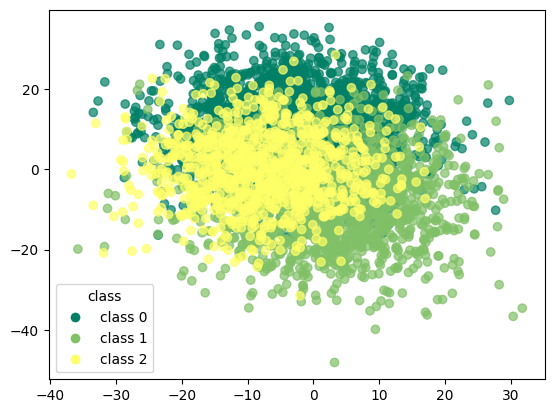

In [103]:
scatter = plt.scatter(df_umap_kmeans.iloc[:, 0], df_umap_kmeans.iloc[:, 1], 
                      c=df_umap_kmeans['target'], cmap='summer', alpha=0.7)

unique_labels = np.unique(df_umap_kmeans['target'])
legend_elements = [Line2D([0], [0], marker='o', color='w', label=f'class {label}',
                          markerfacecolor=scatter.cmap(scatter.norm(label)), markersize=8) 
                   for label in unique_labels]
plt.legend(handles=legend_elements, title="class")
plt.show()

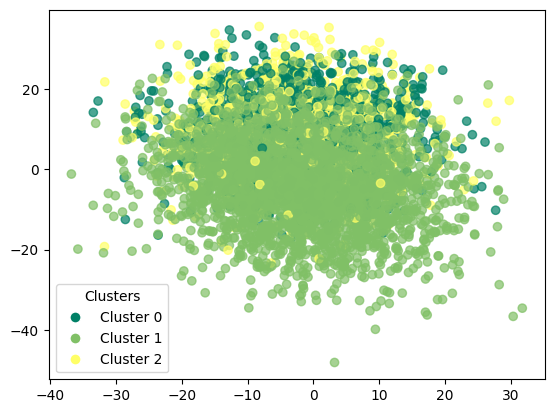

In [104]:
scatter = plt.scatter(df_umap_kmeans.iloc[:, 0], df_umap_kmeans.iloc[:, 1], 
                      c=df_umap_kmeans['kmeans_umap'], cmap='summer', alpha=0.7)
unique_clusters = np.unique(df_umap_kmeans['kmeans_umap'])
legend_elements = [Line2D([0], [0], marker='o', color='w', label=f'Cluster {cluster}',
                          markerfacecolor=scatter.cmap(scatter.norm(cluster)), markersize=8) 
                   for cluster in unique_clusters]
plt.legend(handles=legend_elements, title="Clusters")
plt.show()

In [105]:
print(confusion_matrix(df_umap_kmeans['target'],df_umap_kmeans['kmeans_umap']))

[[1353   31 1116]
 [  14 1456   30]
 [   4  968   28]]


In [106]:
print(classification_report(df_umap_kmeans['target'],df_umap_kmeans['kmeans_umap'])) 

              precision    recall  f1-score   support

           0       0.99      0.54      0.70      2500
           1       0.59      0.97      0.74      1500
           2       0.02      0.03      0.03      1000

    accuracy                           0.57      5000
   macro avg       0.53      0.51      0.49      5000
weighted avg       0.68      0.57      0.58      5000



In [107]:
adjusted_rand_score(df_umap_kmeans['target'],df_umap_kmeans['kmeans_umap'])

0.44448081494975045

In [108]:
normalized_mutual_info_score(df_umap_kmeans['target'],df_umap_kmeans['kmeans_umap'])

0.5737213022923322

In [109]:
silhouette_score(df_umap_kmeans.drop(columns=['target','kmeans_umap']).values,df_umap_kmeans['kmeans_umap'])

0.052957826602758135

## trimmed k-means

In [110]:
def trimmed_clustering(X, n_clusters, trim_fraction=0.1, max_iter=100, tol=1e-4, random_state=42):
    """
    Implementazione iterativa di trimmed k-means.
    
    Parametri
    ---------
    X : array-like (n_samples, n_features)
        Dati di input
    n_clusters : int
        Numero di cluster
    trim_fraction : float (0-1)
        Frazione di punti da scartare come outlier
    max_iter : int
        Numero massimo di iterazioni
    tol : float
        Tolleranza per il criterio di convergenza
    random_state : int
        Seed per la riproducibilità
    
    Ritorna
    -------
    kmeans : modello KMeans fit sui punti "buoni"
    trimmed_indices : indici dei punti non scartati
    outliers : indici dei punti scartati
    """
    rng = np.random.RandomState(random_state)

    init_idx = rng.choice(len(X), n_clusters, replace=False)
    centroids = X[init_idx]

    prev_centroids = None

    for i in range(max_iter):
        distances = np.linalg.norm(X[:, None] - centroids[None, :], axis=2)
        labels = np.argmin(distances, axis=1)
        min_distances = distances[np.arange(len(X)), labels]

        threshold = np.percentile(min_distances, 100 * (1 - trim_fraction))
        mask = min_distances <= threshold

        new_centroids = []
        for k in range(n_clusters):
            cluster_points = X[mask & (labels == k)]
            if len(cluster_points) > 0:
                new_centroids.append(cluster_points.mean(axis=0))
            else:
                new_centroids.append(X[rng.choice(len(X))])
        new_centroids = np.vstack(new_centroids)

        if prev_centroids is not None and np.allclose(new_centroids, prev_centroids, atol=tol):
            break

        prev_centroids = centroids
        centroids = new_centroids

    trimmed_X = X[mask]
    trimmed_indices = np.where(mask)[0]
    kmeans = KMeans(n_clusters=n_clusters, random_state=random_state).fit(trimmed_X)

    return kmeans, trimmed_indices, np.where(~mask)[0]

In [111]:
trimmed_kmeans,trimmmed_indices,_ = trimmed_clustering(X_values,n_clusters=3,trim_fraction=0.1)

In [112]:
trimmed_kmeans

,n_clusters,3
,init,'k-means++'
,n_init,'auto'
,max_iter,300
,tol,0.0001
,verbose,0
,random_state,42
,copy_x,True
,algorithm,'lloyd'


In [113]:
df_trim_kmeans = corr_dataset.copy()

In [114]:
df_trim_kmeans = df_trim_kmeans.iloc[trimmmed_indices]  

In [115]:
df_trim_kmeans['trim_kmeans'] = trimmed_kmeans.labels_

In [116]:
df_trim_kmeans

,vab_1,vab_2,vab_3,vab_4,vab_5,vab_6,vab_7,vab_8,vab_9,vab_10,...,vab_13,vab_14,vab_15,vab_16,vab_17,vab_18,vab_19,vab_20,target,trim_kmeans
0,-3.809655,7.452653,1.621266,5.962703,-20.914807,-8.423689,-8.428553,9.096505,21.201735,2.588196,...,13.283968,2.550128,-15.015724,-3.239401,11.489176,10.971089,-8.309928,3.946436,0,2
1,1.718677,17.454119,4.097770,10.133191,4.828268,13.212596,-4.307133,9.559942,-0.863631,20.272341,...,1.397689,-12.102205,-9.325296,4.879407,-10.138815,-0.100435,0.289000,-0.733288,0,0
2,5.739965,13.635069,5.916122,2.276878,-28.387848,-15.937000,-9.527188,10.810504,2.315007,14.456410,...,8.812864,-8.108574,14.782889,-8.321536,-7.157955,6.945980,5.029422,4.222092,0,0
3,-4.238654,24.096863,-9.541265,-2.624971,-17.097469,-13.364005,0.732528,-8.317549,-6.192643,8.681732,...,16.110083,14.050932,-2.290120,-8.231265,-7.154030,-5.391910,2.873629,-1.193631,0,0
4,2.163853,19.171583,22.662716,7.527734,-5.851084,-13.330661,-4.765595,4.136365,10.117018,-6.905581,...,-4.679307,-11.528358,-11.265091,3.498680,-16.718362,-4.685691,5.584172,9.084073,0,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4995,-7.055721,-4.933603,-19.823557,16.800567,-1.211606,-3.712822,-0.637370,13.386826,8.358516,9.134989,...,25.085684,15.552802,0.702485,21.954281,-22.892991,-14.438625,-12.967728,-5.037305,2,1
4996,2.843118,-5.627838,-22.490543,14.119613,1.163222,-6.984198,-7.366098,-6.001417,-11.501928,-12.883781,...,-10.154374,-3.362936,5.876437,10.028466,-12.892411,-5.886227,-5.661087,-11.650669,2,1
4997,-10.554707,-12.143863,-14.814216,-3.226853,-1.324445,4.964251,-9.565188,19.327803,6.022009,0.986751,...,-3.791063,3.040745,2.070332,19.373326,-15.786374,-21.285011,-20.995450,0.845541,2,1
4998,-12.870637,-8.643988,-6.075779,4.484099,-21.532395,-5.134373,-0.485018,-5.882840,-5.950231,-8.705161,...,7.601373,25.977478,-6.552291,7.896572,2.455856,-3.093609,-17.791757,-15.966041,2,1


In [117]:
y_true = df_trim_kmeans['target'].values  
y_kmeans = df_trim_kmeans['trim_kmeans'].values  

conf_matrix = confusion_matrix(y_true, y_kmeans)

row_ind, col_ind = linear_sum_assignment(-conf_matrix)  

mapping = {old: new for old, new in zip(col_ind, row_ind)}
df_trim_kmeans['trim_kmeans'] = np.array([mapping[label] for label in y_kmeans])

print("accuracy before:", np.mean(y_kmeans == y_true))
print("accuracy after:", np.mean(df_trim_kmeans['trim_kmeans'] == y_true))

accuracy before: 0.5553333333333333
accuracy after: 0.5553333333333333


In [118]:
df_trim_kmeans

,vab_1,vab_2,vab_3,vab_4,vab_5,vab_6,vab_7,vab_8,vab_9,vab_10,...,vab_13,vab_14,vab_15,vab_16,vab_17,vab_18,vab_19,vab_20,target,trim_kmeans
0,-3.809655,7.452653,1.621266,5.962703,-20.914807,-8.423689,-8.428553,9.096505,21.201735,2.588196,...,13.283968,2.550128,-15.015724,-3.239401,11.489176,10.971089,-8.309928,3.946436,0,2
1,1.718677,17.454119,4.097770,10.133191,4.828268,13.212596,-4.307133,9.559942,-0.863631,20.272341,...,1.397689,-12.102205,-9.325296,4.879407,-10.138815,-0.100435,0.289000,-0.733288,0,0
2,5.739965,13.635069,5.916122,2.276878,-28.387848,-15.937000,-9.527188,10.810504,2.315007,14.456410,...,8.812864,-8.108574,14.782889,-8.321536,-7.157955,6.945980,5.029422,4.222092,0,0
3,-4.238654,24.096863,-9.541265,-2.624971,-17.097469,-13.364005,0.732528,-8.317549,-6.192643,8.681732,...,16.110083,14.050932,-2.290120,-8.231265,-7.154030,-5.391910,2.873629,-1.193631,0,0
4,2.163853,19.171583,22.662716,7.527734,-5.851084,-13.330661,-4.765595,4.136365,10.117018,-6.905581,...,-4.679307,-11.528358,-11.265091,3.498680,-16.718362,-4.685691,5.584172,9.084073,0,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4995,-7.055721,-4.933603,-19.823557,16.800567,-1.211606,-3.712822,-0.637370,13.386826,8.358516,9.134989,...,25.085684,15.552802,0.702485,21.954281,-22.892991,-14.438625,-12.967728,-5.037305,2,1
4996,2.843118,-5.627838,-22.490543,14.119613,1.163222,-6.984198,-7.366098,-6.001417,-11.501928,-12.883781,...,-10.154374,-3.362936,5.876437,10.028466,-12.892411,-5.886227,-5.661087,-11.650669,2,1
4997,-10.554707,-12.143863,-14.814216,-3.226853,-1.324445,4.964251,-9.565188,19.327803,6.022009,0.986751,...,-3.791063,3.040745,2.070332,19.373326,-15.786374,-21.285011,-20.995450,0.845541,2,1
4998,-12.870637,-8.643988,-6.075779,4.484099,-21.532395,-5.134373,-0.485018,-5.882840,-5.950231,-8.705161,...,7.601373,25.977478,-6.552291,7.896572,2.455856,-3.093609,-17.791757,-15.966041,2,1


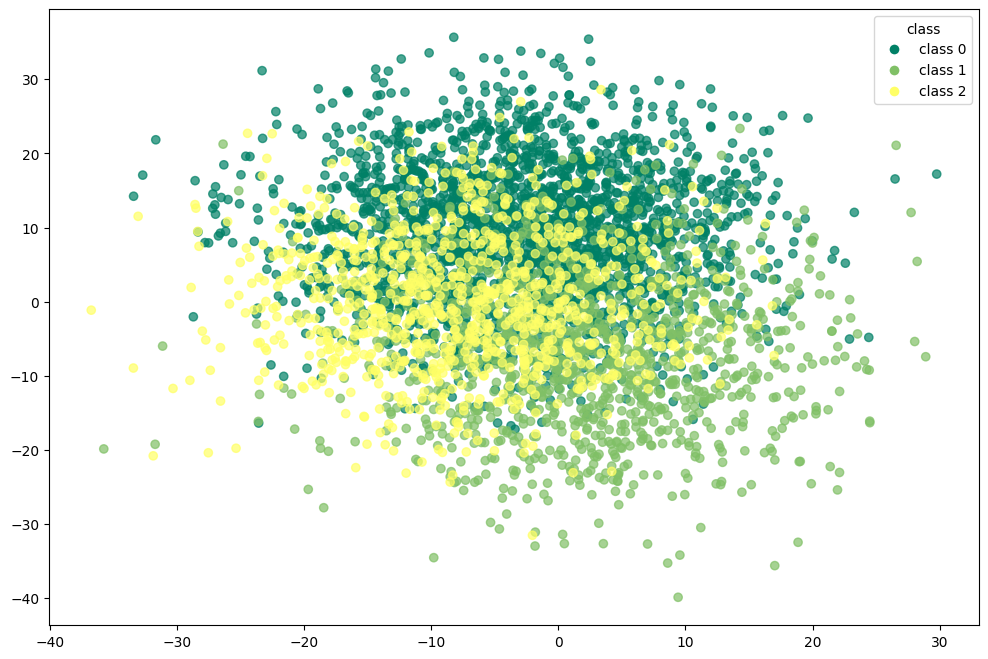

In [119]:
plt.figure(figsize=(12,8))
scatter = plt.scatter(df_trim_kmeans.iloc[:, 0], df_trim_kmeans.iloc[:, 1], 
                      c=df_trim_kmeans['target'], cmap='summer', alpha=0.7)

unique_labels = np.unique(df_trim_kmeans['target'])
legend_elements = [Line2D([0], [0], marker='o', color='w', label=f'class {label}',
                          markerfacecolor=scatter.cmap(scatter.norm(label)), markersize=8) 
                   for label in unique_labels]
plt.legend(handles=legend_elements, title="class")
plt.show()

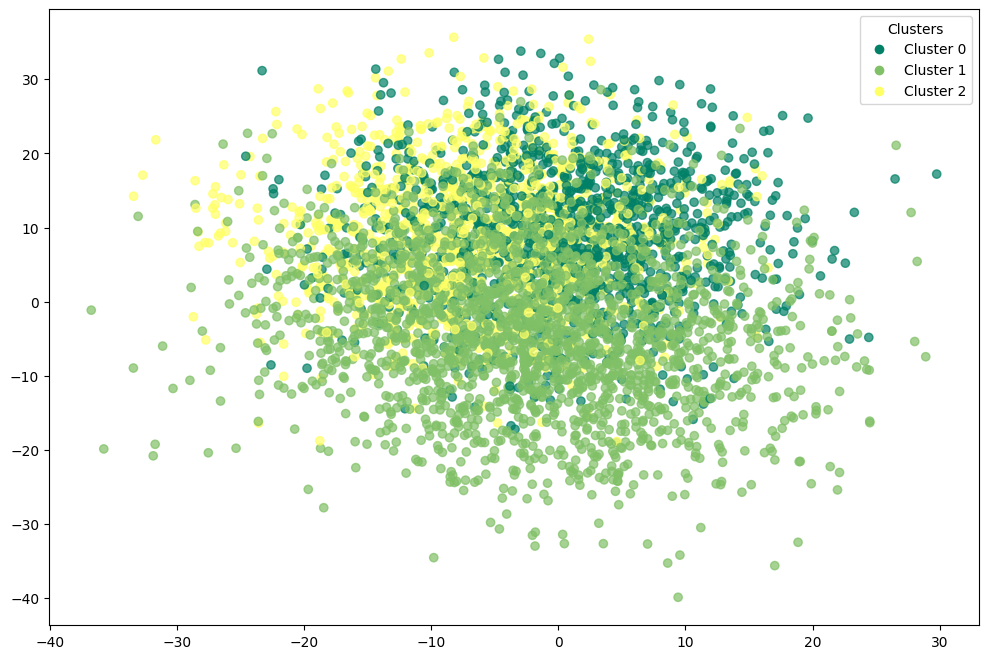

In [120]:
plt.figure(figsize=(12,8))
scatter = plt.scatter(df_trim_kmeans.iloc[:, 0], df_trim_kmeans.iloc[:, 1], 
                      c=df_trim_kmeans['trim_kmeans'], cmap='summer', alpha=0.7)
unique_clusters = np.unique(df_trim_kmeans['trim_kmeans'])
legend_elements = [Line2D([0], [0], marker='o', color='w', label=f'Cluster {cluster}',
                          markerfacecolor=scatter.cmap(scatter.norm(cluster)), markersize=8) 
                   for cluster in unique_clusters]
plt.legend(handles=legend_elements, title="Clusters")
plt.show()

In [121]:
print(confusion_matrix(df_trim_kmeans['target'],df_trim_kmeans['trim_kmeans']))

[[1283   14 1096]
 [   7 1131    9]
 [  10  865   85]]


In [122]:
print(classification_report(df_trim_kmeans['target'],df_trim_kmeans['trim_kmeans']))

              precision    recall  f1-score   support

           0       0.99      0.54      0.69      2393
           1       0.56      0.99      0.72      1147
           2       0.07      0.09      0.08       960

    accuracy                           0.56      4500
   macro avg       0.54      0.54      0.50      4500
weighted avg       0.68      0.56      0.57      4500



In [123]:
adjusted_rand_score(df_trim_kmeans['target'],df_trim_kmeans['trim_kmeans'])

0.43649556578634974

In [124]:
normalized_mutual_info_score(df_trim_kmeans['target'],df_trim_kmeans['trim_kmeans'])

0.5655873219774313

In [125]:
silhouette_score(df_trim_kmeans.drop(columns=['target','trim_kmeans']).values,df_trim_kmeans['trim_kmeans'])

0.06855229111410141

### trimmed k-means with pca

In [126]:
trim_kmeans_pca,trimmmed_indices,_ = trimmed_clustering(X_pca,n_clusters=3,trim_fraction=0.1)

In [127]:
trim_kmeans_pca

,n_clusters,3
,init,'k-means++'
,n_init,'auto'
,max_iter,300
,tol,0.0001
,verbose,0
,random_state,42
,copy_x,True
,algorithm,'lloyd'


In [128]:
df_pca_trim_kmeans = corr_dataset.copy()

In [129]:
df_pca_trim_kmeans = df_pca_trim_kmeans.iloc[trimmmed_indices]  

In [130]:
df_pca_trim_kmeans["trim_kmeans_pca"] = trim_kmeans_pca.labels_

In [131]:
df_pca_trim_kmeans

,vab_1,vab_2,vab_3,vab_4,vab_5,vab_6,vab_7,vab_8,vab_9,vab_10,...,vab_13,vab_14,vab_15,vab_16,vab_17,vab_18,vab_19,vab_20,target,trim_kmeans_pca
0,-3.809655,7.452653,1.621266,5.962703,-20.914807,-8.423689,-8.428553,9.096505,21.201735,2.588196,...,13.283968,2.550128,-15.015724,-3.239401,11.489176,10.971089,-8.309928,3.946436,0,0
1,1.718677,17.454119,4.097770,10.133191,4.828268,13.212596,-4.307133,9.559942,-0.863631,20.272341,...,1.397689,-12.102205,-9.325296,4.879407,-10.138815,-0.100435,0.289000,-0.733288,0,0
2,5.739965,13.635069,5.916122,2.276878,-28.387848,-15.937000,-9.527188,10.810504,2.315007,14.456410,...,8.812864,-8.108574,14.782889,-8.321536,-7.157955,6.945980,5.029422,4.222092,0,0
3,-4.238654,24.096863,-9.541265,-2.624971,-17.097469,-13.364005,0.732528,-8.317549,-6.192643,8.681732,...,16.110083,14.050932,-2.290120,-8.231265,-7.154030,-5.391910,2.873629,-1.193631,0,0
4,2.163853,19.171583,22.662716,7.527734,-5.851084,-13.330661,-4.765595,4.136365,10.117018,-6.905581,...,-4.679307,-11.528358,-11.265091,3.498680,-16.718362,-4.685691,5.584172,9.084073,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4993,-17.461470,-8.190634,-3.154474,20.800761,-0.114423,33.201287,-21.094201,-2.386302,14.836851,-13.779931,...,19.640095,14.353359,-3.587733,0.147658,-10.055688,-9.964368,1.978195,-13.392562,2,2
4996,2.843118,-5.627838,-22.490543,14.119613,1.163222,-6.984198,-7.366098,-6.001417,-11.501928,-12.883781,...,-10.154374,-3.362936,5.876437,10.028466,-12.892411,-5.886227,-5.661087,-11.650669,2,2
4997,-10.554707,-12.143863,-14.814216,-3.226853,-1.324445,4.964251,-9.565188,19.327803,6.022009,0.986751,...,-3.791063,3.040745,2.070332,19.373326,-15.786374,-21.285011,-20.995450,0.845541,2,2
4998,-12.870637,-8.643988,-6.075779,4.484099,-21.532395,-5.134373,-0.485018,-5.882840,-5.950231,-8.705161,...,7.601373,25.977478,-6.552291,7.896572,2.455856,-3.093609,-17.791757,-15.966041,2,2


In [132]:
y_true = df_pca_trim_kmeans['target'].values  
y_kmeans = df_pca_trim_kmeans['trim_kmeans_pca'].values  

conf_matrix = confusion_matrix(y_true, y_kmeans)

row_ind, col_ind = linear_sum_assignment(-conf_matrix)  

mapping = {old: new for old, new in zip(col_ind, row_ind)}
df_pca_trim_kmeans['trim_kmeans_pca'] = np.array([mapping[label] for label in y_kmeans])

print("accuracy before:", np.mean(y_kmeans == y_true))
print("accuracy after:", np.mean(df_pca_trim_kmeans['trim_kmeans_pca'] == y_true))

accuracy before: 0.9653333333333334
accuracy after: 0.9653333333333334


In [133]:
df_pca_trim_kmeans

,vab_1,vab_2,vab_3,vab_4,vab_5,vab_6,vab_7,vab_8,vab_9,vab_10,...,vab_13,vab_14,vab_15,vab_16,vab_17,vab_18,vab_19,vab_20,target,trim_kmeans_pca
0,-3.809655,7.452653,1.621266,5.962703,-20.914807,-8.423689,-8.428553,9.096505,21.201735,2.588196,...,13.283968,2.550128,-15.015724,-3.239401,11.489176,10.971089,-8.309928,3.946436,0,0
1,1.718677,17.454119,4.097770,10.133191,4.828268,13.212596,-4.307133,9.559942,-0.863631,20.272341,...,1.397689,-12.102205,-9.325296,4.879407,-10.138815,-0.100435,0.289000,-0.733288,0,0
2,5.739965,13.635069,5.916122,2.276878,-28.387848,-15.937000,-9.527188,10.810504,2.315007,14.456410,...,8.812864,-8.108574,14.782889,-8.321536,-7.157955,6.945980,5.029422,4.222092,0,0
3,-4.238654,24.096863,-9.541265,-2.624971,-17.097469,-13.364005,0.732528,-8.317549,-6.192643,8.681732,...,16.110083,14.050932,-2.290120,-8.231265,-7.154030,-5.391910,2.873629,-1.193631,0,0
4,2.163853,19.171583,22.662716,7.527734,-5.851084,-13.330661,-4.765595,4.136365,10.117018,-6.905581,...,-4.679307,-11.528358,-11.265091,3.498680,-16.718362,-4.685691,5.584172,9.084073,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4993,-17.461470,-8.190634,-3.154474,20.800761,-0.114423,33.201287,-21.094201,-2.386302,14.836851,-13.779931,...,19.640095,14.353359,-3.587733,0.147658,-10.055688,-9.964368,1.978195,-13.392562,2,2
4996,2.843118,-5.627838,-22.490543,14.119613,1.163222,-6.984198,-7.366098,-6.001417,-11.501928,-12.883781,...,-10.154374,-3.362936,5.876437,10.028466,-12.892411,-5.886227,-5.661087,-11.650669,2,2
4997,-10.554707,-12.143863,-14.814216,-3.226853,-1.324445,4.964251,-9.565188,19.327803,6.022009,0.986751,...,-3.791063,3.040745,2.070332,19.373326,-15.786374,-21.285011,-20.995450,0.845541,2,2
4998,-12.870637,-8.643988,-6.075779,4.484099,-21.532395,-5.134373,-0.485018,-5.882840,-5.950231,-8.705161,...,7.601373,25.977478,-6.552291,7.896572,2.455856,-3.093609,-17.791757,-15.966041,2,2


In [134]:
print(confusion_matrix(df_pca_trim_kmeans['target'],df_pca_trim_kmeans['trim_kmeans_pca']))

[[2290    5   21]
 [  10 1159   79]
 [  10   31  895]]


In [135]:
print(classification_report(df_pca_trim_kmeans['target'],df_pca_trim_kmeans['trim_kmeans_pca']))

              precision    recall  f1-score   support

           0       0.99      0.99      0.99      2316
           1       0.97      0.93      0.95      1248
           2       0.90      0.96      0.93       936

    accuracy                           0.97      4500
   macro avg       0.95      0.96      0.96      4500
weighted avg       0.97      0.97      0.97      4500



In [136]:
adjusted_rand_score(df_pca_trim_kmeans['target'],df_pca_trim_kmeans['trim_kmeans_pca'])

0.9207380172674018

In [137]:
normalized_mutual_info_score(df_pca_trim_kmeans['target'],df_pca_trim_kmeans['trim_kmeans_pca'])

0.850654281608485

In [138]:
silhouette_score(df_pca_trim_kmeans.drop(columns=['target','trim_kmeans_pca']).values,df_pca_trim_kmeans['trim_kmeans_pca'])

0.14383257193348215

### trimmed k-means with t-SNE

In [139]:
trim_kmeans_tsne,trimmmed_indices,_ = trimmed_clustering(X_tsne,n_clusters=3,trim_fraction=0.1)

In [140]:
trim_kmeans_tsne

,n_clusters,3
,init,'k-means++'
,n_init,'auto'
,max_iter,300
,tol,0.0001
,verbose,0
,random_state,42
,copy_x,True
,algorithm,'lloyd'


In [141]:
df_tsne_trim_kmeans = corr_dataset.copy()

In [142]:
df_tsne_trim_kmeans = df_tsne_trim_kmeans.iloc[trimmmed_indices]  

In [143]:
df_tsne_trim_kmeans['trim_kmeans_tsne'] = trim_kmeans_tsne.labels_

In [144]:
df_tsne_trim_kmeans

,vab_1,vab_2,vab_3,vab_4,vab_5,vab_6,vab_7,vab_8,vab_9,vab_10,...,vab_13,vab_14,vab_15,vab_16,vab_17,vab_18,vab_19,vab_20,target,trim_kmeans_tsne
0,-3.809655,7.452653,1.621266,5.962703,-20.914807,-8.423689,-8.428553,9.096505,21.201735,2.588196,...,13.283968,2.550128,-15.015724,-3.239401,11.489176,10.971089,-8.309928,3.946436,0,0
1,1.718677,17.454119,4.097770,10.133191,4.828268,13.212596,-4.307133,9.559942,-0.863631,20.272341,...,1.397689,-12.102205,-9.325296,4.879407,-10.138815,-0.100435,0.289000,-0.733288,0,2
2,5.739965,13.635069,5.916122,2.276878,-28.387848,-15.937000,-9.527188,10.810504,2.315007,14.456410,...,8.812864,-8.108574,14.782889,-8.321536,-7.157955,6.945980,5.029422,4.222092,0,2
3,-4.238654,24.096863,-9.541265,-2.624971,-17.097469,-13.364005,0.732528,-8.317549,-6.192643,8.681732,...,16.110083,14.050932,-2.290120,-8.231265,-7.154030,-5.391910,2.873629,-1.193631,0,2
4,2.163853,19.171583,22.662716,7.527734,-5.851084,-13.330661,-4.765595,4.136365,10.117018,-6.905581,...,-4.679307,-11.528358,-11.265091,3.498680,-16.718362,-4.685691,5.584172,9.084073,0,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4994,-1.292771,-0.901412,-20.343268,10.755621,-9.871131,-2.512106,-21.292048,-21.502411,-14.890008,-16.011761,...,2.716799,5.438874,-4.122562,7.381841,-2.829615,0.836168,-9.468350,-9.502553,2,2
4995,-7.055721,-4.933603,-19.823557,16.800567,-1.211606,-3.712822,-0.637370,13.386826,8.358516,9.134989,...,25.085684,15.552802,0.702485,21.954281,-22.892991,-14.438625,-12.967728,-5.037305,2,0
4996,2.843118,-5.627838,-22.490543,14.119613,1.163222,-6.984198,-7.366098,-6.001417,-11.501928,-12.883781,...,-10.154374,-3.362936,5.876437,10.028466,-12.892411,-5.886227,-5.661087,-11.650669,2,1
4997,-10.554707,-12.143863,-14.814216,-3.226853,-1.324445,4.964251,-9.565188,19.327803,6.022009,0.986751,...,-3.791063,3.040745,2.070332,19.373326,-15.786374,-21.285011,-20.995450,0.845541,2,1


In [145]:
y_true = df_tsne_trim_kmeans['target'].values  
y_kmeans = df_tsne_trim_kmeans['trim_kmeans_tsne'].values  

conf_matrix = confusion_matrix(y_true, y_kmeans)

row_ind, col_ind = linear_sum_assignment(-conf_matrix)  

mapping = {old: new for old, new in zip(col_ind, row_ind)}
df_tsne_trim_kmeans['trim_kmeans_tsne'] = np.array([mapping[label] for label in y_kmeans])

print("accuracy before:", np.mean(y_kmeans == y_true))
print("accuracy after:", np.mean(df_tsne_trim_kmeans['trim_kmeans_tsne'] == y_true))

accuracy before: 0.5848888888888889
accuracy after: 0.5848888888888889


In [146]:
df_tsne_trim_kmeans

,vab_1,vab_2,vab_3,vab_4,vab_5,vab_6,vab_7,vab_8,vab_9,vab_10,...,vab_13,vab_14,vab_15,vab_16,vab_17,vab_18,vab_19,vab_20,target,trim_kmeans_tsne
0,-3.809655,7.452653,1.621266,5.962703,-20.914807,-8.423689,-8.428553,9.096505,21.201735,2.588196,...,13.283968,2.550128,-15.015724,-3.239401,11.489176,10.971089,-8.309928,3.946436,0,0
1,1.718677,17.454119,4.097770,10.133191,4.828268,13.212596,-4.307133,9.559942,-0.863631,20.272341,...,1.397689,-12.102205,-9.325296,4.879407,-10.138815,-0.100435,0.289000,-0.733288,0,2
2,5.739965,13.635069,5.916122,2.276878,-28.387848,-15.937000,-9.527188,10.810504,2.315007,14.456410,...,8.812864,-8.108574,14.782889,-8.321536,-7.157955,6.945980,5.029422,4.222092,0,2
3,-4.238654,24.096863,-9.541265,-2.624971,-17.097469,-13.364005,0.732528,-8.317549,-6.192643,8.681732,...,16.110083,14.050932,-2.290120,-8.231265,-7.154030,-5.391910,2.873629,-1.193631,0,2
4,2.163853,19.171583,22.662716,7.527734,-5.851084,-13.330661,-4.765595,4.136365,10.117018,-6.905581,...,-4.679307,-11.528358,-11.265091,3.498680,-16.718362,-4.685691,5.584172,9.084073,0,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4994,-1.292771,-0.901412,-20.343268,10.755621,-9.871131,-2.512106,-21.292048,-21.502411,-14.890008,-16.011761,...,2.716799,5.438874,-4.122562,7.381841,-2.829615,0.836168,-9.468350,-9.502553,2,2
4995,-7.055721,-4.933603,-19.823557,16.800567,-1.211606,-3.712822,-0.637370,13.386826,8.358516,9.134989,...,25.085684,15.552802,0.702485,21.954281,-22.892991,-14.438625,-12.967728,-5.037305,2,0
4996,2.843118,-5.627838,-22.490543,14.119613,1.163222,-6.984198,-7.366098,-6.001417,-11.501928,-12.883781,...,-10.154374,-3.362936,5.876437,10.028466,-12.892411,-5.886227,-5.661087,-11.650669,2,1
4997,-10.554707,-12.143863,-14.814216,-3.226853,-1.324445,4.964251,-9.565188,19.327803,6.022009,0.986751,...,-3.791063,3.040745,2.070332,19.373326,-15.786374,-21.285011,-20.995450,0.845541,2,1


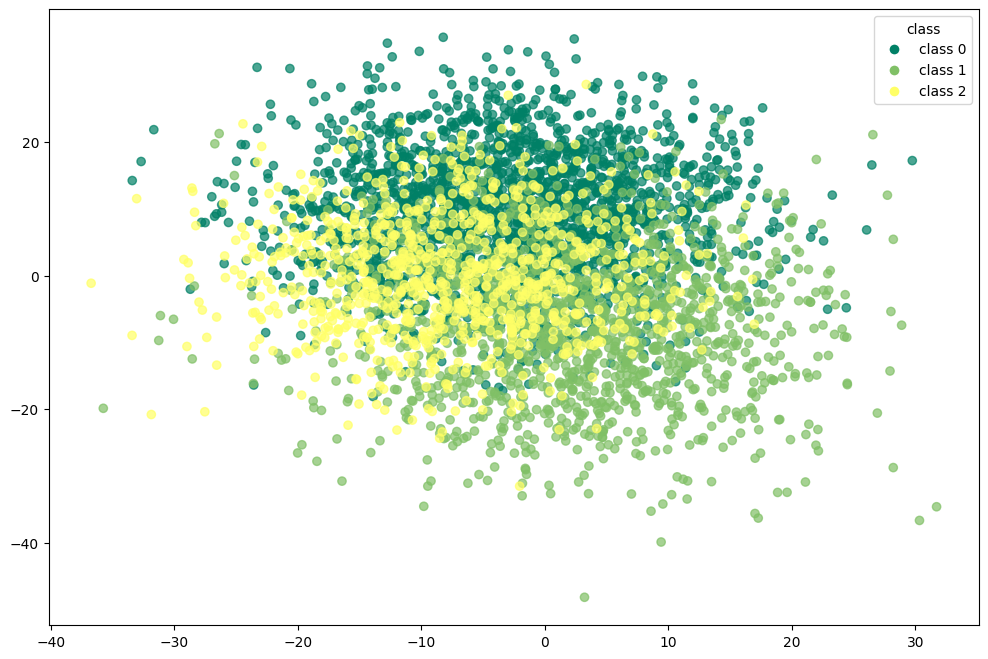

In [147]:
plt.figure(figsize=(12,8))
scatter = plt.scatter(df_tsne_trim_kmeans.iloc[:, 0], df_tsne_trim_kmeans.iloc[:, 1], 
                      c=df_tsne_trim_kmeans['target'], cmap='summer', alpha=0.7)

unique_labels = np.unique(df_tsne_trim_kmeans['target'])
legend_elements = [Line2D([0], [0], marker='o', color='w', label=f'class {label}',
                          markerfacecolor=scatter.cmap(scatter.norm(label)), markersize=8) 
                   for label in unique_labels]
plt.legend(handles=legend_elements, title="class")
plt.show()

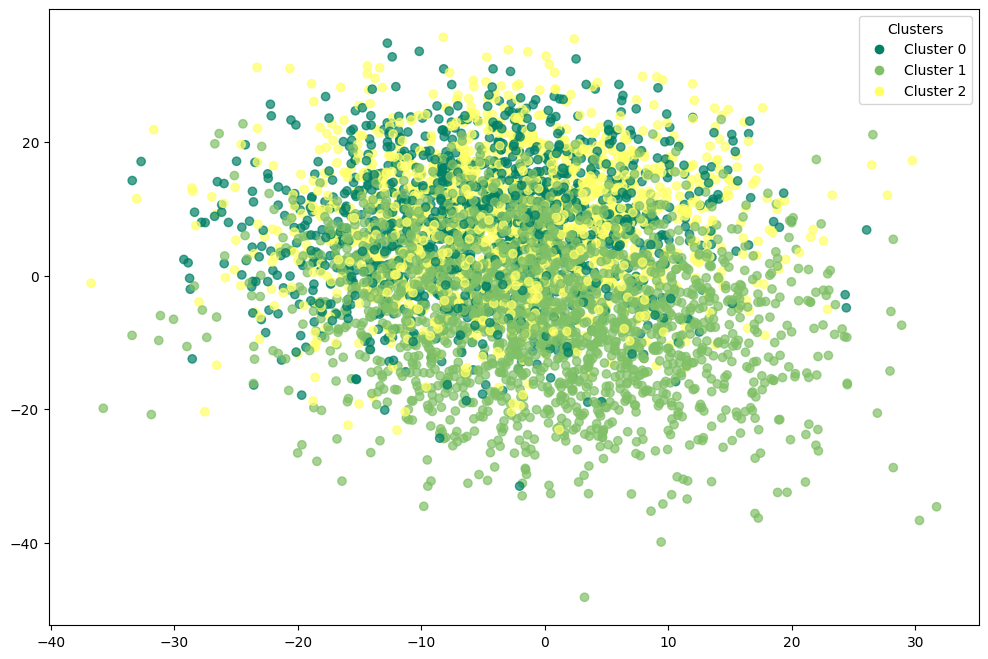

In [148]:
plt.figure(figsize=(12,8))
scatter = plt.scatter(df_tsne_trim_kmeans.iloc[:, 0], df_tsne_trim_kmeans.iloc[:, 1], 
                      c=df_tsne_trim_kmeans['trim_kmeans_tsne'], cmap='summer', alpha=0.7)
unique_clusters = np.unique(df_tsne_trim_kmeans['trim_kmeans_tsne'])
legend_elements = [Line2D([0], [0], marker='o', color='w', label=f'Cluster {cluster}',
                          markerfacecolor=scatter.cmap(scatter.norm(cluster)), markersize=8) 
                   for cluster in unique_clusters]
plt.legend(handles=legend_elements, title="Clusters")
plt.show()

In [149]:
print(confusion_matrix(df_tsne_trim_kmeans['target'],df_tsne_trim_kmeans['trim_kmeans_tsne']))

[[1092    4 1119]
 [  38 1301   29]
 [ 168  510  239]]


In [150]:
print(classification_report(df_tsne_trim_kmeans['target'],df_tsne_trim_kmeans['trim_kmeans_tsne'])) 

              precision    recall  f1-score   support

           0       0.84      0.49      0.62      2215
           1       0.72      0.95      0.82      1368
           2       0.17      0.26      0.21       917

    accuracy                           0.58      4500
   macro avg       0.58      0.57      0.55      4500
weighted avg       0.67      0.58      0.60      4500



In [151]:
adjusted_rand_score(df_tsne_trim_kmeans['target'],df_tsne_trim_kmeans['trim_kmeans_tsne'])

0.4045894302894714

In [152]:
normalized_mutual_info_score(df_tsne_trim_kmeans['target'],df_tsne_trim_kmeans['trim_kmeans_tsne'])

0.44254156316805415

In [153]:
silhouette_score(df_tsne_trim_kmeans.drop(columns=['target','trim_kmeans_tsne']).values,df_tsne_trim_kmeans['trim_kmeans_tsne'])

0.0503289466283409

### trimmed k-means with umap

In [154]:
trim_kmeans_umap,trimmmed_indices,_ = trimmed_clustering(X_umap,n_clusters=3,trim_fraction=0.1)

In [155]:
trim_kmeans_umap

,n_clusters,3
,init,'k-means++'
,n_init,'auto'
,max_iter,300
,tol,0.0001
,verbose,0
,random_state,42
,copy_x,True
,algorithm,'lloyd'


In [156]:
df_umap_trim_kmeans = corr_dataset.copy()

In [157]:
df_umap_trim_kmeans = df_umap_trim_kmeans.iloc[trimmmed_indices]

In [158]:
df_umap_trim_kmeans['trim_kmeans_umap'] = trim_kmeans_umap.labels_

In [159]:
df_umap_trim_kmeans

,vab_1,vab_2,vab_3,vab_4,vab_5,vab_6,vab_7,vab_8,vab_9,vab_10,...,vab_13,vab_14,vab_15,vab_16,vab_17,vab_18,vab_19,vab_20,target,trim_kmeans_umap
0,-3.809655,7.452653,1.621266,5.962703,-20.914807,-8.423689,-8.428553,9.096505,21.201735,2.588196,...,13.283968,2.550128,-15.015724,-3.239401,11.489176,10.971089,-8.309928,3.946436,0,0
1,1.718677,17.454119,4.097770,10.133191,4.828268,13.212596,-4.307133,9.559942,-0.863631,20.272341,...,1.397689,-12.102205,-9.325296,4.879407,-10.138815,-0.100435,0.289000,-0.733288,0,2
2,5.739965,13.635069,5.916122,2.276878,-28.387848,-15.937000,-9.527188,10.810504,2.315007,14.456410,...,8.812864,-8.108574,14.782889,-8.321536,-7.157955,6.945980,5.029422,4.222092,0,0
3,-4.238654,24.096863,-9.541265,-2.624971,-17.097469,-13.364005,0.732528,-8.317549,-6.192643,8.681732,...,16.110083,14.050932,-2.290120,-8.231265,-7.154030,-5.391910,2.873629,-1.193631,0,2
4,2.163853,19.171583,22.662716,7.527734,-5.851084,-13.330661,-4.765595,4.136365,10.117018,-6.905581,...,-4.679307,-11.528358,-11.265091,3.498680,-16.718362,-4.685691,5.584172,9.084073,0,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4995,-7.055721,-4.933603,-19.823557,16.800567,-1.211606,-3.712822,-0.637370,13.386826,8.358516,9.134989,...,25.085684,15.552802,0.702485,21.954281,-22.892991,-14.438625,-12.967728,-5.037305,2,1
4996,2.843118,-5.627838,-22.490543,14.119613,1.163222,-6.984198,-7.366098,-6.001417,-11.501928,-12.883781,...,-10.154374,-3.362936,5.876437,10.028466,-12.892411,-5.886227,-5.661087,-11.650669,2,1
4997,-10.554707,-12.143863,-14.814216,-3.226853,-1.324445,4.964251,-9.565188,19.327803,6.022009,0.986751,...,-3.791063,3.040745,2.070332,19.373326,-15.786374,-21.285011,-20.995450,0.845541,2,1
4998,-12.870637,-8.643988,-6.075779,4.484099,-21.532395,-5.134373,-0.485018,-5.882840,-5.950231,-8.705161,...,7.601373,25.977478,-6.552291,7.896572,2.455856,-3.093609,-17.791757,-15.966041,2,1


In [160]:
y_true = df_umap_trim_kmeans['target'].values  
y_kmeans = df_umap_trim_kmeans['trim_kmeans_umap'].values  

conf_matrix = confusion_matrix(y_true, y_kmeans)

row_ind, col_ind = linear_sum_assignment(-conf_matrix)  

mapping = {old: new for old, new in zip(col_ind, row_ind)}
df_umap_trim_kmeans['trim_kmeans_umap'] = np.array([mapping[label] for label in y_kmeans])

print("accuracy before:", np.mean(y_kmeans == y_true))
print("accuracy after:", np.mean(df_umap_trim_kmeans['trim_kmeans_umap'] == y_true))

accuracy before: 0.5493333333333333
accuracy after: 0.55


In [161]:
df_umap_trim_kmeans

,vab_1,vab_2,vab_3,vab_4,vab_5,vab_6,vab_7,vab_8,vab_9,vab_10,...,vab_13,vab_14,vab_15,vab_16,vab_17,vab_18,vab_19,vab_20,target,trim_kmeans_umap
0,-3.809655,7.452653,1.621266,5.962703,-20.914807,-8.423689,-8.428553,9.096505,21.201735,2.588196,...,13.283968,2.550128,-15.015724,-3.239401,11.489176,10.971089,-8.309928,3.946436,0,2
1,1.718677,17.454119,4.097770,10.133191,4.828268,13.212596,-4.307133,9.559942,-0.863631,20.272341,...,1.397689,-12.102205,-9.325296,4.879407,-10.138815,-0.100435,0.289000,-0.733288,0,0
2,5.739965,13.635069,5.916122,2.276878,-28.387848,-15.937000,-9.527188,10.810504,2.315007,14.456410,...,8.812864,-8.108574,14.782889,-8.321536,-7.157955,6.945980,5.029422,4.222092,0,2
3,-4.238654,24.096863,-9.541265,-2.624971,-17.097469,-13.364005,0.732528,-8.317549,-6.192643,8.681732,...,16.110083,14.050932,-2.290120,-8.231265,-7.154030,-5.391910,2.873629,-1.193631,0,0
4,2.163853,19.171583,22.662716,7.527734,-5.851084,-13.330661,-4.765595,4.136365,10.117018,-6.905581,...,-4.679307,-11.528358,-11.265091,3.498680,-16.718362,-4.685691,5.584172,9.084073,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4995,-7.055721,-4.933603,-19.823557,16.800567,-1.211606,-3.712822,-0.637370,13.386826,8.358516,9.134989,...,25.085684,15.552802,0.702485,21.954281,-22.892991,-14.438625,-12.967728,-5.037305,2,1
4996,2.843118,-5.627838,-22.490543,14.119613,1.163222,-6.984198,-7.366098,-6.001417,-11.501928,-12.883781,...,-10.154374,-3.362936,5.876437,10.028466,-12.892411,-5.886227,-5.661087,-11.650669,2,1
4997,-10.554707,-12.143863,-14.814216,-3.226853,-1.324445,4.964251,-9.565188,19.327803,6.022009,0.986751,...,-3.791063,3.040745,2.070332,19.373326,-15.786374,-21.285011,-20.995450,0.845541,2,1
4998,-12.870637,-8.643988,-6.075779,4.484099,-21.532395,-5.134373,-0.485018,-5.882840,-5.950231,-8.705161,...,7.601373,25.977478,-6.552291,7.896572,2.455856,-3.093609,-17.791757,-15.966041,2,1


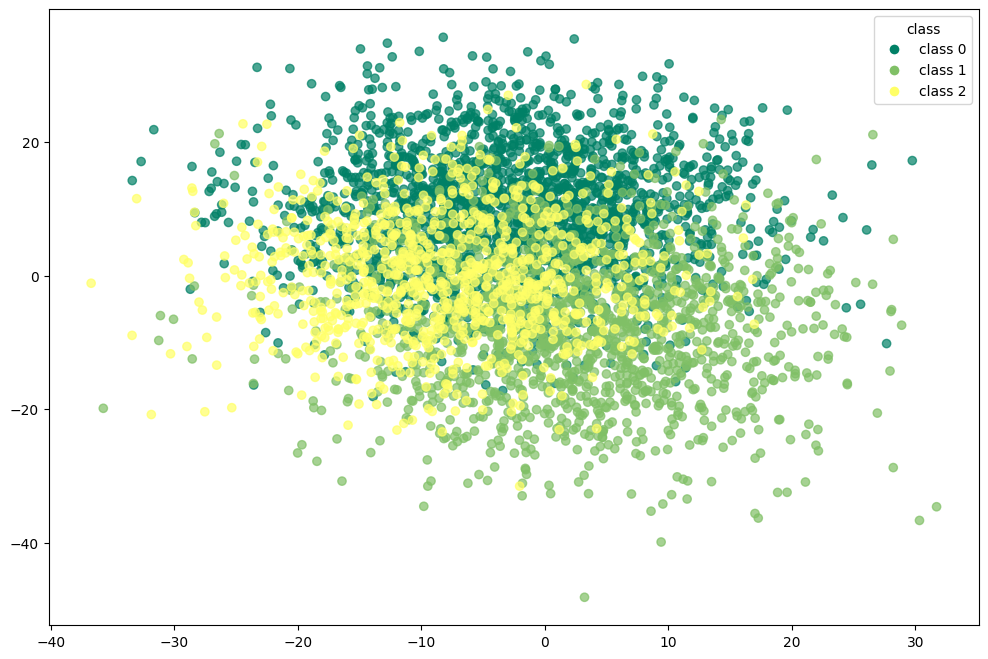

In [162]:
plt.figure(figsize=(12,8))
scatter = plt.scatter(df_umap_trim_kmeans.iloc[:, 0], df_umap_trim_kmeans.iloc[:, 1], 
                      c=df_umap_trim_kmeans['target'], cmap='summer', alpha=0.7)

unique_labels = np.unique(df_umap_trim_kmeans['target'])
legend_elements = [Line2D([0], [0], marker='o', color='w', label=f'class {label}',
                          markerfacecolor=scatter.cmap(scatter.norm(label)), markersize=8) 
                   for label in unique_labels]
plt.legend(handles=legend_elements, title="class")
plt.show()

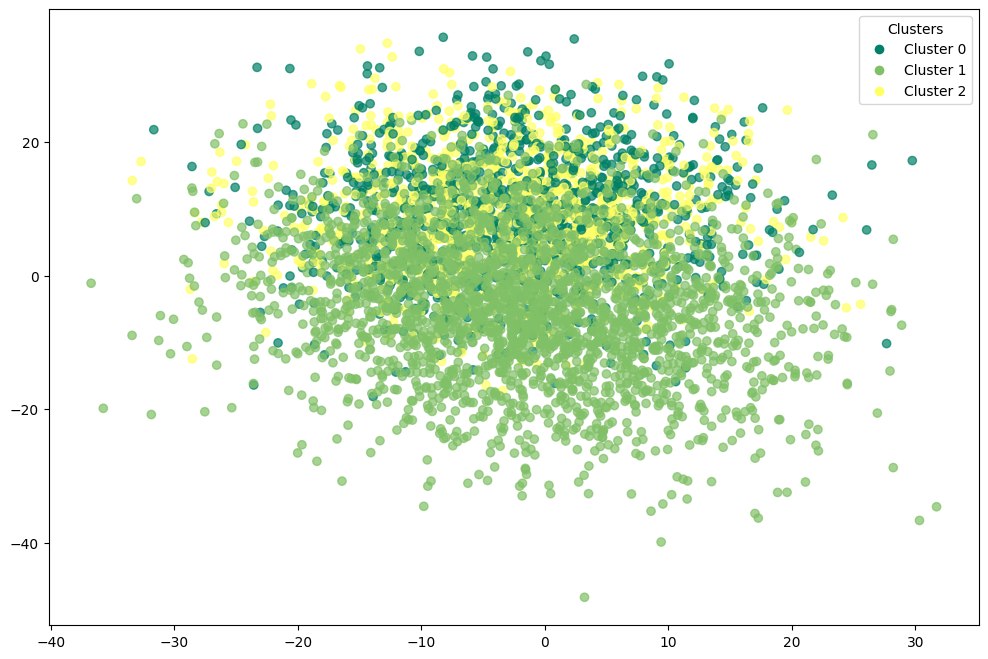

In [163]:
plt.figure(figsize=(12,8))
scatter = plt.scatter(df_umap_trim_kmeans.iloc[:, 0], df_umap_trim_kmeans.iloc[:, 1], 
                      c=df_umap_trim_kmeans['trim_kmeans_umap'], cmap='summer', alpha=0.7)
unique_clusters = np.unique(df_umap_trim_kmeans['trim_kmeans_umap'])
legend_elements = [Line2D([0], [0], marker='o', color='w', label=f'Cluster {cluster}',
                          markerfacecolor=scatter.cmap(scatter.norm(cluster)), markersize=8) 
                   for cluster in unique_clusters]
plt.legend(handles=legend_elements, title="Clusters")
plt.show()

In [164]:
print(confusion_matrix(df_umap_trim_kmeans['target'],df_umap_trim_kmeans['trim_kmeans_umap']))

[[1056   18 1050]
 [   4 1419    6]
 [   3  944    0]]


In [165]:
print(classification_report(df_umap_trim_kmeans['target'],df_umap_trim_kmeans['trim_kmeans_umap'])) 

              precision    recall  f1-score   support

           0       0.99      0.50      0.66      2124
           1       0.60      0.99      0.74      1429
           2       0.00      0.00      0.00       947

    accuracy                           0.55      4500
   macro avg       0.53      0.50      0.47      4500
weighted avg       0.66      0.55      0.55      4500



In [166]:
adjusted_rand_score(df_umap_trim_kmeans['target'],df_umap_trim_kmeans['trim_kmeans_umap'])

0.4632713808848713

In [167]:
normalized_mutual_info_score(df_umap_trim_kmeans['target'],df_umap_trim_kmeans['trim_kmeans_umap'])

0.6308158128152151

In [168]:
silhouette_score(df_umap_trim_kmeans.drop(columns=['target','trim_kmeans_umap']).values,df_umap_trim_kmeans['trim_kmeans_umap'])

0.06464609032417683

## dbscan

In [169]:
def plot_k_distance_graph(X, k):
    neigh = NearestNeighbors(n_neighbors=k)
    neigh.fit(X)
    distances, _ = neigh.kneighbors(X)
    distances = np.sort(distances[:, k-1])
    plt.figure(figsize=(10, 6))
    plt.plot(distances)
    plt.xlabel('Points')
    plt.ylabel(f'{k}-th nearest neighbor distance')
    plt.title('K-distance Graph')
    plt.show()

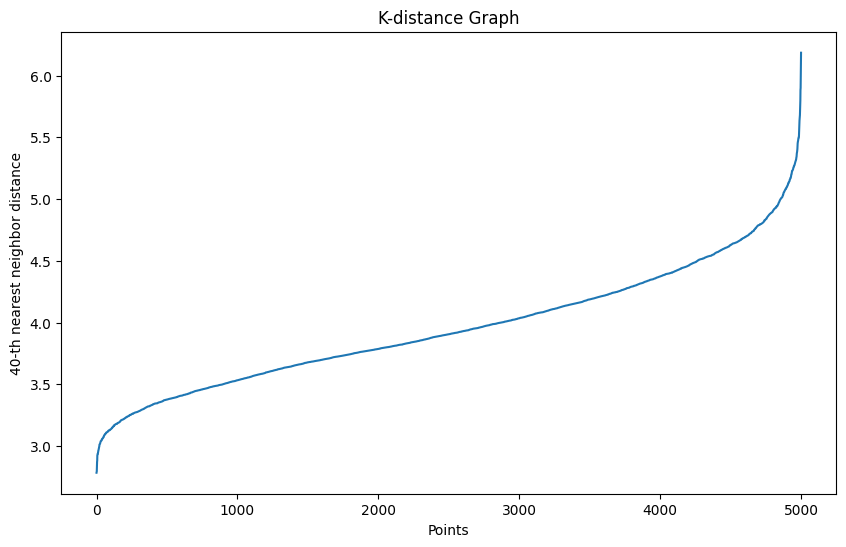

In [170]:
plot_k_distance_graph(X_values,k=40) 

In [171]:
dbscan = DBSCAN(eps=5,min_samples=40) # min_samples = 2*n_features

In [172]:
dbscan.fit(X_values)

,eps,5
,min_samples,40
,metric,'euclidean'
,metric_params,None
,algorithm,'auto'
,leaf_size,30
,p,None
,n_jobs,None


In [173]:
df_dbscan = corr_dataset.copy()

In [174]:
df_dbscan['dbscan'] = dbscan.labels_

In [175]:
y_true = df_dbscan['target'].values  
y_kmeans = df_dbscan['dbscan'].values  

conf_matrix = confusion_matrix(y_true, y_kmeans)

row_ind, col_ind = linear_sum_assignment(-conf_matrix)  

mapping = {old: new for old, new in zip(col_ind, row_ind)}
df_dbscan['dbscan'] = np.array([mapping[label] if label in mapping else -1 for label in y_kmeans])

print("accuracy before:", np.mean(y_kmeans == y_true))
print("accuracy after:", np.mean(df_dbscan['dbscan'] == y_true))

accuracy before: 0.5
accuracy after: 0.2


In [176]:
df_dbscan

,vab_1,vab_2,vab_3,vab_4,vab_5,vab_6,vab_7,vab_8,vab_9,vab_10,...,vab_13,vab_14,vab_15,vab_16,vab_17,vab_18,vab_19,vab_20,target,dbscan
0,-3.809655,7.452653,1.621266,5.962703,-20.914807,-8.423689,-8.428553,9.096505,21.201735,2.588196,...,13.283968,2.550128,-15.015724,-3.239401,11.489176,10.971089,-8.309928,3.946436,0,2
1,1.718677,17.454119,4.097770,10.133191,4.828268,13.212596,-4.307133,9.559942,-0.863631,20.272341,...,1.397689,-12.102205,-9.325296,4.879407,-10.138815,-0.100435,0.289000,-0.733288,0,2
2,5.739965,13.635069,5.916122,2.276878,-28.387848,-15.937000,-9.527188,10.810504,2.315007,14.456410,...,8.812864,-8.108574,14.782889,-8.321536,-7.157955,6.945980,5.029422,4.222092,0,2
3,-4.238654,24.096863,-9.541265,-2.624971,-17.097469,-13.364005,0.732528,-8.317549,-6.192643,8.681732,...,16.110083,14.050932,-2.290120,-8.231265,-7.154030,-5.391910,2.873629,-1.193631,0,2
4,2.163853,19.171583,22.662716,7.527734,-5.851084,-13.330661,-4.765595,4.136365,10.117018,-6.905581,...,-4.679307,-11.528358,-11.265091,3.498680,-16.718362,-4.685691,5.584172,9.084073,0,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4995,-7.055721,-4.933603,-19.823557,16.800567,-1.211606,-3.712822,-0.637370,13.386826,8.358516,9.134989,...,25.085684,15.552802,0.702485,21.954281,-22.892991,-14.438625,-12.967728,-5.037305,2,2
4996,2.843118,-5.627838,-22.490543,14.119613,1.163222,-6.984198,-7.366098,-6.001417,-11.501928,-12.883781,...,-10.154374,-3.362936,5.876437,10.028466,-12.892411,-5.886227,-5.661087,-11.650669,2,2
4997,-10.554707,-12.143863,-14.814216,-3.226853,-1.324445,4.964251,-9.565188,19.327803,6.022009,0.986751,...,-3.791063,3.040745,2.070332,19.373326,-15.786374,-21.285011,-20.995450,0.845541,2,2
4998,-12.870637,-8.643988,-6.075779,4.484099,-21.532395,-5.134373,-0.485018,-5.882840,-5.950231,-8.705161,...,7.601373,25.977478,-6.552291,7.896572,2.455856,-3.093609,-17.791757,-15.966041,2,2


In [177]:
print(df_dbscan['dbscan'].value_counts())

dbscan
 2    4998
-1       2
Name: count, dtype: int64


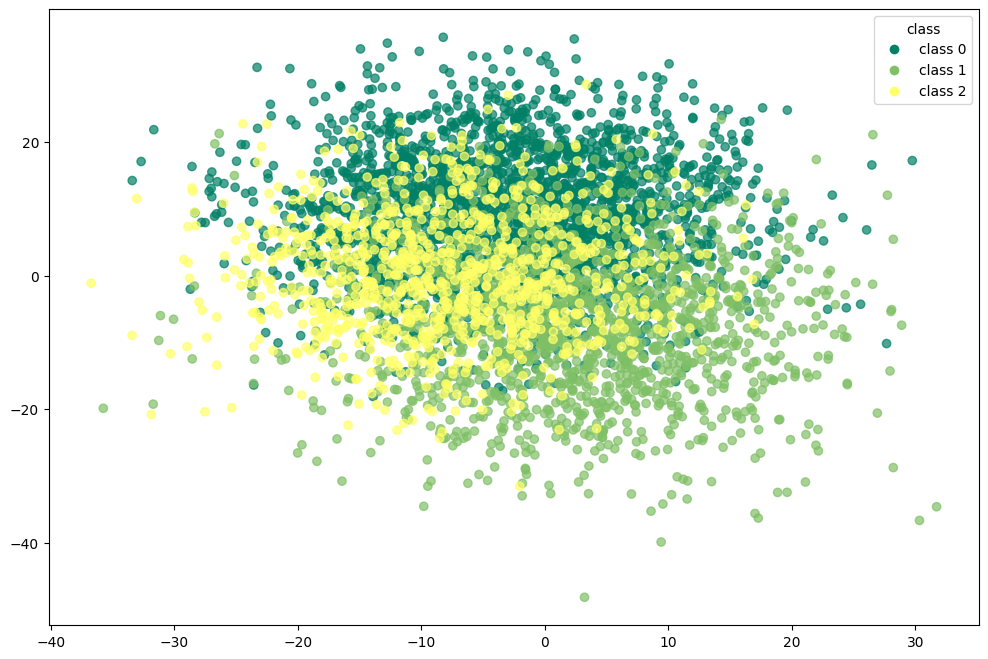

In [178]:
plt.figure(figsize=(12,8))
scatter = plt.scatter(df_dbscan.iloc[:, 0], df_dbscan.iloc[:, 1], 
                      c=df_dbscan['target'], cmap='summer', alpha=0.7)

unique_labels = np.unique(df_dbscan['target'])
legend_elements = [Line2D([0], [0], marker='o', color='w', label=f'class {label}',
                          markerfacecolor=scatter.cmap(scatter.norm(label)), markersize=8) 
                   for label in unique_labels]
plt.legend(handles=legend_elements, title="class")
plt.show()

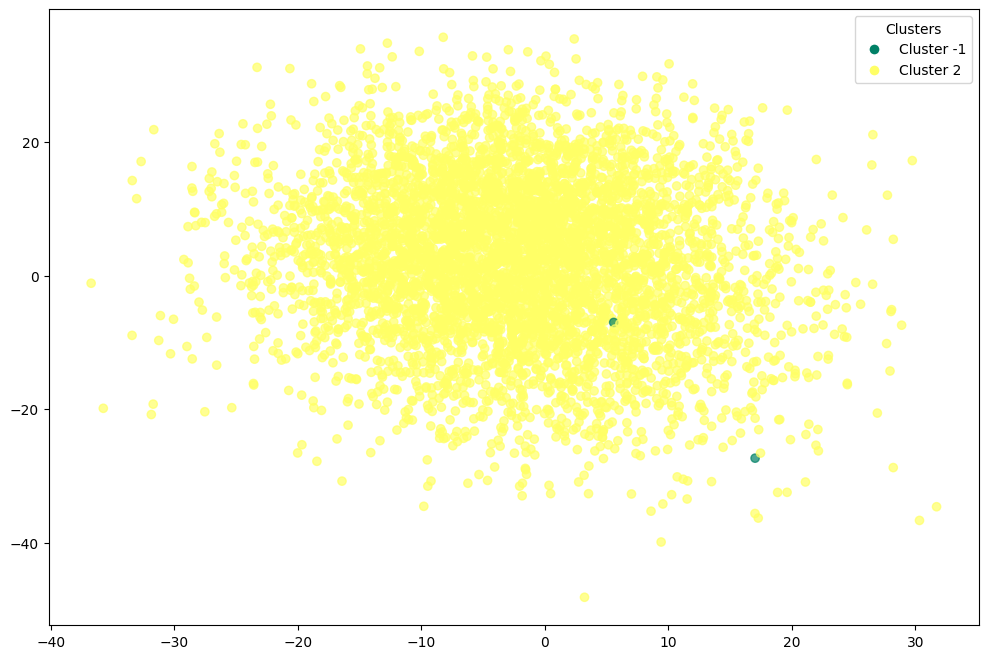

In [179]:
plt.figure(figsize=(12,8))
scatter = plt.scatter(df_dbscan.iloc[:, 0], df_dbscan.iloc[:, 1], 
                      c=df_dbscan['dbscan'], cmap='summer', alpha=0.7)
unique_clusters = np.unique(df_dbscan['dbscan'])
legend_elements = [Line2D([0], [0], marker='o', color='w', label=f'Cluster {cluster}',
                          markerfacecolor=scatter.cmap(scatter.norm(cluster)), markersize=8) 
                   for cluster in unique_clusters]
plt.legend(handles=legend_elements, title="Clusters")
plt.show()

In [180]:
print(confusion_matrix(df_dbscan['target'],df_dbscan['dbscan']))

[[   0    0    0    0]
 [   0    0    0 2500]
 [   2    0    0 1498]
 [   0    0    0 1000]]


In [181]:
print(classification_report(df_dbscan['target'],df_dbscan['dbscan']))

              precision    recall  f1-score   support

          -1       0.00      0.00      0.00         0
           0       0.00      0.00      0.00      2500
           1       0.00      0.00      0.00      1500
           2       0.20      1.00      0.33      1000

    accuracy                           0.20      5000
   macro avg       0.05      0.25      0.08      5000
weighted avg       0.04      0.20      0.07      5000



In [182]:
adjusted_rand_score(df_dbscan['target'],df_dbscan['dbscan'])

0.00020683576983672092

In [183]:
normalized_mutual_info_score(df_dbscan['target'],df_dbscan['dbscan'])

0.000932605559743938

In [184]:
silhouette_score(df_dbscan.drop(columns=['target','dbscan']).values,df_dbscan['dbscan'])

0.25585540957364683

### dbscan with pca

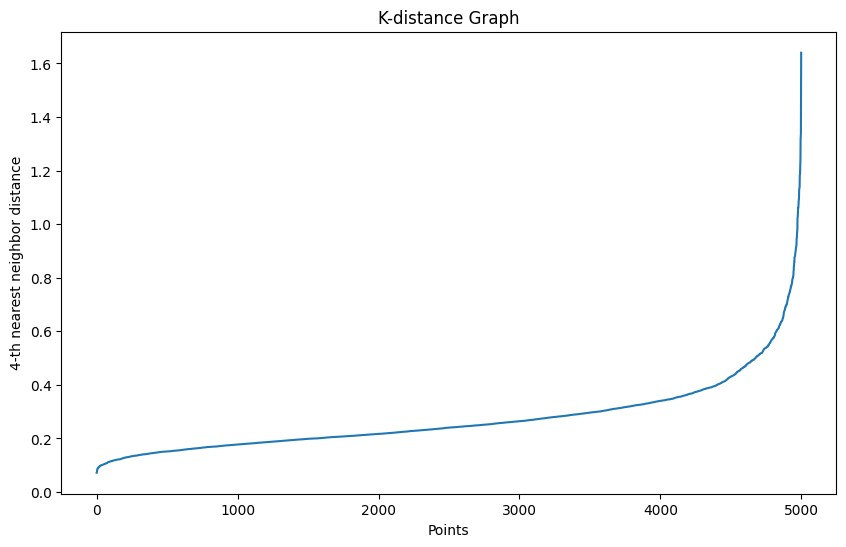

In [185]:
plot_k_distance_graph(X_pca,k=4)

In [186]:
dbscan_pca = DBSCAN(eps=0.6,min_samples=4)

In [187]:
dbscan_pca.fit(X_pca)

,eps,0.6
,min_samples,4
,metric,'euclidean'
,metric_params,None
,algorithm,'auto'
,leaf_size,30
,p,None
,n_jobs,None


In [188]:
df_pca_dbscan = corr_dataset.copy()

In [189]:
df_pca_dbscan["dbscan_pca"] = dbscan_pca.labels_

In [190]:
y_true = df_pca_dbscan['target'].values  
y_kmeans = df_pca_dbscan['dbscan_pca'].values  

conf_matrix = confusion_matrix(y_true, y_kmeans)

row_ind, col_ind = linear_sum_assignment(-conf_matrix)  

mapping = {old: new for old, new in zip(col_ind, row_ind)}
df_pca_dbscan['dbscan_pca'] = np.array([mapping[label] if label in mapping else -1 for label in y_kmeans])

print("accuracy before:", np.mean(y_kmeans == y_true))
print("accuracy after:", np.mean(df_pca_dbscan['dbscan_pca'] == y_true))

accuracy before: 0.4964
accuracy after: 0.1978


In [191]:
df_pca_dbscan

,vab_1,vab_2,vab_3,vab_4,vab_5,vab_6,vab_7,vab_8,vab_9,vab_10,...,vab_13,vab_14,vab_15,vab_16,vab_17,vab_18,vab_19,vab_20,target,dbscan_pca
0,-3.809655,7.452653,1.621266,5.962703,-20.914807,-8.423689,-8.428553,9.096505,21.201735,2.588196,...,13.283968,2.550128,-15.015724,-3.239401,11.489176,10.971089,-8.309928,3.946436,0,2
1,1.718677,17.454119,4.097770,10.133191,4.828268,13.212596,-4.307133,9.559942,-0.863631,20.272341,...,1.397689,-12.102205,-9.325296,4.879407,-10.138815,-0.100435,0.289000,-0.733288,0,2
2,5.739965,13.635069,5.916122,2.276878,-28.387848,-15.937000,-9.527188,10.810504,2.315007,14.456410,...,8.812864,-8.108574,14.782889,-8.321536,-7.157955,6.945980,5.029422,4.222092,0,2
3,-4.238654,24.096863,-9.541265,-2.624971,-17.097469,-13.364005,0.732528,-8.317549,-6.192643,8.681732,...,16.110083,14.050932,-2.290120,-8.231265,-7.154030,-5.391910,2.873629,-1.193631,0,2
4,2.163853,19.171583,22.662716,7.527734,-5.851084,-13.330661,-4.765595,4.136365,10.117018,-6.905581,...,-4.679307,-11.528358,-11.265091,3.498680,-16.718362,-4.685691,5.584172,9.084073,0,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4995,-7.055721,-4.933603,-19.823557,16.800567,-1.211606,-3.712822,-0.637370,13.386826,8.358516,9.134989,...,25.085684,15.552802,0.702485,21.954281,-22.892991,-14.438625,-12.967728,-5.037305,2,2
4996,2.843118,-5.627838,-22.490543,14.119613,1.163222,-6.984198,-7.366098,-6.001417,-11.501928,-12.883781,...,-10.154374,-3.362936,5.876437,10.028466,-12.892411,-5.886227,-5.661087,-11.650669,2,2
4997,-10.554707,-12.143863,-14.814216,-3.226853,-1.324445,4.964251,-9.565188,19.327803,6.022009,0.986751,...,-3.791063,3.040745,2.070332,19.373326,-15.786374,-21.285011,-20.995450,0.845541,2,2
4998,-12.870637,-8.643988,-6.075779,4.484099,-21.532395,-5.134373,-0.485018,-5.882840,-5.950231,-8.705161,...,7.601373,25.977478,-6.552291,7.896572,2.455856,-3.093609,-17.791757,-15.966041,2,2


In [192]:
print(df_pca_dbscan['dbscan_pca'].value_counts())

dbscan_pca
 2    4900
-1      93
 1       7
Name: count, dtype: int64


In [193]:
print(confusion_matrix(df_pca_dbscan['target'],df_pca_dbscan['dbscan_pca']))

[[   0    0    0    0]
 [  25    0    0 2475]
 [  50    0    7 1443]
 [  18    0    0  982]]


In [194]:
print(classification_report(df_pca_dbscan['target'],df_pca_dbscan['dbscan_pca']))

              precision    recall  f1-score   support

          -1       0.00      0.00      0.00         0
           0       0.00      0.00      0.00      2500
           1       1.00      0.00      0.01      1500
           2       0.20      0.98      0.33      1000

    accuracy                           0.20      5000
   macro avg       0.30      0.25      0.09      5000
weighted avg       0.34      0.20      0.07      5000



In [195]:
adjusted_rand_score(df_pca_dbscan['target'],df_pca_dbscan['dbscan_pca'])

0.0063506654986080205

In [196]:
normalized_mutual_info_score(df_pca_dbscan['target'],df_pca_dbscan['dbscan_pca'])

0.007723278338346958

In [197]:
silhouette_score(df_pca_dbscan.drop(columns=['target','dbscan_pca']).values,df_pca_dbscan['dbscan_pca'])

-0.0076408569275571965

### dbscan with t-SNE

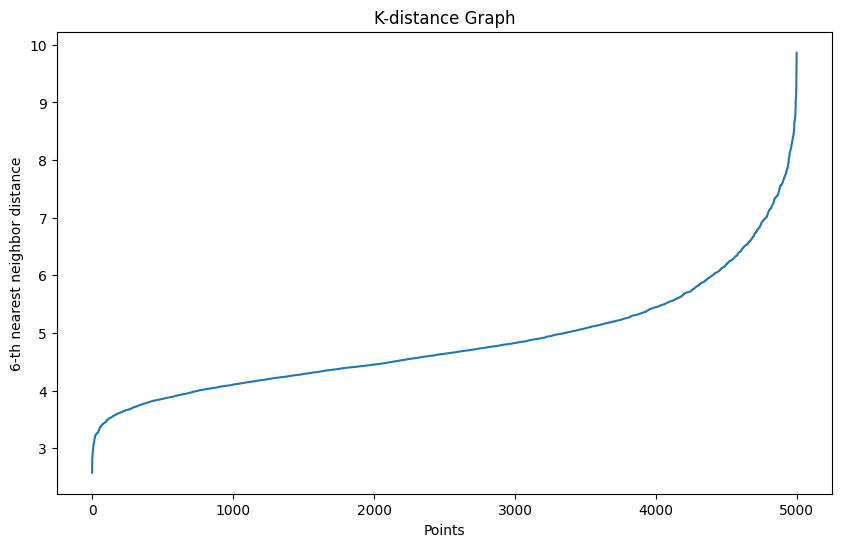

In [198]:
plot_k_distance_graph(X_tsne,k=6)

In [199]:
dbscan_tsne = DBSCAN(eps=7,min_samples=6)

In [200]:
dbscan_tsne.fit(X_tsne)

,eps,7
,min_samples,6
,metric,'euclidean'
,metric_params,None
,algorithm,'auto'
,leaf_size,30
,p,None
,n_jobs,None


In [201]:
df_tsne_dbscan = corr_dataset.copy()

In [202]:
df_tsne_dbscan['dbscan_tsne'] = dbscan_tsne.labels_

In [203]:
y_true = df_tsne_dbscan['target'].values  
y_kmeans = df_tsne_dbscan['dbscan_tsne'].values  

conf_matrix = confusion_matrix(y_true, y_kmeans)

row_ind, col_ind = linear_sum_assignment(-conf_matrix)  

mapping = {old: new for old, new in zip(col_ind, row_ind)}
df_tsne_dbscan['dbscan_tsne'] = np.array([mapping[label] if label in mapping else -1 for label in y_kmeans])

print("accuracy before:", np.mean(y_kmeans == y_true))
print("accuracy after:", np.mean(df_tsne_dbscan['dbscan_tsne'] == y_true))

accuracy before: 0.4966
accuracy after: 0.1992


In [204]:
df_tsne_dbscan

,vab_1,vab_2,vab_3,vab_4,vab_5,vab_6,vab_7,vab_8,vab_9,vab_10,...,vab_13,vab_14,vab_15,vab_16,vab_17,vab_18,vab_19,vab_20,target,dbscan_tsne
0,-3.809655,7.452653,1.621266,5.962703,-20.914807,-8.423689,-8.428553,9.096505,21.201735,2.588196,...,13.283968,2.550128,-15.015724,-3.239401,11.489176,10.971089,-8.309928,3.946436,0,2
1,1.718677,17.454119,4.097770,10.133191,4.828268,13.212596,-4.307133,9.559942,-0.863631,20.272341,...,1.397689,-12.102205,-9.325296,4.879407,-10.138815,-0.100435,0.289000,-0.733288,0,2
2,5.739965,13.635069,5.916122,2.276878,-28.387848,-15.937000,-9.527188,10.810504,2.315007,14.456410,...,8.812864,-8.108574,14.782889,-8.321536,-7.157955,6.945980,5.029422,4.222092,0,2
3,-4.238654,24.096863,-9.541265,-2.624971,-17.097469,-13.364005,0.732528,-8.317549,-6.192643,8.681732,...,16.110083,14.050932,-2.290120,-8.231265,-7.154030,-5.391910,2.873629,-1.193631,0,2
4,2.163853,19.171583,22.662716,7.527734,-5.851084,-13.330661,-4.765595,4.136365,10.117018,-6.905581,...,-4.679307,-11.528358,-11.265091,3.498680,-16.718362,-4.685691,5.584172,9.084073,0,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4995,-7.055721,-4.933603,-19.823557,16.800567,-1.211606,-3.712822,-0.637370,13.386826,8.358516,9.134989,...,25.085684,15.552802,0.702485,21.954281,-22.892991,-14.438625,-12.967728,-5.037305,2,2
4996,2.843118,-5.627838,-22.490543,14.119613,1.163222,-6.984198,-7.366098,-6.001417,-11.501928,-12.883781,...,-10.154374,-3.362936,5.876437,10.028466,-12.892411,-5.886227,-5.661087,-11.650669,2,2
4997,-10.554707,-12.143863,-14.814216,-3.226853,-1.324445,4.964251,-9.565188,19.327803,6.022009,0.986751,...,-3.791063,3.040745,2.070332,19.373326,-15.786374,-21.285011,-20.995450,0.845541,2,2
4998,-12.870637,-8.643988,-6.075779,4.484099,-21.532395,-5.134373,-0.485018,-5.882840,-5.950231,-8.705161,...,7.601373,25.977478,-6.552291,7.896572,2.455856,-3.093609,-17.791757,-15.966041,2,2


In [205]:
print(df_tsne_dbscan['dbscan_tsne'].value_counts())

dbscan_tsne
 2    4960
-1      40
Name: count, dtype: int64


In [206]:
print(confusion_matrix(df_tsne_dbscan['target'],df_tsne_dbscan['dbscan_tsne']))

[[   0    0    0    0]
 [  17    0    0 2483]
 [  19    0    0 1481]
 [   4    0    0  996]]


In [207]:
print(classification_report(df_tsne_dbscan['target'],df_tsne_dbscan['dbscan_tsne']))

              precision    recall  f1-score   support

          -1       0.00      0.00      0.00         0
           0       0.00      0.00      0.00      2500
           1       0.00      0.00      0.00      1500
           2       0.20      1.00      0.33      1000

    accuracy                           0.20      5000
   macro avg       0.05      0.25      0.08      5000
weighted avg       0.04      0.20      0.07      5000



In [208]:
adjusted_rand_score(df_tsne_dbscan['target'],df_tsne_dbscan['dbscan_tsne'])

0.00026833252702690024

In [209]:
normalized_mutual_info_score(df_tsne_dbscan['target'],df_tsne_dbscan['dbscan_tsne'])

0.001197517238815725

In [210]:
# silhouette_score(df_tsne_dbscan.drop(columns=['target','dbscan_tsne']).values,df_tsne_dbscan['dbscan_tsne'])

### dbscan with umap

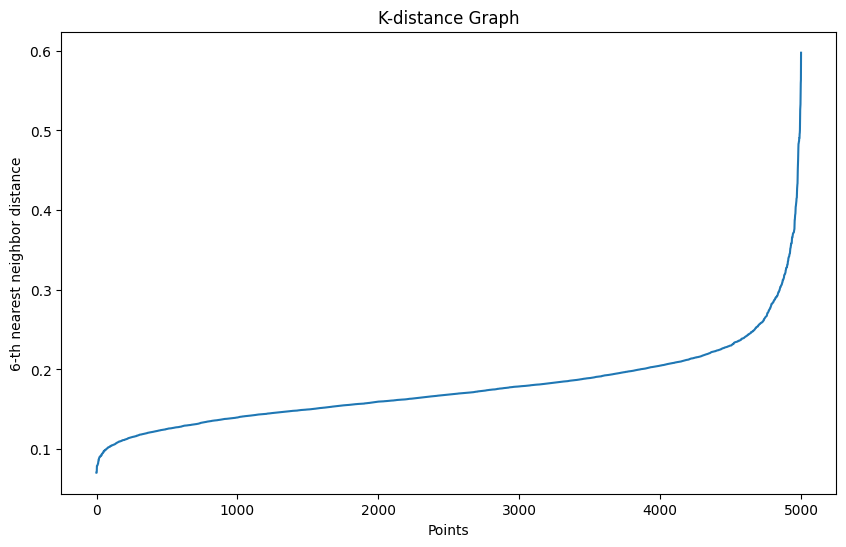

In [211]:
plot_k_distance_graph(X_umap,k=6)

In [212]:
dbscan_umap = DBSCAN(eps=0.6,min_samples=6)

In [213]:
dbscan_umap.fit(X_umap)

,eps,0.6
,min_samples,6
,metric,'euclidean'
,metric_params,None
,algorithm,'auto'
,leaf_size,30
,p,None
,n_jobs,None


In [214]:
df_umap_dbscan = corr_dataset.copy()

In [215]:
df_umap_dbscan['dbscan_umap'] = dbscan_umap.labels_

In [216]:
y_true = df_umap_dbscan['target'].values  
y_kmeans = df_umap_dbscan['dbscan_umap'].values  

conf_matrix = confusion_matrix(y_true, y_kmeans)

row_ind, col_ind = linear_sum_assignment(-conf_matrix)  

mapping = {old: new for old, new in zip(col_ind, row_ind)}
df_umap_dbscan['dbscan_umap'] = np.array([mapping[label] if label in mapping else -1 for label in y_kmeans])

print("accuracy before:", np.mean(y_kmeans == y_true))
print("accuracy after:", np.mean(df_umap_dbscan['dbscan_umap'] == y_true))

accuracy before: 0.5
accuracy after: 0.5


In [217]:
df_umap_dbscan

,vab_1,vab_2,vab_3,vab_4,vab_5,vab_6,vab_7,vab_8,vab_9,vab_10,...,vab_13,vab_14,vab_15,vab_16,vab_17,vab_18,vab_19,vab_20,target,dbscan_umap
0,-3.809655,7.452653,1.621266,5.962703,-20.914807,-8.423689,-8.428553,9.096505,21.201735,2.588196,...,13.283968,2.550128,-15.015724,-3.239401,11.489176,10.971089,-8.309928,3.946436,0,0
1,1.718677,17.454119,4.097770,10.133191,4.828268,13.212596,-4.307133,9.559942,-0.863631,20.272341,...,1.397689,-12.102205,-9.325296,4.879407,-10.138815,-0.100435,0.289000,-0.733288,0,0
2,5.739965,13.635069,5.916122,2.276878,-28.387848,-15.937000,-9.527188,10.810504,2.315007,14.456410,...,8.812864,-8.108574,14.782889,-8.321536,-7.157955,6.945980,5.029422,4.222092,0,0
3,-4.238654,24.096863,-9.541265,-2.624971,-17.097469,-13.364005,0.732528,-8.317549,-6.192643,8.681732,...,16.110083,14.050932,-2.290120,-8.231265,-7.154030,-5.391910,2.873629,-1.193631,0,0
4,2.163853,19.171583,22.662716,7.527734,-5.851084,-13.330661,-4.765595,4.136365,10.117018,-6.905581,...,-4.679307,-11.528358,-11.265091,3.498680,-16.718362,-4.685691,5.584172,9.084073,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4995,-7.055721,-4.933603,-19.823557,16.800567,-1.211606,-3.712822,-0.637370,13.386826,8.358516,9.134989,...,25.085684,15.552802,0.702485,21.954281,-22.892991,-14.438625,-12.967728,-5.037305,2,0
4996,2.843118,-5.627838,-22.490543,14.119613,1.163222,-6.984198,-7.366098,-6.001417,-11.501928,-12.883781,...,-10.154374,-3.362936,5.876437,10.028466,-12.892411,-5.886227,-5.661087,-11.650669,2,0
4997,-10.554707,-12.143863,-14.814216,-3.226853,-1.324445,4.964251,-9.565188,19.327803,6.022009,0.986751,...,-3.791063,3.040745,2.070332,19.373326,-15.786374,-21.285011,-20.995450,0.845541,2,0
4998,-12.870637,-8.643988,-6.075779,4.484099,-21.532395,-5.134373,-0.485018,-5.882840,-5.950231,-8.705161,...,7.601373,25.977478,-6.552291,7.896572,2.455856,-3.093609,-17.791757,-15.966041,2,0


In [218]:
print(df_umap_dbscan['dbscan_umap'].value_counts())

dbscan_umap
0    5000
Name: count, dtype: int64


In [219]:
print(confusion_matrix(df_umap_dbscan['target'],df_umap_dbscan['dbscan_umap']))

[[2500    0    0]
 [1500    0    0]
 [1000    0    0]]


In [220]:
print(classification_report(df_umap_dbscan['target'],df_umap_dbscan['dbscan_umap']))

              precision    recall  f1-score   support

           0       0.50      1.00      0.67      2500
           1       0.00      0.00      0.00      1500
           2       0.00      0.00      0.00      1000

    accuracy                           0.50      5000
   macro avg       0.17      0.33      0.22      5000
weighted avg       0.25      0.50      0.33      5000



In [221]:
adjusted_rand_score(df_umap_dbscan['target'],df_umap_dbscan['dbscan_umap'])

0.0

In [222]:
normalized_mutual_info_score(df_umap_dbscan['target'],df_umap_dbscan['dbscan_umap'])

0.0

In [223]:
# silhouette_score(df_umap_dbscan.drop(columns=['target','dbscan_umap']).values,df_umap_dbscan['dbscan_umap'])

## GMM - Gaussian Mixture Models

In [224]:
gmm = GaussianMixture(n_components=3,init_params='k-means++',random_state=42)

In [225]:
gmm.fit(X_values)

,n_components,3
,covariance_type,'full'
,tol,0.001
,reg_covar,1e-06
,max_iter,100
,n_init,1
,init_params,'k-means++'
,weights_init,None
,means_init,None
,precisions_init,None
,random_state,42


In [226]:
df_gmm = corr_dataset.copy()

In [227]:
df_gmm['gmm'] = gmm.predict(X_values)

In [228]:
df_gmm

,vab_1,vab_2,vab_3,vab_4,vab_5,vab_6,vab_7,vab_8,vab_9,vab_10,...,vab_13,vab_14,vab_15,vab_16,vab_17,vab_18,vab_19,vab_20,target,gmm
0,-3.809655,7.452653,1.621266,5.962703,-20.914807,-8.423689,-8.428553,9.096505,21.201735,2.588196,...,13.283968,2.550128,-15.015724,-3.239401,11.489176,10.971089,-8.309928,3.946436,0,0
1,1.718677,17.454119,4.097770,10.133191,4.828268,13.212596,-4.307133,9.559942,-0.863631,20.272341,...,1.397689,-12.102205,-9.325296,4.879407,-10.138815,-0.100435,0.289000,-0.733288,0,0
2,5.739965,13.635069,5.916122,2.276878,-28.387848,-15.937000,-9.527188,10.810504,2.315007,14.456410,...,8.812864,-8.108574,14.782889,-8.321536,-7.157955,6.945980,5.029422,4.222092,0,0
3,-4.238654,24.096863,-9.541265,-2.624971,-17.097469,-13.364005,0.732528,-8.317549,-6.192643,8.681732,...,16.110083,14.050932,-2.290120,-8.231265,-7.154030,-5.391910,2.873629,-1.193631,0,0
4,2.163853,19.171583,22.662716,7.527734,-5.851084,-13.330661,-4.765595,4.136365,10.117018,-6.905581,...,-4.679307,-11.528358,-11.265091,3.498680,-16.718362,-4.685691,5.584172,9.084073,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4995,-7.055721,-4.933603,-19.823557,16.800567,-1.211606,-3.712822,-0.637370,13.386826,8.358516,9.134989,...,25.085684,15.552802,0.702485,21.954281,-22.892991,-14.438625,-12.967728,-5.037305,2,1
4996,2.843118,-5.627838,-22.490543,14.119613,1.163222,-6.984198,-7.366098,-6.001417,-11.501928,-12.883781,...,-10.154374,-3.362936,5.876437,10.028466,-12.892411,-5.886227,-5.661087,-11.650669,2,1
4997,-10.554707,-12.143863,-14.814216,-3.226853,-1.324445,4.964251,-9.565188,19.327803,6.022009,0.986751,...,-3.791063,3.040745,2.070332,19.373326,-15.786374,-21.285011,-20.995450,0.845541,2,1
4998,-12.870637,-8.643988,-6.075779,4.484099,-21.532395,-5.134373,-0.485018,-5.882840,-5.950231,-8.705161,...,7.601373,25.977478,-6.552291,7.896572,2.455856,-3.093609,-17.791757,-15.966041,2,1


In [229]:
y_true = df_gmm['target'].values  
y_kmeans = df_gmm['gmm'].values  

conf_matrix = confusion_matrix(y_true, y_kmeans)

row_ind, col_ind = linear_sum_assignment(-conf_matrix)  

mapping = {old: new for old, new in zip(col_ind, row_ind)}
df_gmm['gmm'] = np.array([mapping[label] for label in y_kmeans])

print("accuracy before:", np.mean(y_kmeans == y_true))
print("accuracy after:", np.mean(df_gmm['gmm'] == y_true))

accuracy before: 0.5196
accuracy after: 0.9598


In [230]:
df_gmm

,vab_1,vab_2,vab_3,vab_4,vab_5,vab_6,vab_7,vab_8,vab_9,vab_10,...,vab_13,vab_14,vab_15,vab_16,vab_17,vab_18,vab_19,vab_20,target,gmm
0,-3.809655,7.452653,1.621266,5.962703,-20.914807,-8.423689,-8.428553,9.096505,21.201735,2.588196,...,13.283968,2.550128,-15.015724,-3.239401,11.489176,10.971089,-8.309928,3.946436,0,0
1,1.718677,17.454119,4.097770,10.133191,4.828268,13.212596,-4.307133,9.559942,-0.863631,20.272341,...,1.397689,-12.102205,-9.325296,4.879407,-10.138815,-0.100435,0.289000,-0.733288,0,0
2,5.739965,13.635069,5.916122,2.276878,-28.387848,-15.937000,-9.527188,10.810504,2.315007,14.456410,...,8.812864,-8.108574,14.782889,-8.321536,-7.157955,6.945980,5.029422,4.222092,0,0
3,-4.238654,24.096863,-9.541265,-2.624971,-17.097469,-13.364005,0.732528,-8.317549,-6.192643,8.681732,...,16.110083,14.050932,-2.290120,-8.231265,-7.154030,-5.391910,2.873629,-1.193631,0,0
4,2.163853,19.171583,22.662716,7.527734,-5.851084,-13.330661,-4.765595,4.136365,10.117018,-6.905581,...,-4.679307,-11.528358,-11.265091,3.498680,-16.718362,-4.685691,5.584172,9.084073,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4995,-7.055721,-4.933603,-19.823557,16.800567,-1.211606,-3.712822,-0.637370,13.386826,8.358516,9.134989,...,25.085684,15.552802,0.702485,21.954281,-22.892991,-14.438625,-12.967728,-5.037305,2,2
4996,2.843118,-5.627838,-22.490543,14.119613,1.163222,-6.984198,-7.366098,-6.001417,-11.501928,-12.883781,...,-10.154374,-3.362936,5.876437,10.028466,-12.892411,-5.886227,-5.661087,-11.650669,2,2
4997,-10.554707,-12.143863,-14.814216,-3.226853,-1.324445,4.964251,-9.565188,19.327803,6.022009,0.986751,...,-3.791063,3.040745,2.070332,19.373326,-15.786374,-21.285011,-20.995450,0.845541,2,2
4998,-12.870637,-8.643988,-6.075779,4.484099,-21.532395,-5.134373,-0.485018,-5.882840,-5.950231,-8.705161,...,7.601373,25.977478,-6.552291,7.896572,2.455856,-3.093609,-17.791757,-15.966041,2,2


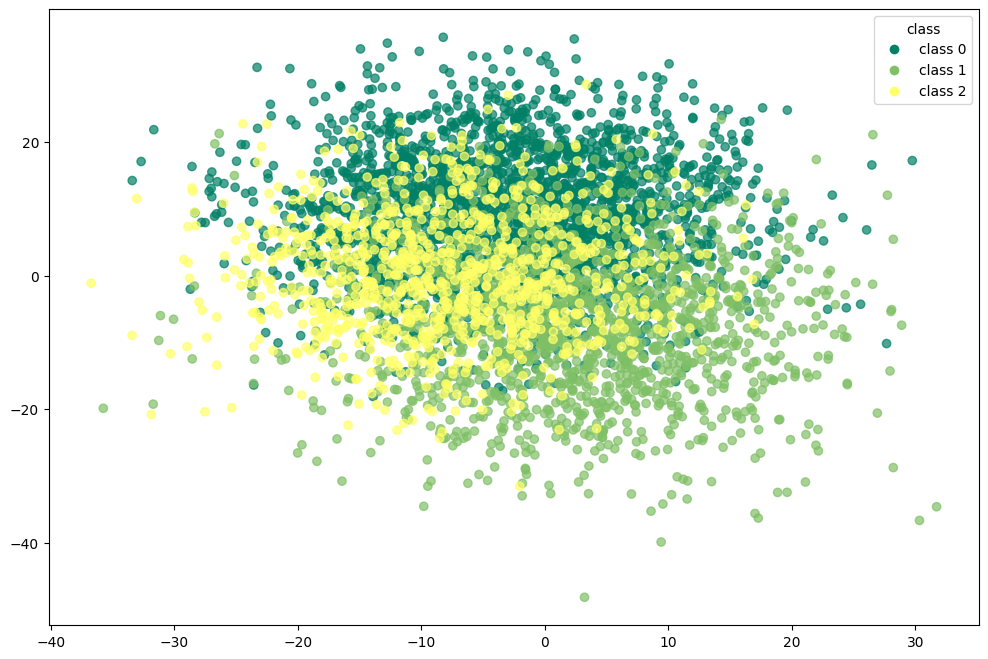

In [231]:
plt.figure(figsize=(12,8))
scatter = plt.scatter(df_gmm.iloc[:, 0], df_gmm.iloc[:, 1], 
                      c=df_gmm['target'], cmap='summer', alpha=0.7)

unique_labels = np.unique(df_gmm['target'])
legend_elements = [Line2D([0], [0], marker='o', color='w', label=f'class {label}',
                          markerfacecolor=scatter.cmap(scatter.norm(label)), markersize=8) 
                   for label in unique_labels]
plt.legend(handles=legend_elements, title="class")
plt.show()

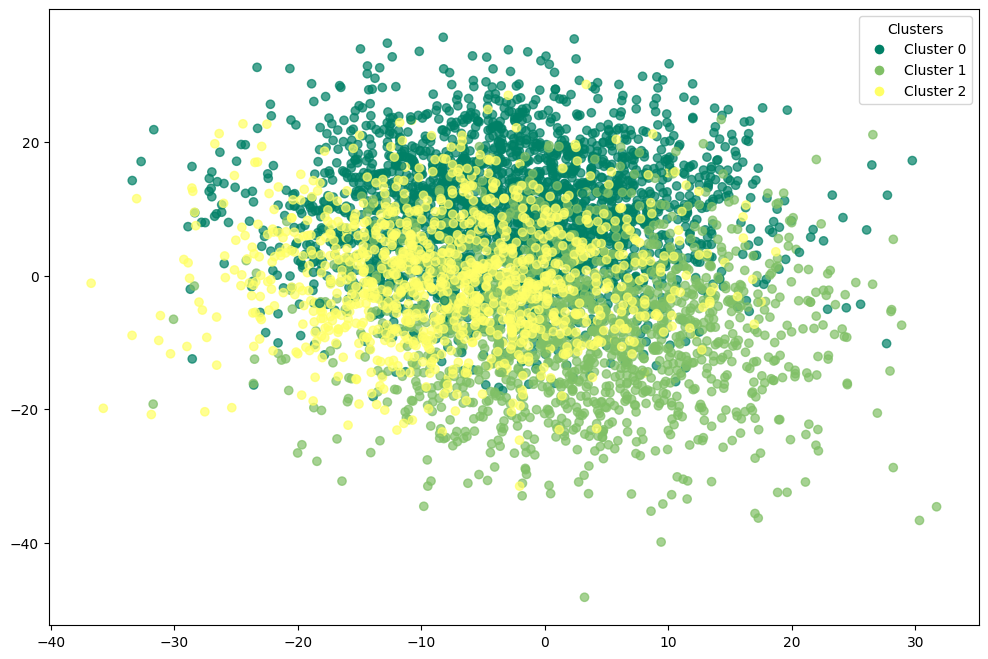

In [232]:
plt.figure(figsize=(12,8))
scatter = plt.scatter(df_gmm.iloc[:, 0], df_gmm.iloc[:, 1], 
                      c=df_gmm['gmm'], cmap='summer', alpha=0.7)
unique_clusters = np.unique(df_gmm['gmm'])
legend_elements = [Line2D([0], [0], marker='o', color='w', label=f'Cluster {cluster}',
                          markerfacecolor=scatter.cmap(scatter.norm(cluster)), markersize=8) 
                   for cluster in unique_clusters]
plt.legend(handles=legend_elements, title="Clusters")
plt.show()

In [233]:
print(confusion_matrix(df_gmm['target'],df_gmm['gmm']))

[[2472   10   18]
 [  17 1377  106]
 [  30   20  950]]


In [234]:
print(classification_report(df_gmm['target'],df_gmm['gmm']))

              precision    recall  f1-score   support

           0       0.98      0.99      0.99      2500
           1       0.98      0.92      0.95      1500
           2       0.88      0.95      0.92      1000

    accuracy                           0.96      5000
   macro avg       0.95      0.95      0.95      5000
weighted avg       0.96      0.96      0.96      5000



In [235]:
adjusted_rand_score(df_gmm['target'],df_gmm['gmm'])

0.9037326228623139

In [236]:
normalized_mutual_info_score(df_gmm['target'],df_gmm['gmm'])

0.8309450367549228

In [237]:
silhouette_score(df_gmm.drop(columns=['target','gmm']).values,df_gmm['gmm'])

0.14038213255327223

### GMM with pca

In [238]:
gmm_pca = GaussianMixture(n_components=3,init_params='k-means++',random_state=42)

In [239]:
gmm_pca.fit(X_pca)

,n_components,3
,covariance_type,'full'
,tol,0.001
,reg_covar,1e-06
,max_iter,100
,n_init,1
,init_params,'k-means++'
,weights_init,None
,means_init,None
,precisions_init,None
,random_state,42


In [240]:
df_pca_gmm = corr_dataset.copy()

In [241]:
df_pca_gmm['gmm_pca'] = gmm_pca.predict(X_pca)

In [242]:
df_pca_gmm

,vab_1,vab_2,vab_3,vab_4,vab_5,vab_6,vab_7,vab_8,vab_9,vab_10,...,vab_13,vab_14,vab_15,vab_16,vab_17,vab_18,vab_19,vab_20,target,gmm_pca
0,-3.809655,7.452653,1.621266,5.962703,-20.914807,-8.423689,-8.428553,9.096505,21.201735,2.588196,...,13.283968,2.550128,-15.015724,-3.239401,11.489176,10.971089,-8.309928,3.946436,0,0
1,1.718677,17.454119,4.097770,10.133191,4.828268,13.212596,-4.307133,9.559942,-0.863631,20.272341,...,1.397689,-12.102205,-9.325296,4.879407,-10.138815,-0.100435,0.289000,-0.733288,0,2
2,5.739965,13.635069,5.916122,2.276878,-28.387848,-15.937000,-9.527188,10.810504,2.315007,14.456410,...,8.812864,-8.108574,14.782889,-8.321536,-7.157955,6.945980,5.029422,4.222092,0,0
3,-4.238654,24.096863,-9.541265,-2.624971,-17.097469,-13.364005,0.732528,-8.317549,-6.192643,8.681732,...,16.110083,14.050932,-2.290120,-8.231265,-7.154030,-5.391910,2.873629,-1.193631,0,2
4,2.163853,19.171583,22.662716,7.527734,-5.851084,-13.330661,-4.765595,4.136365,10.117018,-6.905581,...,-4.679307,-11.528358,-11.265091,3.498680,-16.718362,-4.685691,5.584172,9.084073,0,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4995,-7.055721,-4.933603,-19.823557,16.800567,-1.211606,-3.712822,-0.637370,13.386826,8.358516,9.134989,...,25.085684,15.552802,0.702485,21.954281,-22.892991,-14.438625,-12.967728,-5.037305,2,1
4996,2.843118,-5.627838,-22.490543,14.119613,1.163222,-6.984198,-7.366098,-6.001417,-11.501928,-12.883781,...,-10.154374,-3.362936,5.876437,10.028466,-12.892411,-5.886227,-5.661087,-11.650669,2,1
4997,-10.554707,-12.143863,-14.814216,-3.226853,-1.324445,4.964251,-9.565188,19.327803,6.022009,0.986751,...,-3.791063,3.040745,2.070332,19.373326,-15.786374,-21.285011,-20.995450,0.845541,2,1
4998,-12.870637,-8.643988,-6.075779,4.484099,-21.532395,-5.134373,-0.485018,-5.882840,-5.950231,-8.705161,...,7.601373,25.977478,-6.552291,7.896572,2.455856,-3.093609,-17.791757,-15.966041,2,1


In [243]:
y_true = df_pca_gmm['target'].values  
y_kmeans = df_pca_gmm['gmm_pca'].values  

conf_matrix = confusion_matrix(y_true, y_kmeans)

row_ind, col_ind = linear_sum_assignment(-conf_matrix)  

mapping = {old: new for old, new in zip(col_ind, row_ind)}
df_pca_gmm['gmm_pca'] = np.array([mapping[label] for label in y_kmeans])

print("accuracy before:", np.mean(y_kmeans == y_true))
print("accuracy after:", np.mean(df_pca_gmm['gmm_pca'] == y_true))

accuracy before: 0.5458
accuracy after: 0.5458


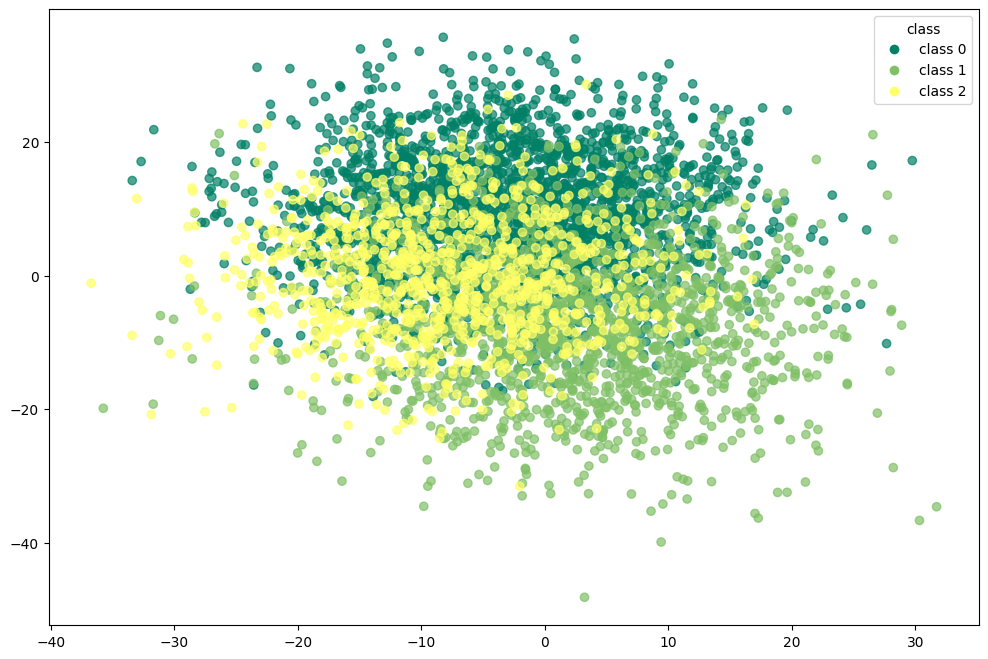

In [244]:
plt.figure(figsize=(12,8))
scatter = plt.scatter(df_pca_gmm.iloc[:, 0], df_pca_gmm.iloc[:, 1], 
                      c=df_pca_gmm['target'], cmap='summer', alpha=0.7)

unique_labels = np.unique(df_pca_gmm['target'])
legend_elements = [Line2D([0], [0], marker='o', color='w', label=f'class {label}',
                          markerfacecolor=scatter.cmap(scatter.norm(label)), markersize=8) 
                   for label in unique_labels]
plt.legend(handles=legend_elements, title="class")
plt.show()

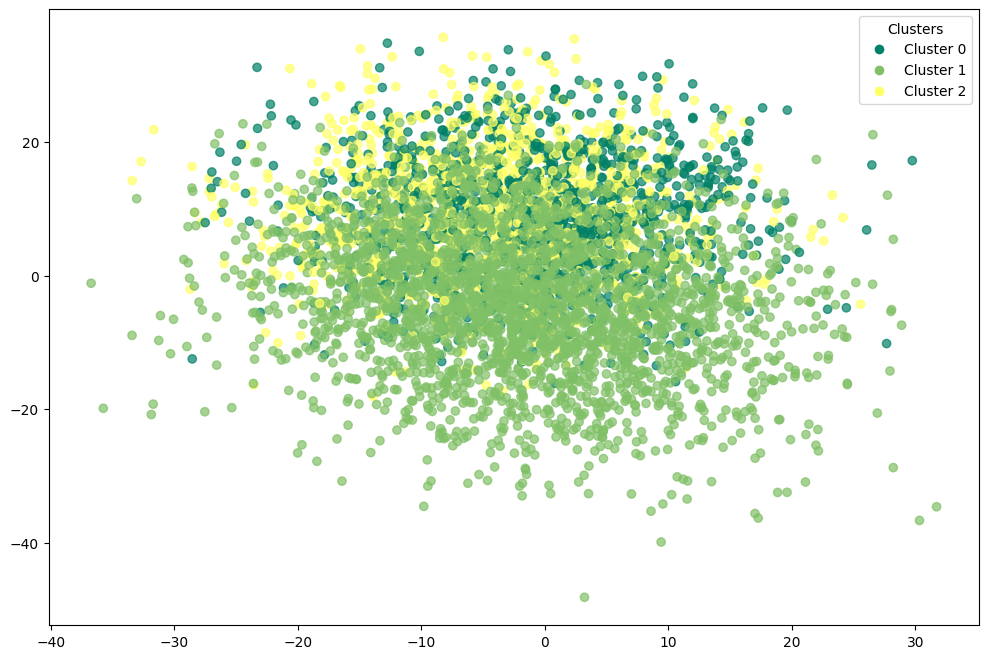

In [245]:
plt.figure(figsize=(12,8))
scatter = plt.scatter(df_pca_gmm.iloc[:, 0], df_pca_gmm.iloc[:, 1], 
                      c=df_pca_gmm['gmm_pca'], cmap='summer', alpha=0.7)
unique_clusters = np.unique(df_pca_gmm['gmm_pca'])
legend_elements = [Line2D([0], [0], marker='o', color='w', label=f'Cluster {cluster}',
                          markerfacecolor=scatter.cmap(scatter.norm(cluster)), markersize=8) 
                   for cluster in unique_clusters]
plt.legend(handles=legend_elements, title="Clusters")
plt.show()

In [246]:
print(confusion_matrix(df_pca_gmm['target'],df_pca_gmm['gmm_pca']))

[[1220   44 1236]
 [  11 1485    4]
 [   1  975   24]]


In [247]:
print(classification_report(df_pca_gmm['target'],df_pca_gmm['gmm_pca']))

              precision    recall  f1-score   support

           0       0.99      0.49      0.65      2500
           1       0.59      0.99      0.74      1500
           2       0.02      0.02      0.02      1000

    accuracy                           0.55      5000
   macro avg       0.53      0.50      0.47      5000
weighted avg       0.68      0.55      0.55      5000



In [248]:
adjusted_rand_score(df_pca_gmm['target'],df_pca_gmm['gmm_pca'])

0.44365174278238284

In [249]:
normalized_mutual_info_score(df_pca_gmm['target'],df_pca_gmm['gmm_pca'])

0.5912926838668837

In [250]:
silhouette_score(df_pca_gmm.drop(columns=['target','gmm_pca']).values,df_pca_gmm['gmm_pca'])

0.056900832578810866

### GMM with t-SNE

In [251]:
gmm_tsne = GaussianMixture(n_components=3,init_params='k-means++',random_state=42)

In [252]:
gmm_tsne.fit(X_tsne)

,n_components,3
,covariance_type,'full'
,tol,0.001
,reg_covar,1e-06
,max_iter,100
,n_init,1
,init_params,'k-means++'
,weights_init,None
,means_init,None
,precisions_init,None
,random_state,42


In [253]:
df_tsne_gmm = corr_dataset.copy()

In [254]:
df_tsne_gmm['gmm_tsne'] = gmm_tsne.predict(X_tsne)

In [255]:
df_tsne_gmm

,vab_1,vab_2,vab_3,vab_4,vab_5,vab_6,vab_7,vab_8,vab_9,vab_10,...,vab_13,vab_14,vab_15,vab_16,vab_17,vab_18,vab_19,vab_20,target,gmm_tsne
0,-3.809655,7.452653,1.621266,5.962703,-20.914807,-8.423689,-8.428553,9.096505,21.201735,2.588196,...,13.283968,2.550128,-15.015724,-3.239401,11.489176,10.971089,-8.309928,3.946436,0,2
1,1.718677,17.454119,4.097770,10.133191,4.828268,13.212596,-4.307133,9.559942,-0.863631,20.272341,...,1.397689,-12.102205,-9.325296,4.879407,-10.138815,-0.100435,0.289000,-0.733288,0,2
2,5.739965,13.635069,5.916122,2.276878,-28.387848,-15.937000,-9.527188,10.810504,2.315007,14.456410,...,8.812864,-8.108574,14.782889,-8.321536,-7.157955,6.945980,5.029422,4.222092,0,0
3,-4.238654,24.096863,-9.541265,-2.624971,-17.097469,-13.364005,0.732528,-8.317549,-6.192643,8.681732,...,16.110083,14.050932,-2.290120,-8.231265,-7.154030,-5.391910,2.873629,-1.193631,0,0
4,2.163853,19.171583,22.662716,7.527734,-5.851084,-13.330661,-4.765595,4.136365,10.117018,-6.905581,...,-4.679307,-11.528358,-11.265091,3.498680,-16.718362,-4.685691,5.584172,9.084073,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4995,-7.055721,-4.933603,-19.823557,16.800567,-1.211606,-3.712822,-0.637370,13.386826,8.358516,9.134989,...,25.085684,15.552802,0.702485,21.954281,-22.892991,-14.438625,-12.967728,-5.037305,2,1
4996,2.843118,-5.627838,-22.490543,14.119613,1.163222,-6.984198,-7.366098,-6.001417,-11.501928,-12.883781,...,-10.154374,-3.362936,5.876437,10.028466,-12.892411,-5.886227,-5.661087,-11.650669,2,1
4997,-10.554707,-12.143863,-14.814216,-3.226853,-1.324445,4.964251,-9.565188,19.327803,6.022009,0.986751,...,-3.791063,3.040745,2.070332,19.373326,-15.786374,-21.285011,-20.995450,0.845541,2,1
4998,-12.870637,-8.643988,-6.075779,4.484099,-21.532395,-5.134373,-0.485018,-5.882840,-5.950231,-8.705161,...,7.601373,25.977478,-6.552291,7.896572,2.455856,-3.093609,-17.791757,-15.966041,2,0


In [256]:
y_true = df_tsne_gmm['target'].values  
y_kmeans = df_tsne_gmm['gmm_tsne'].values  

conf_matrix = confusion_matrix(y_true, y_kmeans)

row_ind, col_ind = linear_sum_assignment(-conf_matrix)  

mapping = {old: new for old, new in zip(col_ind, row_ind)}
df_tsne_gmm['gmm_tsne'] = np.array([mapping[label] for label in y_kmeans])

print("accuracy before:", np.mean(y_kmeans == y_true))
print("accuracy after:", np.mean(df_tsne_gmm['gmm_tsne'] == y_true))

accuracy before: 0.479
accuracy after: 0.5724


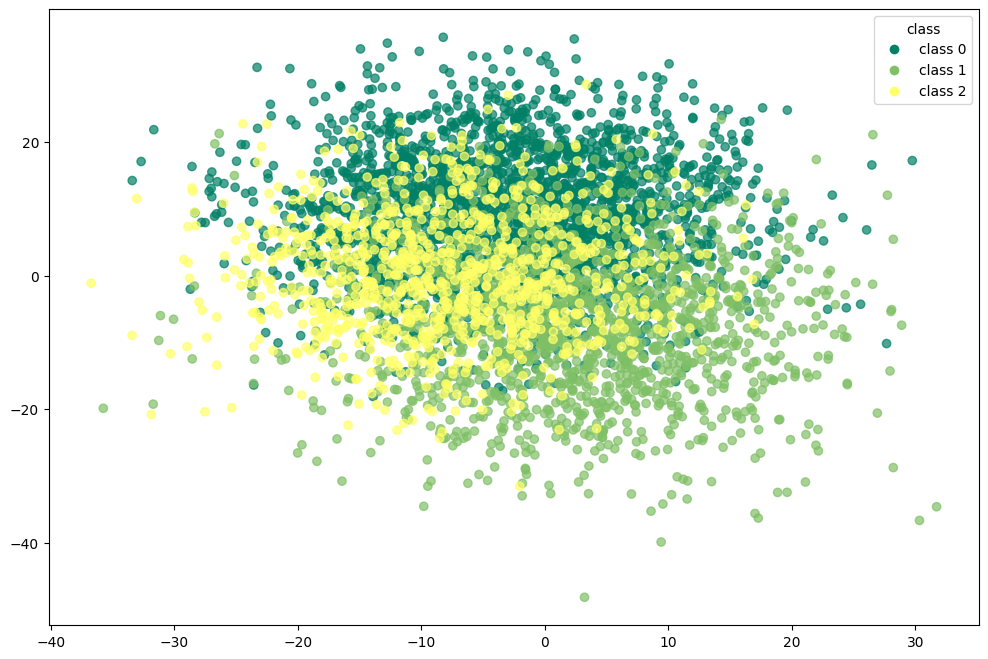

In [257]:
plt.figure(figsize=(12,8))
scatter = plt.scatter(df_tsne_gmm.iloc[:, 0], df_tsne_gmm.iloc[:, 1], 
                      c=df_tsne_gmm['target'], cmap='summer', alpha=0.7)

unique_labels = np.unique(df_tsne_gmm['target'])
legend_elements = [Line2D([0], [0], marker='o', color='w', label=f'class {label}',
                          markerfacecolor=scatter.cmap(scatter.norm(label)), markersize=8) 
                   for label in unique_labels]
plt.legend(handles=legend_elements, title="class")
plt.show()

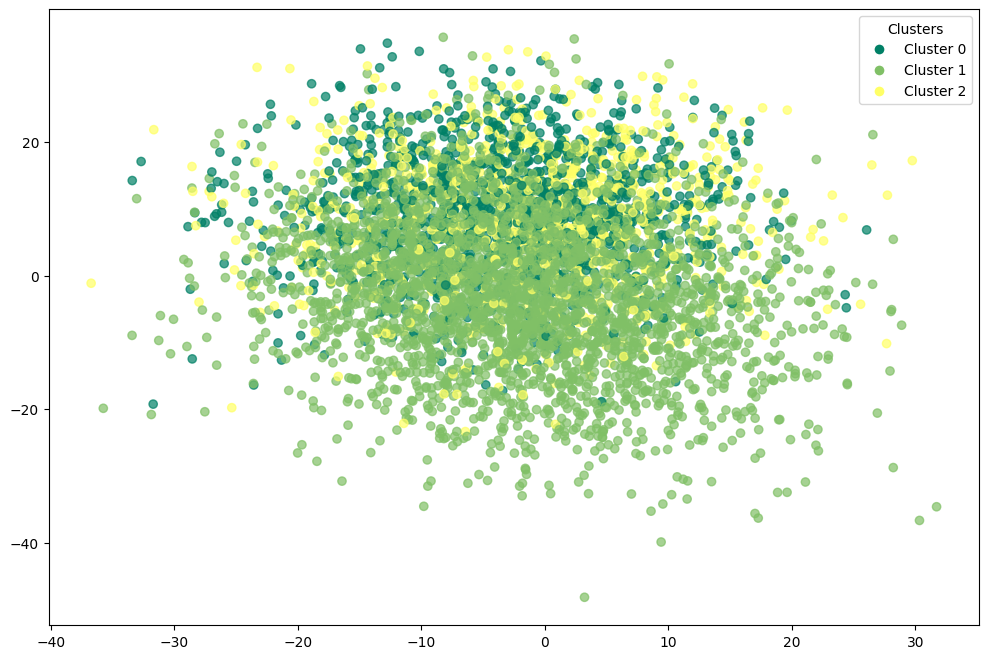

In [258]:
plt.figure(figsize=(12,8))
scatter = plt.scatter(df_tsne_gmm.iloc[:, 0], df_tsne_gmm.iloc[:, 1], 
                      c=df_tsne_gmm['gmm_tsne'], cmap='summer', alpha=0.7)
unique_clusters = np.unique(df_tsne_gmm['gmm_tsne'])
legend_elements = [Line2D([0], [0], marker='o', color='w', label=f'Cluster {cluster}',
                          markerfacecolor=scatter.cmap(scatter.norm(cluster)), markersize=8) 
                   for cluster in unique_clusters]
plt.legend(handles=legend_elements, title="Clusters")
plt.show()

In [259]:
print(confusion_matrix(df_tsne_gmm['target'],df_tsne_gmm['gmm_tsne']))

[[1345  217  938]
 [  25 1446   29]
 [  11  918   71]]


In [260]:
print(classification_report(df_tsne_gmm['target'],df_tsne_gmm['gmm_tsne']))

              precision    recall  f1-score   support

           0       0.97      0.54      0.69      2500
           1       0.56      0.96      0.71      1500
           2       0.07      0.07      0.07      1000

    accuracy                           0.57      5000
   macro avg       0.53      0.52      0.49      5000
weighted avg       0.67      0.57      0.57      5000



In [261]:
adjusted_rand_score(df_tsne_gmm['target'],df_tsne_gmm['gmm_tsne'])

0.3401460533823496

In [262]:
normalized_mutual_info_score(df_tsne_gmm['target'],df_tsne_gmm['gmm_tsne'])

0.43766240817255575

In [263]:
silhouette_score(df_tsne_gmm.drop(columns=['target','gmm_tsne']).values,df_tsne_gmm['gmm_tsne'])

0.04619980316514868

### GMM with umap

In [264]:
gmm_umap = GaussianMixture(n_components=3,init_params='k-means++',random_state=42)

In [265]:
gmm_umap.fit(X_umap)

,n_components,3
,covariance_type,'full'
,tol,0.001
,reg_covar,1e-06
,max_iter,100
,n_init,1
,init_params,'k-means++'
,weights_init,None
,means_init,None
,precisions_init,None
,random_state,42


In [266]:
df_umap_gmm = corr_dataset.copy()

In [267]:
df_umap_gmm['gmm_umap'] = gmm_umap.predict(X_umap)

In [268]:
df_umap_gmm

,vab_1,vab_2,vab_3,vab_4,vab_5,vab_6,vab_7,vab_8,vab_9,vab_10,...,vab_13,vab_14,vab_15,vab_16,vab_17,vab_18,vab_19,vab_20,target,gmm_umap
0,-3.809655,7.452653,1.621266,5.962703,-20.914807,-8.423689,-8.428553,9.096505,21.201735,2.588196,...,13.283968,2.550128,-15.015724,-3.239401,11.489176,10.971089,-8.309928,3.946436,0,2
1,1.718677,17.454119,4.097770,10.133191,4.828268,13.212596,-4.307133,9.559942,-0.863631,20.272341,...,1.397689,-12.102205,-9.325296,4.879407,-10.138815,-0.100435,0.289000,-0.733288,0,0
2,5.739965,13.635069,5.916122,2.276878,-28.387848,-15.937000,-9.527188,10.810504,2.315007,14.456410,...,8.812864,-8.108574,14.782889,-8.321536,-7.157955,6.945980,5.029422,4.222092,0,0
3,-4.238654,24.096863,-9.541265,-2.624971,-17.097469,-13.364005,0.732528,-8.317549,-6.192643,8.681732,...,16.110083,14.050932,-2.290120,-8.231265,-7.154030,-5.391910,2.873629,-1.193631,0,0
4,2.163853,19.171583,22.662716,7.527734,-5.851084,-13.330661,-4.765595,4.136365,10.117018,-6.905581,...,-4.679307,-11.528358,-11.265091,3.498680,-16.718362,-4.685691,5.584172,9.084073,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4995,-7.055721,-4.933603,-19.823557,16.800567,-1.211606,-3.712822,-0.637370,13.386826,8.358516,9.134989,...,25.085684,15.552802,0.702485,21.954281,-22.892991,-14.438625,-12.967728,-5.037305,2,1
4996,2.843118,-5.627838,-22.490543,14.119613,1.163222,-6.984198,-7.366098,-6.001417,-11.501928,-12.883781,...,-10.154374,-3.362936,5.876437,10.028466,-12.892411,-5.886227,-5.661087,-11.650669,2,1
4997,-10.554707,-12.143863,-14.814216,-3.226853,-1.324445,4.964251,-9.565188,19.327803,6.022009,0.986751,...,-3.791063,3.040745,2.070332,19.373326,-15.786374,-21.285011,-20.995450,0.845541,2,1
4998,-12.870637,-8.643988,-6.075779,4.484099,-21.532395,-5.134373,-0.485018,-5.882840,-5.950231,-8.705161,...,7.601373,25.977478,-6.552291,7.896572,2.455856,-3.093609,-17.791757,-15.966041,2,1


In [269]:
y_true = df_umap_gmm['target'].values  
y_kmeans = df_umap_gmm['gmm_umap'].values  

conf_matrix = confusion_matrix(y_true, y_kmeans)

row_ind, col_ind = linear_sum_assignment(-conf_matrix)  

mapping = {old: new for old, new in zip(col_ind, row_ind)}
df_umap_gmm['gmm_umap'] = np.array([mapping[label] for label in y_kmeans])

print("accuracy before:", np.mean(y_kmeans == y_true))
print("accuracy after:", np.mean(df_umap_gmm['gmm_umap'] == y_true))

accuracy before: 0.5782
accuracy after: 0.5782


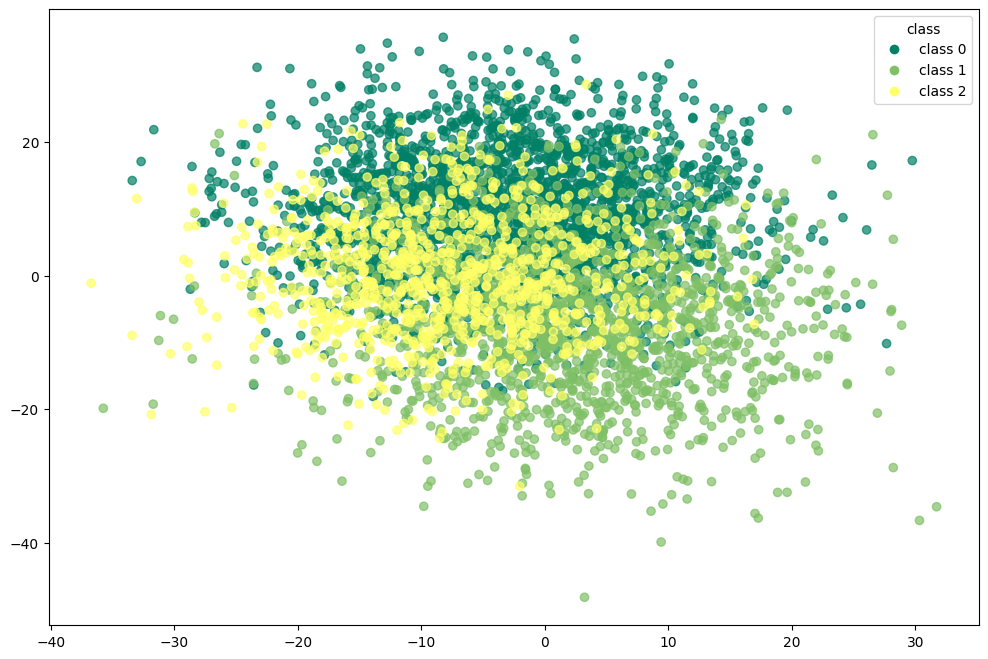

In [270]:
plt.figure(figsize=(12,8))
scatter = plt.scatter(df_umap_gmm.iloc[:, 0], df_umap_gmm.iloc[:, 1], 
                      c=df_umap_gmm['target'], cmap='summer', alpha=0.7)

unique_labels = np.unique(df_umap_gmm['target'])
legend_elements = [Line2D([0], [0], marker='o', color='w', label=f'class {label}',
                          markerfacecolor=scatter.cmap(scatter.norm(label)), markersize=8) 
                   for label in unique_labels]
plt.legend(handles=legend_elements, title="class")
plt.show()

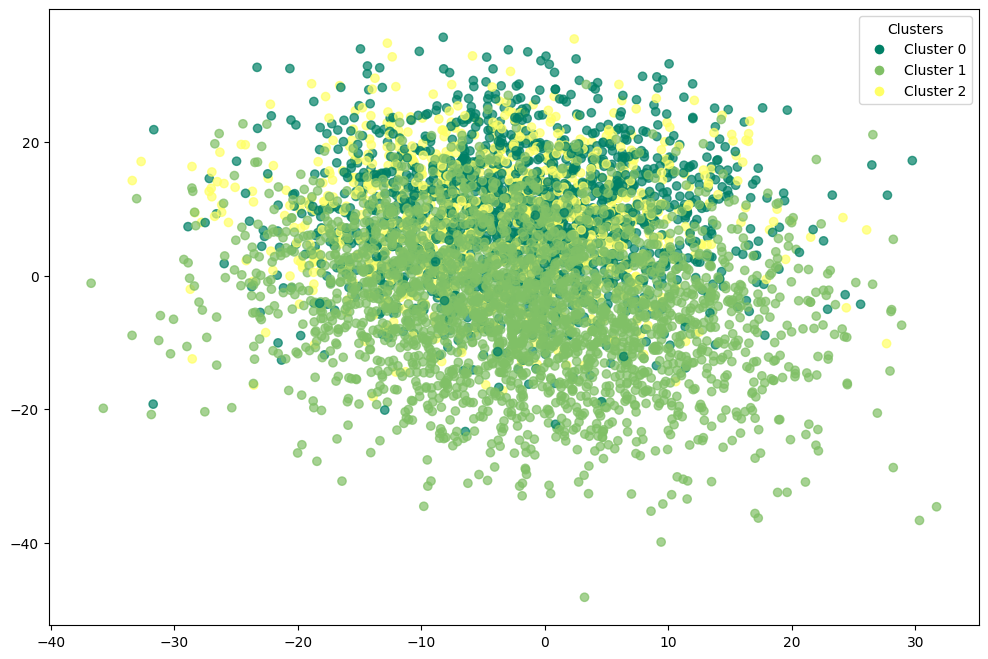

In [271]:
plt.figure(figsize=(12,8))
scatter = plt.scatter(df_umap_gmm.iloc[:, 0], df_umap_gmm.iloc[:, 1], 
                      c=df_umap_gmm['gmm_umap'], cmap='summer', alpha=0.7)
unique_clusters = np.unique(df_umap_gmm['gmm_umap'])
legend_elements = [Line2D([0], [0], marker='o', color='w', label=f'Cluster {cluster}',
                          markerfacecolor=scatter.cmap(scatter.norm(cluster)), markersize=8) 
                   for cluster in unique_clusters]
plt.legend(handles=legend_elements, title="Clusters")
plt.show()

In [272]:
print(confusion_matrix(df_umap_gmm['target'],df_umap_gmm['gmm_umap']))

[[1428   31 1041]
 [  38 1457    5]
 [  23  971    6]]


In [273]:
print(classification_report(df_umap_gmm['target'],df_umap_gmm['gmm_umap']))

              precision    recall  f1-score   support

           0       0.96      0.57      0.72      2500
           1       0.59      0.97      0.74      1500
           2       0.01      0.01      0.01      1000

    accuracy                           0.58      5000
   macro avg       0.52      0.52      0.49      5000
weighted avg       0.66      0.58      0.58      5000



In [274]:
adjusted_rand_score(df_umap_gmm['target'],df_umap_gmm['gmm_umap'])

0.44764739100634326

In [275]:
normalized_mutual_info_score(df_umap_gmm['target'],df_umap_gmm['gmm_umap'])

0.577382347654224

In [276]:
silhouette_score(df_umap_gmm.drop(columns=['target','gmm_umap']).values,df_umap_gmm['gmm_umap'])

0.05643220912222529

## pam

In [277]:
initial_medoids = np.random.choice(len(X_values),3,replace=False)

In [278]:
metric = distance_metric(type_metric.EUCLIDEAN)

In [279]:
pam = kmedoids(X_values,initial_medoids,metric=metric)

In [280]:
pam.process()

In [281]:
clusters = pam.get_clusters()

In [282]:
medoids = pam.get_medoids()

In [283]:
labels = np.zeros(len(X_values))
for cluster_idx, cluster in enumerate(clusters):
    for data_idx in cluster:
        labels[data_idx] = cluster_idx

In [284]:
df_pam = corr_dataset.copy()

In [285]:
df_pam['pam'] = labels

In [286]:
df_pam

,vab_1,vab_2,vab_3,vab_4,vab_5,vab_6,vab_7,vab_8,vab_9,vab_10,...,vab_13,vab_14,vab_15,vab_16,vab_17,vab_18,vab_19,vab_20,target,pam
0,-3.809655,7.452653,1.621266,5.962703,-20.914807,-8.423689,-8.428553,9.096505,21.201735,2.588196,...,13.283968,2.550128,-15.015724,-3.239401,11.489176,10.971089,-8.309928,3.946436,0,0.0
1,1.718677,17.454119,4.097770,10.133191,4.828268,13.212596,-4.307133,9.559942,-0.863631,20.272341,...,1.397689,-12.102205,-9.325296,4.879407,-10.138815,-0.100435,0.289000,-0.733288,0,0.0
2,5.739965,13.635069,5.916122,2.276878,-28.387848,-15.937000,-9.527188,10.810504,2.315007,14.456410,...,8.812864,-8.108574,14.782889,-8.321536,-7.157955,6.945980,5.029422,4.222092,0,0.0
3,-4.238654,24.096863,-9.541265,-2.624971,-17.097469,-13.364005,0.732528,-8.317549,-6.192643,8.681732,...,16.110083,14.050932,-2.290120,-8.231265,-7.154030,-5.391910,2.873629,-1.193631,0,1.0
4,2.163853,19.171583,22.662716,7.527734,-5.851084,-13.330661,-4.765595,4.136365,10.117018,-6.905581,...,-4.679307,-11.528358,-11.265091,3.498680,-16.718362,-4.685691,5.584172,9.084073,0,1.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4995,-7.055721,-4.933603,-19.823557,16.800567,-1.211606,-3.712822,-0.637370,13.386826,8.358516,9.134989,...,25.085684,15.552802,0.702485,21.954281,-22.892991,-14.438625,-12.967728,-5.037305,2,2.0
4996,2.843118,-5.627838,-22.490543,14.119613,1.163222,-6.984198,-7.366098,-6.001417,-11.501928,-12.883781,...,-10.154374,-3.362936,5.876437,10.028466,-12.892411,-5.886227,-5.661087,-11.650669,2,2.0
4997,-10.554707,-12.143863,-14.814216,-3.226853,-1.324445,4.964251,-9.565188,19.327803,6.022009,0.986751,...,-3.791063,3.040745,2.070332,19.373326,-15.786374,-21.285011,-20.995450,0.845541,2,2.0
4998,-12.870637,-8.643988,-6.075779,4.484099,-21.532395,-5.134373,-0.485018,-5.882840,-5.950231,-8.705161,...,7.601373,25.977478,-6.552291,7.896572,2.455856,-3.093609,-17.791757,-15.966041,2,2.0


In [287]:
y_true = df_pam['target'].values  
y_kmeans = df_pam['pam'].values  

conf_matrix = confusion_matrix(y_true, y_kmeans)

row_ind, col_ind = linear_sum_assignment(-conf_matrix)  

mapping = {old: new for old, new in zip(col_ind, row_ind)}
df_pam['pam'] = np.array([mapping[label] for label in y_kmeans])

print("accuracy before:", np.mean(y_kmeans == y_true))
print("accuracy after:", np.mean(df_pam['pam'] == y_true))

accuracy before: 0.448
accuracy after: 0.5504


In [288]:
df_pam

,vab_1,vab_2,vab_3,vab_4,vab_5,vab_6,vab_7,vab_8,vab_9,vab_10,...,vab_13,vab_14,vab_15,vab_16,vab_17,vab_18,vab_19,vab_20,target,pam
0,-3.809655,7.452653,1.621266,5.962703,-20.914807,-8.423689,-8.428553,9.096505,21.201735,2.588196,...,13.283968,2.550128,-15.015724,-3.239401,11.489176,10.971089,-8.309928,3.946436,0,0
1,1.718677,17.454119,4.097770,10.133191,4.828268,13.212596,-4.307133,9.559942,-0.863631,20.272341,...,1.397689,-12.102205,-9.325296,4.879407,-10.138815,-0.100435,0.289000,-0.733288,0,0
2,5.739965,13.635069,5.916122,2.276878,-28.387848,-15.937000,-9.527188,10.810504,2.315007,14.456410,...,8.812864,-8.108574,14.782889,-8.321536,-7.157955,6.945980,5.029422,4.222092,0,0
3,-4.238654,24.096863,-9.541265,-2.624971,-17.097469,-13.364005,0.732528,-8.317549,-6.192643,8.681732,...,16.110083,14.050932,-2.290120,-8.231265,-7.154030,-5.391910,2.873629,-1.193631,0,2
4,2.163853,19.171583,22.662716,7.527734,-5.851084,-13.330661,-4.765595,4.136365,10.117018,-6.905581,...,-4.679307,-11.528358,-11.265091,3.498680,-16.718362,-4.685691,5.584172,9.084073,0,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4995,-7.055721,-4.933603,-19.823557,16.800567,-1.211606,-3.712822,-0.637370,13.386826,8.358516,9.134989,...,25.085684,15.552802,0.702485,21.954281,-22.892991,-14.438625,-12.967728,-5.037305,2,1
4996,2.843118,-5.627838,-22.490543,14.119613,1.163222,-6.984198,-7.366098,-6.001417,-11.501928,-12.883781,...,-10.154374,-3.362936,5.876437,10.028466,-12.892411,-5.886227,-5.661087,-11.650669,2,1
4997,-10.554707,-12.143863,-14.814216,-3.226853,-1.324445,4.964251,-9.565188,19.327803,6.022009,0.986751,...,-3.791063,3.040745,2.070332,19.373326,-15.786374,-21.285011,-20.995450,0.845541,2,1
4998,-12.870637,-8.643988,-6.075779,4.484099,-21.532395,-5.134373,-0.485018,-5.882840,-5.950231,-8.705161,...,7.601373,25.977478,-6.552291,7.896572,2.455856,-3.093609,-17.791757,-15.966041,2,1


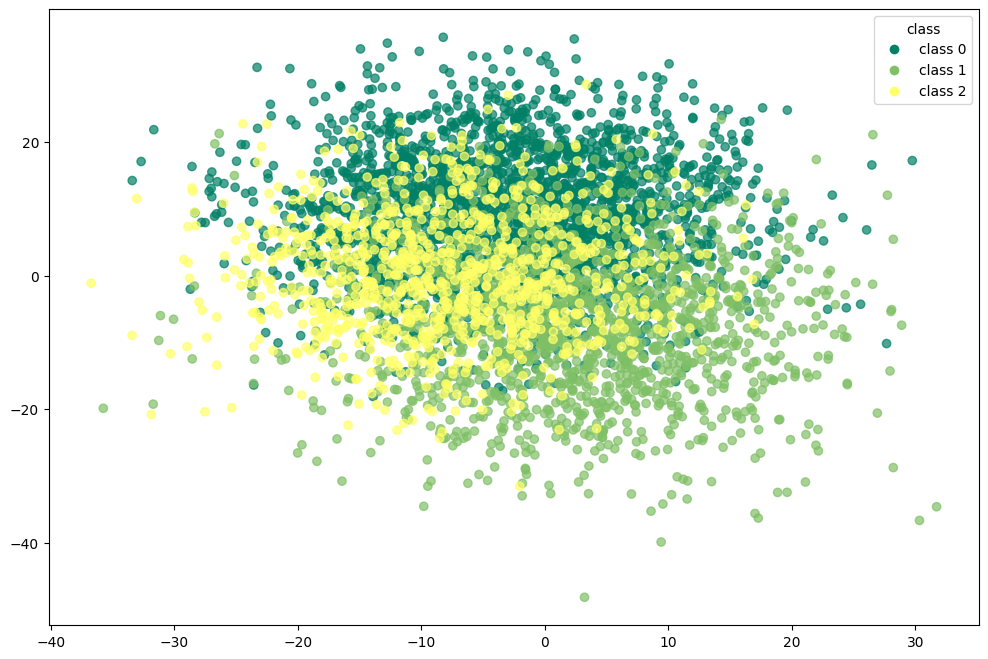

In [289]:
plt.figure(figsize=(12,8))
scatter = plt.scatter(df_pam.iloc[:, 0],df_pam.iloc[:, 1], 
                      c=df_pam['target'],cmap='summer',alpha=0.7)

unique_labels = np.unique(df_pam['target'])
legend_elements = [Line2D([0], [0],marker='o',color='w',label=f'class {label}',
                          markerfacecolor=scatter.cmap(scatter.norm(label)), markersize=8) 
                   for label in unique_labels]
plt.legend(handles=legend_elements,title="class")
plt.show()

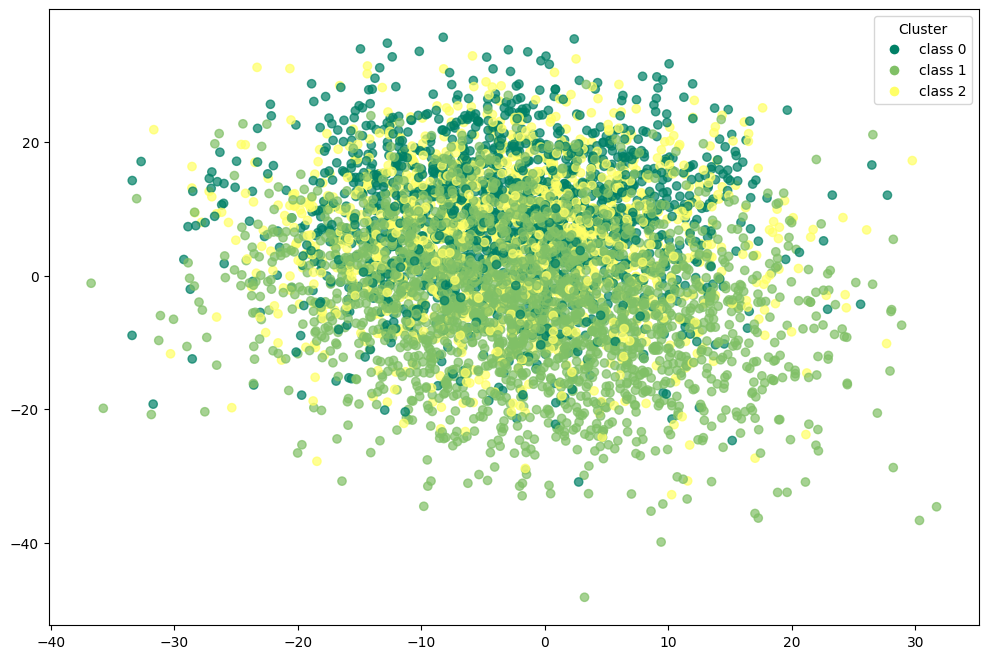

In [290]:
plt.figure(figsize=(12,8))
scatter = plt.scatter(df_pam.iloc[:, 0],df_pam.iloc[:, 1], 
                      c=df_pam['pam'],cmap='summer',alpha=0.7)

unique_labels = np.unique(df_pam['pam'])
legend_elements = [Line2D([0], [0],marker='o',color='w',label=f'class {label}',
                          markerfacecolor=scatter.cmap(scatter.norm(label)), markersize=8) 
                   for label in unique_labels]
plt.legend(handles=legend_elements,title="Cluster")
plt.show()

In [291]:
print(confusion_matrix(df_pam['target'],df_pam['pam']))

[[1353   21 1126]
 [ 107 1265  128]
 [ 107  759  134]]


In [292]:
print(classification_report(df_pam['target'],df_pam['pam']))

              precision    recall  f1-score   support

           0       0.86      0.54      0.67      2500
           1       0.62      0.84      0.71      1500
           2       0.10      0.13      0.11      1000

    accuracy                           0.55      5000
   macro avg       0.53      0.51      0.50      5000
weighted avg       0.64      0.55      0.57      5000



In [293]:
adjusted_rand_score(df_pam['target'],df_pam['pam'])

0.35945565196998636

In [294]:
normalized_mutual_info_score(df_pam['target'],df_pam['pam'])

0.39064218518528904

In [295]:
silhouette_score(df_pam.drop(columns=['target','pam']).values,df_pam['pam'])

0.0560814236538272

### pam with pca

In [296]:
initial_medoids = np.random.choice(len(X_pca),3,replace=False)

In [297]:
metric = distance_metric(type_metric.EUCLIDEAN)

In [298]:
pam_pca = kmedoids(X_pca,initial_medoids,metric=metric)

In [299]:
pam_pca.process()

In [300]:
clusters = pam_pca.get_clusters()

In [301]:
medoids = pam_pca.get_medoids()

In [302]:
labels = np.zeros(len(X_pca))
for cluster_idx, cluster in enumerate(clusters):
    for data_idx in cluster:
        labels[data_idx] = cluster_idx

In [303]:
df_pam_pca = corr_dataset.copy()

In [304]:
df_pam_pca['pam_pca'] = labels

In [305]:
df_pam_pca

,vab_1,vab_2,vab_3,vab_4,vab_5,vab_6,vab_7,vab_8,vab_9,vab_10,...,vab_13,vab_14,vab_15,vab_16,vab_17,vab_18,vab_19,vab_20,target,pam_pca
0,-3.809655,7.452653,1.621266,5.962703,-20.914807,-8.423689,-8.428553,9.096505,21.201735,2.588196,...,13.283968,2.550128,-15.015724,-3.239401,11.489176,10.971089,-8.309928,3.946436,0,1.0
1,1.718677,17.454119,4.097770,10.133191,4.828268,13.212596,-4.307133,9.559942,-0.863631,20.272341,...,1.397689,-12.102205,-9.325296,4.879407,-10.138815,-0.100435,0.289000,-0.733288,0,1.0
2,5.739965,13.635069,5.916122,2.276878,-28.387848,-15.937000,-9.527188,10.810504,2.315007,14.456410,...,8.812864,-8.108574,14.782889,-8.321536,-7.157955,6.945980,5.029422,4.222092,0,1.0
3,-4.238654,24.096863,-9.541265,-2.624971,-17.097469,-13.364005,0.732528,-8.317549,-6.192643,8.681732,...,16.110083,14.050932,-2.290120,-8.231265,-7.154030,-5.391910,2.873629,-1.193631,0,1.0
4,2.163853,19.171583,22.662716,7.527734,-5.851084,-13.330661,-4.765595,4.136365,10.117018,-6.905581,...,-4.679307,-11.528358,-11.265091,3.498680,-16.718362,-4.685691,5.584172,9.084073,0,1.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4995,-7.055721,-4.933603,-19.823557,16.800567,-1.211606,-3.712822,-0.637370,13.386826,8.358516,9.134989,...,25.085684,15.552802,0.702485,21.954281,-22.892991,-14.438625,-12.967728,-5.037305,2,2.0
4996,2.843118,-5.627838,-22.490543,14.119613,1.163222,-6.984198,-7.366098,-6.001417,-11.501928,-12.883781,...,-10.154374,-3.362936,5.876437,10.028466,-12.892411,-5.886227,-5.661087,-11.650669,2,2.0
4997,-10.554707,-12.143863,-14.814216,-3.226853,-1.324445,4.964251,-9.565188,19.327803,6.022009,0.986751,...,-3.791063,3.040745,2.070332,19.373326,-15.786374,-21.285011,-20.995450,0.845541,2,2.0
4998,-12.870637,-8.643988,-6.075779,4.484099,-21.532395,-5.134373,-0.485018,-5.882840,-5.950231,-8.705161,...,7.601373,25.977478,-6.552291,7.896572,2.455856,-3.093609,-17.791757,-15.966041,2,2.0


In [306]:
y_true = df_pam_pca['target'].values  
y_kmeans = df_pam_pca['pam_pca'].values  

conf_matrix = confusion_matrix(y_true, y_kmeans)

row_ind, col_ind = linear_sum_assignment(-conf_matrix)  

mapping = {old: new for old, new in zip(col_ind, row_ind)}
df_pam_pca['pam_pca'] = np.array([mapping[label] for label in y_kmeans])

print("accuracy before:", np.mean(y_kmeans == y_true))
print("accuracy after:", np.mean(df_pam_pca['pam_pca'] == y_true))

accuracy before: 0.1978
accuracy after: 0.96


In [307]:
df_pam_pca

,vab_1,vab_2,vab_3,vab_4,vab_5,vab_6,vab_7,vab_8,vab_9,vab_10,...,vab_13,vab_14,vab_15,vab_16,vab_17,vab_18,vab_19,vab_20,target,pam_pca
0,-3.809655,7.452653,1.621266,5.962703,-20.914807,-8.423689,-8.428553,9.096505,21.201735,2.588196,...,13.283968,2.550128,-15.015724,-3.239401,11.489176,10.971089,-8.309928,3.946436,0,0
1,1.718677,17.454119,4.097770,10.133191,4.828268,13.212596,-4.307133,9.559942,-0.863631,20.272341,...,1.397689,-12.102205,-9.325296,4.879407,-10.138815,-0.100435,0.289000,-0.733288,0,0
2,5.739965,13.635069,5.916122,2.276878,-28.387848,-15.937000,-9.527188,10.810504,2.315007,14.456410,...,8.812864,-8.108574,14.782889,-8.321536,-7.157955,6.945980,5.029422,4.222092,0,0
3,-4.238654,24.096863,-9.541265,-2.624971,-17.097469,-13.364005,0.732528,-8.317549,-6.192643,8.681732,...,16.110083,14.050932,-2.290120,-8.231265,-7.154030,-5.391910,2.873629,-1.193631,0,0
4,2.163853,19.171583,22.662716,7.527734,-5.851084,-13.330661,-4.765595,4.136365,10.117018,-6.905581,...,-4.679307,-11.528358,-11.265091,3.498680,-16.718362,-4.685691,5.584172,9.084073,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4995,-7.055721,-4.933603,-19.823557,16.800567,-1.211606,-3.712822,-0.637370,13.386826,8.358516,9.134989,...,25.085684,15.552802,0.702485,21.954281,-22.892991,-14.438625,-12.967728,-5.037305,2,2
4996,2.843118,-5.627838,-22.490543,14.119613,1.163222,-6.984198,-7.366098,-6.001417,-11.501928,-12.883781,...,-10.154374,-3.362936,5.876437,10.028466,-12.892411,-5.886227,-5.661087,-11.650669,2,2
4997,-10.554707,-12.143863,-14.814216,-3.226853,-1.324445,4.964251,-9.565188,19.327803,6.022009,0.986751,...,-3.791063,3.040745,2.070332,19.373326,-15.786374,-21.285011,-20.995450,0.845541,2,2
4998,-12.870637,-8.643988,-6.075779,4.484099,-21.532395,-5.134373,-0.485018,-5.882840,-5.950231,-8.705161,...,7.601373,25.977478,-6.552291,7.896572,2.455856,-3.093609,-17.791757,-15.966041,2,2


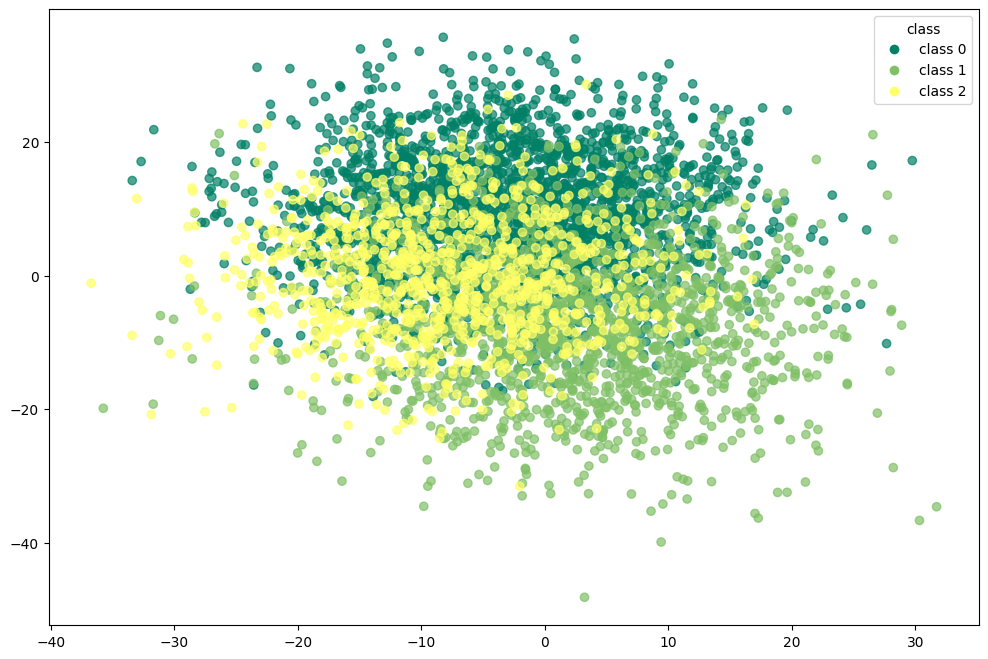

In [308]:
plt.figure(figsize=(12,8))
scatter = plt.scatter(df_pam_pca.iloc[:, 0],df_pam_pca.iloc[:, 1], 
                      c=df_pam_pca['target'],cmap='summer',alpha=0.7)

unique_labels = np.unique(df_pam_pca['target'])
legend_elements = [Line2D([0], [0],marker='o',color='w',label=f'class {label}',
                          markerfacecolor=scatter.cmap(scatter.norm(label)), markersize=8) 
                   for label in unique_labels]
plt.legend(handles=legend_elements,title="class")
plt.show()

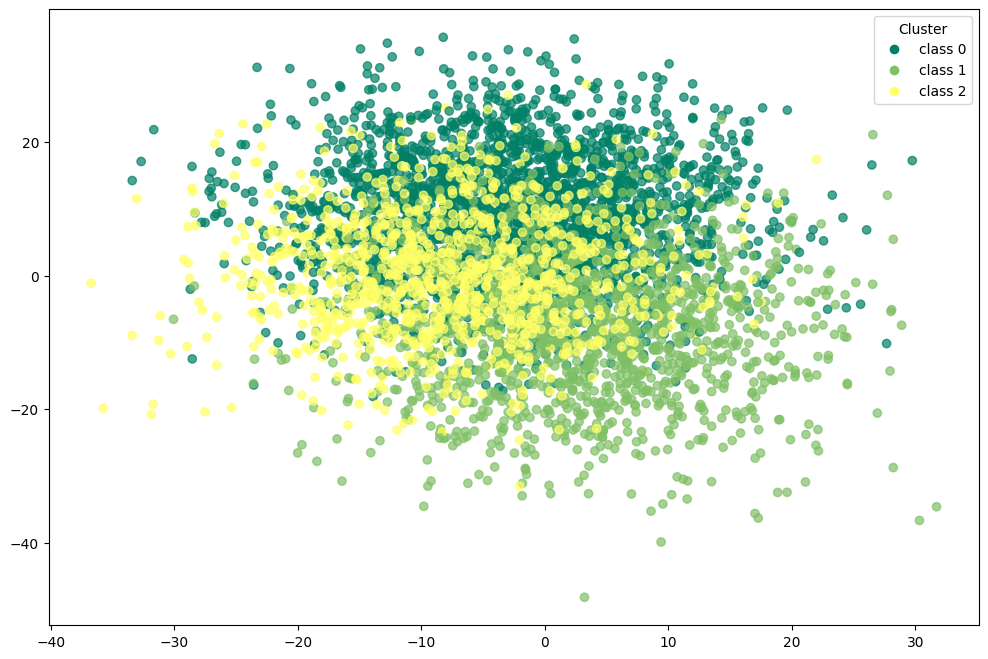

In [309]:
plt.figure(figsize=(12,8))
scatter = plt.scatter(df_pam_pca.iloc[:, 0],df_pam_pca.iloc[:, 1], 
                      c=df_pam_pca['pam_pca'],cmap='summer',alpha=0.7)

unique_labels = np.unique(df_pam_pca['pam_pca'])
legend_elements = [Line2D([0], [0],marker='o',color='w',label=f'class {label}',
                          markerfacecolor=scatter.cmap(scatter.norm(label)), markersize=8) 
                   for label in unique_labels]
plt.legend(handles=legend_elements,title="Cluster")
plt.show()

In [310]:
print(confusion_matrix(df_pam_pca['target'],df_pam_pca['pam_pca']))

[[2462    9   29]
 [  18 1376  106]
 [  10   28  962]]


In [311]:
print(classification_report(df_pam_pca['target'],df_pam_pca['pam_pca']))

              precision    recall  f1-score   support

           0       0.99      0.98      0.99      2500
           1       0.97      0.92      0.94      1500
           2       0.88      0.96      0.92      1000

    accuracy                           0.96      5000
   macro avg       0.95      0.95      0.95      5000
weighted avg       0.96      0.96      0.96      5000



In [312]:
adjusted_rand_score(df_pam_pca['target'],df_pam_pca['pam_pca'])

0.905309404745035

In [313]:
normalized_mutual_info_score(df_pam_pca['target'],df_pam_pca['pam_pca'])

0.8332454927012313

In [314]:
silhouette_score(df_pam_pca.drop(columns=['target','pam_pca']).values,df_pam_pca['pam_pca'])

0.14010514183626338

### pam with t-SNE

In [315]:
initial_medoids = np.random.choice(len(X_tsne),3,replace=False)

In [316]:
metric = distance_metric(type_metric.EUCLIDEAN)

In [317]:
pam_tsne = kmedoids(X_tsne,initial_medoids,metric=metric)

In [318]:
pam_tsne.process()

In [319]:
clusters = pam_tsne.get_clusters()

In [320]:
medoids = pam_tsne.get_medoids()

In [321]:
labels = np.zeros(len(X_tsne))
for cluster_idx, cluster in enumerate(clusters):
    for data_idx in cluster:
        labels[data_idx] = cluster_idx

In [322]:
df_pam_tsne = corr_dataset.copy()

In [323]:
df_pam_tsne['pam_tsne'] = labels

In [324]:
df_pam_tsne

,vab_1,vab_2,vab_3,vab_4,vab_5,vab_6,vab_7,vab_8,vab_9,vab_10,...,vab_13,vab_14,vab_15,vab_16,vab_17,vab_18,vab_19,vab_20,target,pam_tsne
0,-3.809655,7.452653,1.621266,5.962703,-20.914807,-8.423689,-8.428553,9.096505,21.201735,2.588196,...,13.283968,2.550128,-15.015724,-3.239401,11.489176,10.971089,-8.309928,3.946436,0,2.0
1,1.718677,17.454119,4.097770,10.133191,4.828268,13.212596,-4.307133,9.559942,-0.863631,20.272341,...,1.397689,-12.102205,-9.325296,4.879407,-10.138815,-0.100435,0.289000,-0.733288,0,0.0
2,5.739965,13.635069,5.916122,2.276878,-28.387848,-15.937000,-9.527188,10.810504,2.315007,14.456410,...,8.812864,-8.108574,14.782889,-8.321536,-7.157955,6.945980,5.029422,4.222092,0,0.0
3,-4.238654,24.096863,-9.541265,-2.624971,-17.097469,-13.364005,0.732528,-8.317549,-6.192643,8.681732,...,16.110083,14.050932,-2.290120,-8.231265,-7.154030,-5.391910,2.873629,-1.193631,0,0.0
4,2.163853,19.171583,22.662716,7.527734,-5.851084,-13.330661,-4.765595,4.136365,10.117018,-6.905581,...,-4.679307,-11.528358,-11.265091,3.498680,-16.718362,-4.685691,5.584172,9.084073,0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4995,-7.055721,-4.933603,-19.823557,16.800567,-1.211606,-3.712822,-0.637370,13.386826,8.358516,9.134989,...,25.085684,15.552802,0.702485,21.954281,-22.892991,-14.438625,-12.967728,-5.037305,2,2.0
4996,2.843118,-5.627838,-22.490543,14.119613,1.163222,-6.984198,-7.366098,-6.001417,-11.501928,-12.883781,...,-10.154374,-3.362936,5.876437,10.028466,-12.892411,-5.886227,-5.661087,-11.650669,2,1.0
4997,-10.554707,-12.143863,-14.814216,-3.226853,-1.324445,4.964251,-9.565188,19.327803,6.022009,0.986751,...,-3.791063,3.040745,2.070332,19.373326,-15.786374,-21.285011,-20.995450,0.845541,2,1.0
4998,-12.870637,-8.643988,-6.075779,4.484099,-21.532395,-5.134373,-0.485018,-5.882840,-5.950231,-8.705161,...,7.601373,25.977478,-6.552291,7.896572,2.455856,-3.093609,-17.791757,-15.966041,2,1.0


In [325]:
y_true = df_pam_tsne['target'].values  
y_kmeans = df_pam_tsne['pam_tsne'].values  

conf_matrix = confusion_matrix(y_true, y_kmeans)

row_ind, col_ind = linear_sum_assignment(-conf_matrix)  

mapping = {old: new for old, new in zip(col_ind, row_ind)}
df_pam_tsne['pam_tsne'] = np.array([mapping[label] for label in y_kmeans])

print("accuracy before:", np.mean(y_kmeans == y_true))
print("accuracy after:", np.mean(df_pam_tsne['pam_tsne'] == y_true))

accuracy before: 0.5928
accuracy after: 0.5928


In [326]:
df_pam_tsne

,vab_1,vab_2,vab_3,vab_4,vab_5,vab_6,vab_7,vab_8,vab_9,vab_10,...,vab_13,vab_14,vab_15,vab_16,vab_17,vab_18,vab_19,vab_20,target,pam_tsne
0,-3.809655,7.452653,1.621266,5.962703,-20.914807,-8.423689,-8.428553,9.096505,21.201735,2.588196,...,13.283968,2.550128,-15.015724,-3.239401,11.489176,10.971089,-8.309928,3.946436,0,2
1,1.718677,17.454119,4.097770,10.133191,4.828268,13.212596,-4.307133,9.559942,-0.863631,20.272341,...,1.397689,-12.102205,-9.325296,4.879407,-10.138815,-0.100435,0.289000,-0.733288,0,0
2,5.739965,13.635069,5.916122,2.276878,-28.387848,-15.937000,-9.527188,10.810504,2.315007,14.456410,...,8.812864,-8.108574,14.782889,-8.321536,-7.157955,6.945980,5.029422,4.222092,0,0
3,-4.238654,24.096863,-9.541265,-2.624971,-17.097469,-13.364005,0.732528,-8.317549,-6.192643,8.681732,...,16.110083,14.050932,-2.290120,-8.231265,-7.154030,-5.391910,2.873629,-1.193631,0,0
4,2.163853,19.171583,22.662716,7.527734,-5.851084,-13.330661,-4.765595,4.136365,10.117018,-6.905581,...,-4.679307,-11.528358,-11.265091,3.498680,-16.718362,-4.685691,5.584172,9.084073,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4995,-7.055721,-4.933603,-19.823557,16.800567,-1.211606,-3.712822,-0.637370,13.386826,8.358516,9.134989,...,25.085684,15.552802,0.702485,21.954281,-22.892991,-14.438625,-12.967728,-5.037305,2,2
4996,2.843118,-5.627838,-22.490543,14.119613,1.163222,-6.984198,-7.366098,-6.001417,-11.501928,-12.883781,...,-10.154374,-3.362936,5.876437,10.028466,-12.892411,-5.886227,-5.661087,-11.650669,2,1
4997,-10.554707,-12.143863,-14.814216,-3.226853,-1.324445,4.964251,-9.565188,19.327803,6.022009,0.986751,...,-3.791063,3.040745,2.070332,19.373326,-15.786374,-21.285011,-20.995450,0.845541,2,1
4998,-12.870637,-8.643988,-6.075779,4.484099,-21.532395,-5.134373,-0.485018,-5.882840,-5.950231,-8.705161,...,7.601373,25.977478,-6.552291,7.896572,2.455856,-3.093609,-17.791757,-15.966041,2,1


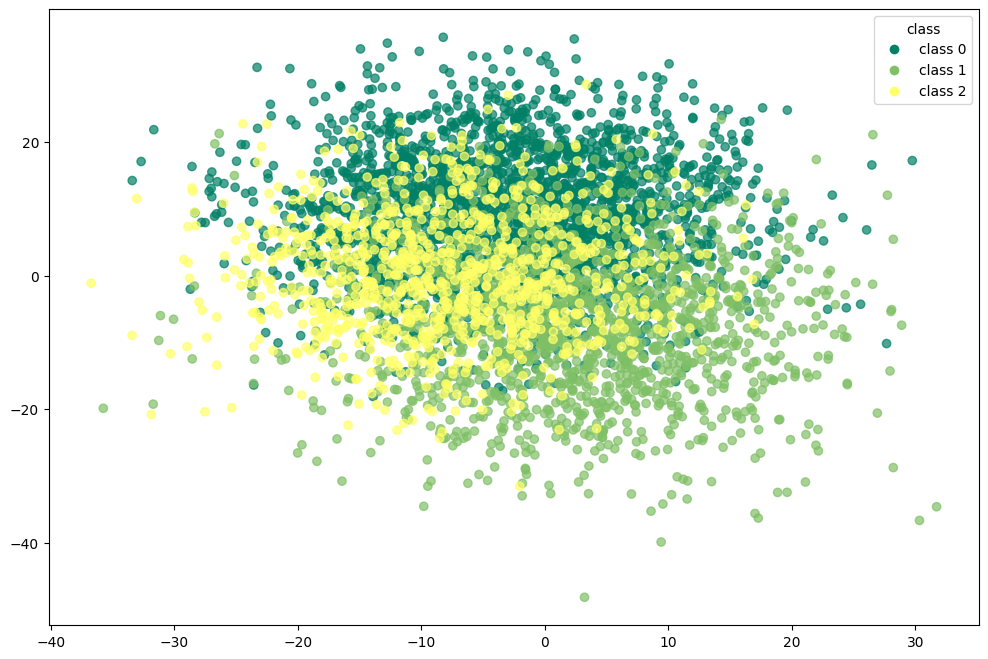

In [327]:
plt.figure(figsize=(12,8))
scatter = plt.scatter(df_pam_tsne.iloc[:, 0],df_pam_tsne.iloc[:, 1], 
                      c=df_pam_tsne['target'],cmap='summer',alpha=0.7)

unique_labels = np.unique(df_pam_tsne['target'])
legend_elements = [Line2D([0], [0],marker='o',color='w',label=f'class {label}',
                          markerfacecolor=scatter.cmap(scatter.norm(label)), markersize=8) 
                   for label in unique_labels]
plt.legend(handles=legend_elements,title="class")
plt.show()

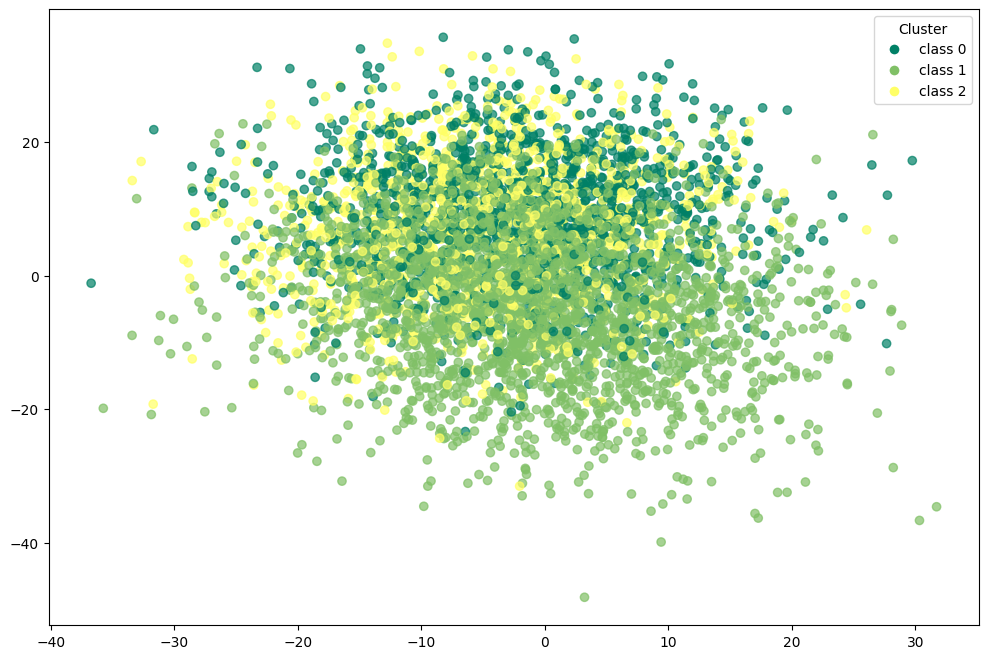

In [328]:
plt.figure(figsize=(12,8))
scatter = plt.scatter(df_pam_tsne.iloc[:, 0],df_pam_tsne.iloc[:, 1], 
                      c=df_pam_tsne['pam_tsne'],cmap='summer',alpha=0.7)

unique_labels = np.unique(df_pam_tsne['pam_tsne'])
legend_elements = [Line2D([0], [0],marker='o',color='w',label=f'class {label}',
                          markerfacecolor=scatter.cmap(scatter.norm(label)), markersize=8) 
                   for label in unique_labels]
plt.legend(handles=legend_elements,title="Cluster")
plt.show()

In [329]:
print(confusion_matrix(df_pam_tsne['target'],df_pam_tsne['pam_tsne']))

[[1376   15 1109]
 [  32 1397   71]
 [ 130  679  191]]


In [330]:
print(classification_report(df_pam_tsne['target'],df_pam_tsne['pam_tsne']))

              precision    recall  f1-score   support

           0       0.89      0.55      0.68      2500
           1       0.67      0.93      0.78      1500
           2       0.14      0.19      0.16      1000

    accuracy                           0.59      5000
   macro avg       0.57      0.56      0.54      5000
weighted avg       0.68      0.59      0.61      5000



In [331]:
adjusted_rand_score(df_pam_tsne['target'],df_pam_tsne['pam_tsne'])

0.40105952698748454

In [332]:
normalized_mutual_info_score(df_pam_tsne['target'],df_pam_tsne['pam_tsne'])

0.4407730195519505

In [333]:
silhouette_score(df_pam_tsne.drop(columns=['target','pam_tsne']).values,df_pam_tsne['pam_tsne'])

0.04966664134984774

### pam with umap

In [334]:
initial_medoids = np.random.choice(len(X_pca),3,replace=False)

In [335]:
metric = distance_metric(type_metric.EUCLIDEAN)

In [336]:
pam_umap = kmedoids(X_umap,initial_medoids,metric=metric)

In [337]:
pam_umap.process()

In [338]:
clusters = pam_umap.get_clusters()

In [339]:
medoids = pam_umap.get_medoids()

In [340]:
labels = np.zeros(len(X_umap))
for cluster_idx, cluster in enumerate(clusters):
    for data_idx in cluster:
        labels[data_idx] = cluster_idx

In [341]:
df_pam_umap = corr_dataset.copy()

In [342]:
df_pam_umap['pam_umap'] = labels

In [343]:
df_pam_umap

,vab_1,vab_2,vab_3,vab_4,vab_5,vab_6,vab_7,vab_8,vab_9,vab_10,...,vab_13,vab_14,vab_15,vab_16,vab_17,vab_18,vab_19,vab_20,target,pam_umap
0,-3.809655,7.452653,1.621266,5.962703,-20.914807,-8.423689,-8.428553,9.096505,21.201735,2.588196,...,13.283968,2.550128,-15.015724,-3.239401,11.489176,10.971089,-8.309928,3.946436,0,0.0
1,1.718677,17.454119,4.097770,10.133191,4.828268,13.212596,-4.307133,9.559942,-0.863631,20.272341,...,1.397689,-12.102205,-9.325296,4.879407,-10.138815,-0.100435,0.289000,-0.733288,0,0.0
2,5.739965,13.635069,5.916122,2.276878,-28.387848,-15.937000,-9.527188,10.810504,2.315007,14.456410,...,8.812864,-8.108574,14.782889,-8.321536,-7.157955,6.945980,5.029422,4.222092,0,0.0
3,-4.238654,24.096863,-9.541265,-2.624971,-17.097469,-13.364005,0.732528,-8.317549,-6.192643,8.681732,...,16.110083,14.050932,-2.290120,-8.231265,-7.154030,-5.391910,2.873629,-1.193631,0,0.0
4,2.163853,19.171583,22.662716,7.527734,-5.851084,-13.330661,-4.765595,4.136365,10.117018,-6.905581,...,-4.679307,-11.528358,-11.265091,3.498680,-16.718362,-4.685691,5.584172,9.084073,0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4995,-7.055721,-4.933603,-19.823557,16.800567,-1.211606,-3.712822,-0.637370,13.386826,8.358516,9.134989,...,25.085684,15.552802,0.702485,21.954281,-22.892991,-14.438625,-12.967728,-5.037305,2,2.0
4996,2.843118,-5.627838,-22.490543,14.119613,1.163222,-6.984198,-7.366098,-6.001417,-11.501928,-12.883781,...,-10.154374,-3.362936,5.876437,10.028466,-12.892411,-5.886227,-5.661087,-11.650669,2,2.0
4997,-10.554707,-12.143863,-14.814216,-3.226853,-1.324445,4.964251,-9.565188,19.327803,6.022009,0.986751,...,-3.791063,3.040745,2.070332,19.373326,-15.786374,-21.285011,-20.995450,0.845541,2,2.0
4998,-12.870637,-8.643988,-6.075779,4.484099,-21.532395,-5.134373,-0.485018,-5.882840,-5.950231,-8.705161,...,7.601373,25.977478,-6.552291,7.896572,2.455856,-3.093609,-17.791757,-15.966041,2,2.0


In [344]:
y_true = df_pam_umap['target'].values  
y_kmeans = df_pam_umap['pam_umap'].values  

conf_matrix = confusion_matrix(y_true, y_kmeans)

row_ind, col_ind = linear_sum_assignment(-conf_matrix)  

mapping = {old: new for old, new in zip(col_ind, row_ind)}
df_pam_umap['pam_umap'] = np.array([mapping[label] for label in y_kmeans])

print("accuracy before:", np.mean(y_kmeans == y_true))
print("accuracy after:", np.mean(df_pam_umap['pam_umap'] == y_true))

accuracy before: 0.9456
accuracy after: 0.9456


In [345]:
df_pam_umap

,vab_1,vab_2,vab_3,vab_4,vab_5,vab_6,vab_7,vab_8,vab_9,vab_10,...,vab_13,vab_14,vab_15,vab_16,vab_17,vab_18,vab_19,vab_20,target,pam_umap
0,-3.809655,7.452653,1.621266,5.962703,-20.914807,-8.423689,-8.428553,9.096505,21.201735,2.588196,...,13.283968,2.550128,-15.015724,-3.239401,11.489176,10.971089,-8.309928,3.946436,0,0
1,1.718677,17.454119,4.097770,10.133191,4.828268,13.212596,-4.307133,9.559942,-0.863631,20.272341,...,1.397689,-12.102205,-9.325296,4.879407,-10.138815,-0.100435,0.289000,-0.733288,0,0
2,5.739965,13.635069,5.916122,2.276878,-28.387848,-15.937000,-9.527188,10.810504,2.315007,14.456410,...,8.812864,-8.108574,14.782889,-8.321536,-7.157955,6.945980,5.029422,4.222092,0,0
3,-4.238654,24.096863,-9.541265,-2.624971,-17.097469,-13.364005,0.732528,-8.317549,-6.192643,8.681732,...,16.110083,14.050932,-2.290120,-8.231265,-7.154030,-5.391910,2.873629,-1.193631,0,0
4,2.163853,19.171583,22.662716,7.527734,-5.851084,-13.330661,-4.765595,4.136365,10.117018,-6.905581,...,-4.679307,-11.528358,-11.265091,3.498680,-16.718362,-4.685691,5.584172,9.084073,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4995,-7.055721,-4.933603,-19.823557,16.800567,-1.211606,-3.712822,-0.637370,13.386826,8.358516,9.134989,...,25.085684,15.552802,0.702485,21.954281,-22.892991,-14.438625,-12.967728,-5.037305,2,2
4996,2.843118,-5.627838,-22.490543,14.119613,1.163222,-6.984198,-7.366098,-6.001417,-11.501928,-12.883781,...,-10.154374,-3.362936,5.876437,10.028466,-12.892411,-5.886227,-5.661087,-11.650669,2,2
4997,-10.554707,-12.143863,-14.814216,-3.226853,-1.324445,4.964251,-9.565188,19.327803,6.022009,0.986751,...,-3.791063,3.040745,2.070332,19.373326,-15.786374,-21.285011,-20.995450,0.845541,2,2
4998,-12.870637,-8.643988,-6.075779,4.484099,-21.532395,-5.134373,-0.485018,-5.882840,-5.950231,-8.705161,...,7.601373,25.977478,-6.552291,7.896572,2.455856,-3.093609,-17.791757,-15.966041,2,2


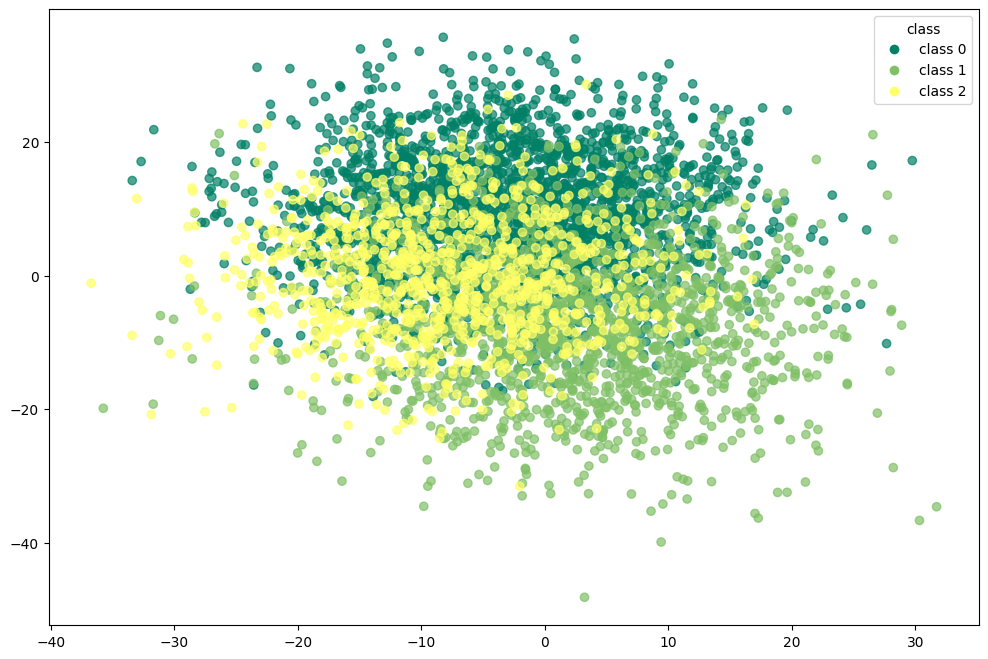

In [346]:
plt.figure(figsize=(12,8))
scatter = plt.scatter(df_pam_umap.iloc[:, 0],df_pam_umap.iloc[:, 1], 
                      c=df_pam_umap['target'],cmap='summer',alpha=0.7)

unique_labels = np.unique(df_pam_umap['target'])
legend_elements = [Line2D([0], [0],marker='o',color='w',label=f'class {label}',
                          markerfacecolor=scatter.cmap(scatter.norm(label)), markersize=8) 
                   for label in unique_labels]
plt.legend(handles=legend_elements,title="class")
plt.show()

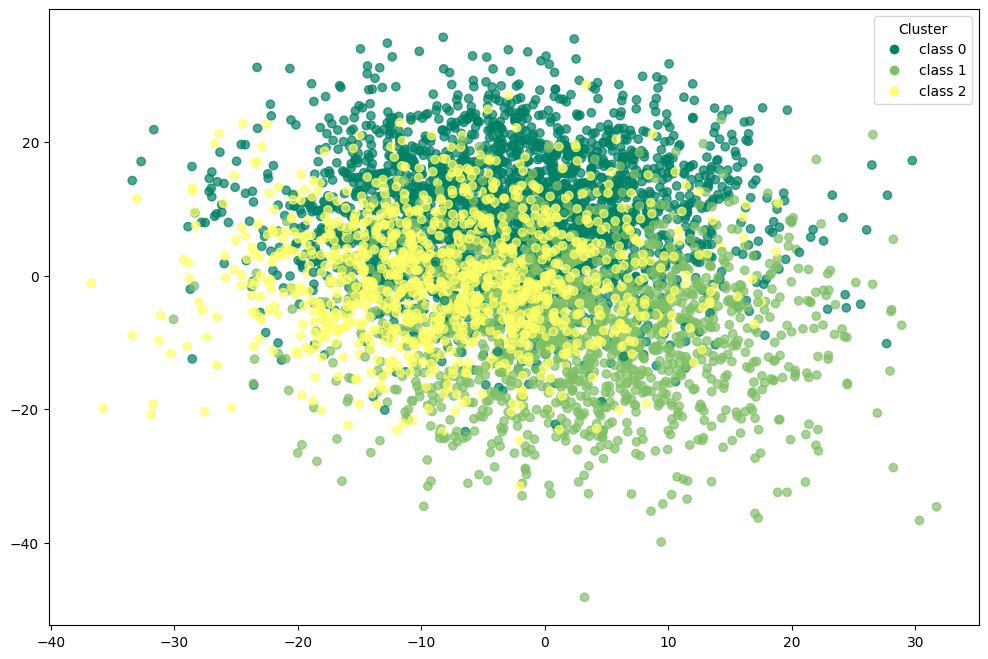

In [347]:
plt.figure(figsize=(12,8))
scatter = plt.scatter(df_pam_umap.iloc[:, 0],df_pam_umap.iloc[:, 1], 
                      c=df_pam_umap['pam_umap'],cmap='summer',alpha=0.7)

unique_labels = np.unique(df_pam_umap['pam_umap'])
legend_elements = [Line2D([0], [0],marker='o',color='w',label=f'class {label}',
                          markerfacecolor=scatter.cmap(scatter.norm(label)), markersize=8) 
                   for label in unique_labels]
plt.legend(handles=legend_elements,title="Cluster")
plt.show()

In [348]:
print(confusion_matrix(df_pam_umap['target'],df_pam_umap['pam_umap']))

[[2464    4   32]
 [  40 1313  147]
 [  25   24  951]]


In [349]:
print(classification_report(df_pam_umap['target'],df_pam_umap['pam_umap']))

              precision    recall  f1-score   support

           0       0.97      0.99      0.98      2500
           1       0.98      0.88      0.92      1500
           2       0.84      0.95      0.89      1000

    accuracy                           0.95      5000
   macro avg       0.93      0.94      0.93      5000
weighted avg       0.95      0.95      0.95      5000



In [350]:
adjusted_rand_score(df_pam_umap['target'],df_pam_umap['pam_umap'])

0.8707821378870853

In [351]:
normalized_mutual_info_score(df_pam_umap['target'],df_pam_umap['pam_umap'])

0.790397031010372

In [352]:
silhouette_score(df_pam_umap.drop(columns=['target','pam_umap']).values,df_pam_umap['pam_umap'])

0.13961123145210153

## spectral clustering

In [353]:
spectral_clustering = SpectralClustering(n_clusters=3,affinity ='rbf')

In [354]:
spectral_clustering.fit(X_values)

,n_clusters,3
,eigen_solver,None
,n_components,None
,random_state,None
,n_init,10
,gamma,1.0
,affinity,'rbf'
,n_neighbors,10
,eigen_tol,'auto'
,assign_labels,'kmeans'
,degree,3


In [355]:
df_spectral = corr_dataset.copy()

In [356]:
df_spectral['spectral_clustering'] = spectral_clustering.labels_

In [357]:
df_spectral

,vab_1,vab_2,vab_3,vab_4,vab_5,vab_6,vab_7,vab_8,vab_9,vab_10,...,vab_13,vab_14,vab_15,vab_16,vab_17,vab_18,vab_19,vab_20,target,spectral_clustering
0,-3.809655,7.452653,1.621266,5.962703,-20.914807,-8.423689,-8.428553,9.096505,21.201735,2.588196,...,13.283968,2.550128,-15.015724,-3.239401,11.489176,10.971089,-8.309928,3.946436,0,0
1,1.718677,17.454119,4.097770,10.133191,4.828268,13.212596,-4.307133,9.559942,-0.863631,20.272341,...,1.397689,-12.102205,-9.325296,4.879407,-10.138815,-0.100435,0.289000,-0.733288,0,0
2,5.739965,13.635069,5.916122,2.276878,-28.387848,-15.937000,-9.527188,10.810504,2.315007,14.456410,...,8.812864,-8.108574,14.782889,-8.321536,-7.157955,6.945980,5.029422,4.222092,0,0
3,-4.238654,24.096863,-9.541265,-2.624971,-17.097469,-13.364005,0.732528,-8.317549,-6.192643,8.681732,...,16.110083,14.050932,-2.290120,-8.231265,-7.154030,-5.391910,2.873629,-1.193631,0,0
4,2.163853,19.171583,22.662716,7.527734,-5.851084,-13.330661,-4.765595,4.136365,10.117018,-6.905581,...,-4.679307,-11.528358,-11.265091,3.498680,-16.718362,-4.685691,5.584172,9.084073,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4995,-7.055721,-4.933603,-19.823557,16.800567,-1.211606,-3.712822,-0.637370,13.386826,8.358516,9.134989,...,25.085684,15.552802,0.702485,21.954281,-22.892991,-14.438625,-12.967728,-5.037305,2,0
4996,2.843118,-5.627838,-22.490543,14.119613,1.163222,-6.984198,-7.366098,-6.001417,-11.501928,-12.883781,...,-10.154374,-3.362936,5.876437,10.028466,-12.892411,-5.886227,-5.661087,-11.650669,2,0
4997,-10.554707,-12.143863,-14.814216,-3.226853,-1.324445,4.964251,-9.565188,19.327803,6.022009,0.986751,...,-3.791063,3.040745,2.070332,19.373326,-15.786374,-21.285011,-20.995450,0.845541,2,0
4998,-12.870637,-8.643988,-6.075779,4.484099,-21.532395,-5.134373,-0.485018,-5.882840,-5.950231,-8.705161,...,7.601373,25.977478,-6.552291,7.896572,2.455856,-3.093609,-17.791757,-15.966041,2,0


In [358]:
y_true = df_spectral['target'].values  
y_spectral = df_spectral['spectral_clustering'].values  

conf_matrix = confusion_matrix(y_true, y_spectral)

row_ind, col_ind = linear_sum_assignment(-conf_matrix)  

mapping = {old: new for old, new in zip(col_ind, row_ind)}
df_spectral['spectral_clustering'] = np.array([mapping[label] for label in y_spectral])

print("accuracy before:", np.mean(y_spectral == y_true))
print("accuracy after:", np.mean(df_spectral['spectral_clustering'] == y_true))

accuracy before: 0.5008
accuracy after: 0.5008


In [359]:
df_spectral

,vab_1,vab_2,vab_3,vab_4,vab_5,vab_6,vab_7,vab_8,vab_9,vab_10,...,vab_13,vab_14,vab_15,vab_16,vab_17,vab_18,vab_19,vab_20,target,spectral_clustering
0,-3.809655,7.452653,1.621266,5.962703,-20.914807,-8.423689,-8.428553,9.096505,21.201735,2.588196,...,13.283968,2.550128,-15.015724,-3.239401,11.489176,10.971089,-8.309928,3.946436,0,0
1,1.718677,17.454119,4.097770,10.133191,4.828268,13.212596,-4.307133,9.559942,-0.863631,20.272341,...,1.397689,-12.102205,-9.325296,4.879407,-10.138815,-0.100435,0.289000,-0.733288,0,0
2,5.739965,13.635069,5.916122,2.276878,-28.387848,-15.937000,-9.527188,10.810504,2.315007,14.456410,...,8.812864,-8.108574,14.782889,-8.321536,-7.157955,6.945980,5.029422,4.222092,0,0
3,-4.238654,24.096863,-9.541265,-2.624971,-17.097469,-13.364005,0.732528,-8.317549,-6.192643,8.681732,...,16.110083,14.050932,-2.290120,-8.231265,-7.154030,-5.391910,2.873629,-1.193631,0,0
4,2.163853,19.171583,22.662716,7.527734,-5.851084,-13.330661,-4.765595,4.136365,10.117018,-6.905581,...,-4.679307,-11.528358,-11.265091,3.498680,-16.718362,-4.685691,5.584172,9.084073,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4995,-7.055721,-4.933603,-19.823557,16.800567,-1.211606,-3.712822,-0.637370,13.386826,8.358516,9.134989,...,25.085684,15.552802,0.702485,21.954281,-22.892991,-14.438625,-12.967728,-5.037305,2,0
4996,2.843118,-5.627838,-22.490543,14.119613,1.163222,-6.984198,-7.366098,-6.001417,-11.501928,-12.883781,...,-10.154374,-3.362936,5.876437,10.028466,-12.892411,-5.886227,-5.661087,-11.650669,2,0
4997,-10.554707,-12.143863,-14.814216,-3.226853,-1.324445,4.964251,-9.565188,19.327803,6.022009,0.986751,...,-3.791063,3.040745,2.070332,19.373326,-15.786374,-21.285011,-20.995450,0.845541,2,0
4998,-12.870637,-8.643988,-6.075779,4.484099,-21.532395,-5.134373,-0.485018,-5.882840,-5.950231,-8.705161,...,7.601373,25.977478,-6.552291,7.896572,2.455856,-3.093609,-17.791757,-15.966041,2,0


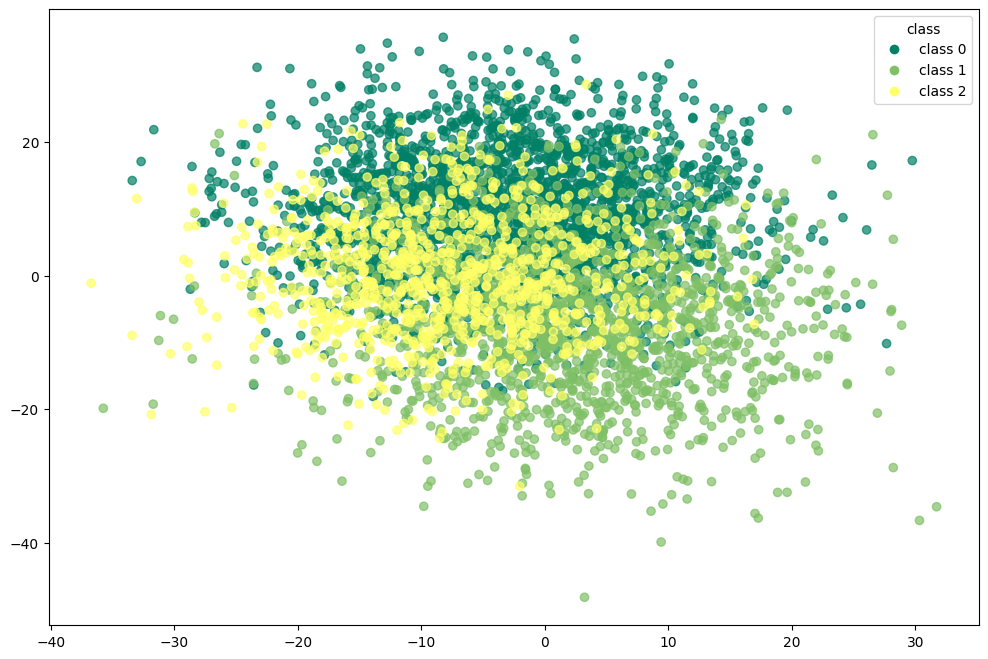

In [360]:
plt.figure(figsize=(12,8))
scatter = plt.scatter(df_spectral.iloc[:, 0],df_spectral.iloc[:, 1], 
                      c=df_spectral['target'],cmap='summer',alpha=0.7)

unique_labels = np.unique(df_spectral['target'])
legend_elements = [Line2D([0], [0],marker='o',color='w',label=f'class {label}',
                          markerfacecolor=scatter.cmap(scatter.norm(label)), markersize=8) 
                   for label in unique_labels]
plt.legend(handles=legend_elements,title="class")
plt.show()

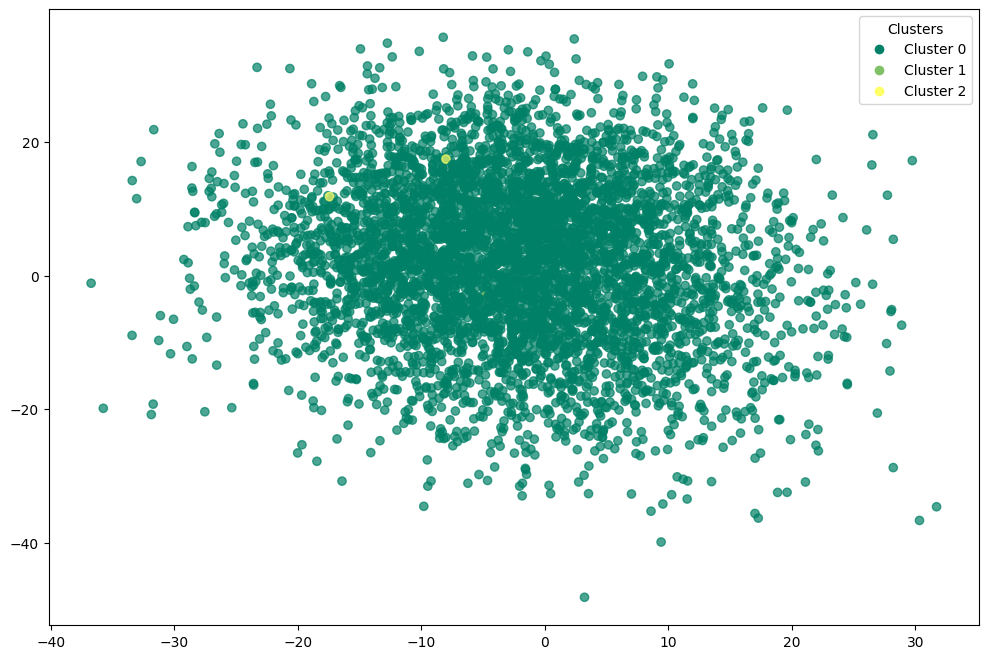

In [361]:
plt.figure(figsize=(12,8))
scatter = plt.scatter(df_spectral.iloc[:, 0], df_spectral.iloc[:, 1], 
                      c=df_spectral['spectral_clustering'], cmap='summer', alpha=0.7)
unique_clusters = np.unique(df_spectral['spectral_clustering'])
legend_elements = [Line2D([0], [0], marker='o', color='w', label=f'Cluster {cluster}',
                          markerfacecolor=scatter.cmap(scatter.norm(cluster)), markersize=8) 
                   for cluster in unique_clusters]
plt.legend(handles=legend_elements, title="Clusters")
plt.show()

In [362]:
print(confusion_matrix(df_spectral['target'],df_spectral['spectral_clustering']))

[[2500    0    0]
 [1498    2    0]
 [ 998    0    2]]


In [363]:
print(classification_report(df_spectral['target'],df_spectral['spectral_clustering']))

              precision    recall  f1-score   support

           0       0.50      1.00      0.67      2500
           1       1.00      0.00      0.00      1500
           2       1.00      0.00      0.00      1000

    accuracy                           0.50      5000
   macro avg       0.83      0.33      0.22      5000
weighted avg       0.75      0.50      0.34      5000



In [364]:
adjusted_rand_score(df_spectral['target'],df_spectral['spectral_clustering'])

0.0006716318984736926

In [365]:
normalized_mutual_info_score(df_spectral['target'],df_spectral['spectral_clustering'])

0.002171695376707921

In [366]:
silhouette_score(df_spectral.drop(columns=['target','spectral_clustering']).values,df_spectral['spectral_clustering'])

-0.0039017679712404574

### spectral clustering with pca

In [367]:
spectral_pca = SpectralClustering(n_clusters=3,affinity ='rbf')

In [368]:
spectral_pca.fit(X_pca)

,n_clusters,3
,eigen_solver,None
,n_components,None
,random_state,None
,n_init,10
,gamma,1.0
,affinity,'rbf'
,n_neighbors,10
,eigen_tol,'auto'
,assign_labels,'kmeans'
,degree,3


In [369]:
df_pca_spectral = corr_dataset.copy()

In [370]:
df_pca_spectral["spectral_pca"] = spectral_pca.labels_

In [371]:
df_pca_spectral

,vab_1,vab_2,vab_3,vab_4,vab_5,vab_6,vab_7,vab_8,vab_9,vab_10,...,vab_13,vab_14,vab_15,vab_16,vab_17,vab_18,vab_19,vab_20,target,spectral_pca
0,-3.809655,7.452653,1.621266,5.962703,-20.914807,-8.423689,-8.428553,9.096505,21.201735,2.588196,...,13.283968,2.550128,-15.015724,-3.239401,11.489176,10.971089,-8.309928,3.946436,0,0
1,1.718677,17.454119,4.097770,10.133191,4.828268,13.212596,-4.307133,9.559942,-0.863631,20.272341,...,1.397689,-12.102205,-9.325296,4.879407,-10.138815,-0.100435,0.289000,-0.733288,0,0
2,5.739965,13.635069,5.916122,2.276878,-28.387848,-15.937000,-9.527188,10.810504,2.315007,14.456410,...,8.812864,-8.108574,14.782889,-8.321536,-7.157955,6.945980,5.029422,4.222092,0,0
3,-4.238654,24.096863,-9.541265,-2.624971,-17.097469,-13.364005,0.732528,-8.317549,-6.192643,8.681732,...,16.110083,14.050932,-2.290120,-8.231265,-7.154030,-5.391910,2.873629,-1.193631,0,0
4,2.163853,19.171583,22.662716,7.527734,-5.851084,-13.330661,-4.765595,4.136365,10.117018,-6.905581,...,-4.679307,-11.528358,-11.265091,3.498680,-16.718362,-4.685691,5.584172,9.084073,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4995,-7.055721,-4.933603,-19.823557,16.800567,-1.211606,-3.712822,-0.637370,13.386826,8.358516,9.134989,...,25.085684,15.552802,0.702485,21.954281,-22.892991,-14.438625,-12.967728,-5.037305,2,2
4996,2.843118,-5.627838,-22.490543,14.119613,1.163222,-6.984198,-7.366098,-6.001417,-11.501928,-12.883781,...,-10.154374,-3.362936,5.876437,10.028466,-12.892411,-5.886227,-5.661087,-11.650669,2,2
4997,-10.554707,-12.143863,-14.814216,-3.226853,-1.324445,4.964251,-9.565188,19.327803,6.022009,0.986751,...,-3.791063,3.040745,2.070332,19.373326,-15.786374,-21.285011,-20.995450,0.845541,2,2
4998,-12.870637,-8.643988,-6.075779,4.484099,-21.532395,-5.134373,-0.485018,-5.882840,-5.950231,-8.705161,...,7.601373,25.977478,-6.552291,7.896572,2.455856,-3.093609,-17.791757,-15.966041,2,2


In [372]:
y_true = df_pca_spectral['target'].values  
y_spectral_pca = df_pca_spectral['spectral_pca'].values  

conf_matrix = confusion_matrix(y_true, y_spectral_pca)

row_ind, col_ind = linear_sum_assignment(-conf_matrix)  

mapping = {old: new for old, new in zip(col_ind, row_ind)}
df_pca_spectral['spectral_pca'] = np.array([mapping[label] for label in y_spectral_pca])

print("accuracy before:", np.mean(y_spectral_pca == y_true))
print("accuracy after:", np.mean(df_pca_spectral['spectral_pca'] == y_true))

accuracy before: 0.9554
accuracy after: 0.9554


In [373]:
df_pca_spectral

,vab_1,vab_2,vab_3,vab_4,vab_5,vab_6,vab_7,vab_8,vab_9,vab_10,...,vab_13,vab_14,vab_15,vab_16,vab_17,vab_18,vab_19,vab_20,target,spectral_pca
0,-3.809655,7.452653,1.621266,5.962703,-20.914807,-8.423689,-8.428553,9.096505,21.201735,2.588196,...,13.283968,2.550128,-15.015724,-3.239401,11.489176,10.971089,-8.309928,3.946436,0,0
1,1.718677,17.454119,4.097770,10.133191,4.828268,13.212596,-4.307133,9.559942,-0.863631,20.272341,...,1.397689,-12.102205,-9.325296,4.879407,-10.138815,-0.100435,0.289000,-0.733288,0,0
2,5.739965,13.635069,5.916122,2.276878,-28.387848,-15.937000,-9.527188,10.810504,2.315007,14.456410,...,8.812864,-8.108574,14.782889,-8.321536,-7.157955,6.945980,5.029422,4.222092,0,0
3,-4.238654,24.096863,-9.541265,-2.624971,-17.097469,-13.364005,0.732528,-8.317549,-6.192643,8.681732,...,16.110083,14.050932,-2.290120,-8.231265,-7.154030,-5.391910,2.873629,-1.193631,0,0
4,2.163853,19.171583,22.662716,7.527734,-5.851084,-13.330661,-4.765595,4.136365,10.117018,-6.905581,...,-4.679307,-11.528358,-11.265091,3.498680,-16.718362,-4.685691,5.584172,9.084073,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4995,-7.055721,-4.933603,-19.823557,16.800567,-1.211606,-3.712822,-0.637370,13.386826,8.358516,9.134989,...,25.085684,15.552802,0.702485,21.954281,-22.892991,-14.438625,-12.967728,-5.037305,2,2
4996,2.843118,-5.627838,-22.490543,14.119613,1.163222,-6.984198,-7.366098,-6.001417,-11.501928,-12.883781,...,-10.154374,-3.362936,5.876437,10.028466,-12.892411,-5.886227,-5.661087,-11.650669,2,2
4997,-10.554707,-12.143863,-14.814216,-3.226853,-1.324445,4.964251,-9.565188,19.327803,6.022009,0.986751,...,-3.791063,3.040745,2.070332,19.373326,-15.786374,-21.285011,-20.995450,0.845541,2,2
4998,-12.870637,-8.643988,-6.075779,4.484099,-21.532395,-5.134373,-0.485018,-5.882840,-5.950231,-8.705161,...,7.601373,25.977478,-6.552291,7.896572,2.455856,-3.093609,-17.791757,-15.966041,2,2


In [374]:
print(confusion_matrix(df_pca_spectral['target'],df_pca_spectral['spectral_pca']))

[[2487    3   10]
 [  38 1376   86]
 [  51   35  914]]


In [375]:
print(classification_report(df_pca_spectral['target'],df_pca_spectral['spectral_pca']))

              precision    recall  f1-score   support

           0       0.97      0.99      0.98      2500
           1       0.97      0.92      0.94      1500
           2       0.90      0.91      0.91      1000

    accuracy                           0.96      5000
   macro avg       0.95      0.94      0.94      5000
weighted avg       0.96      0.96      0.96      5000



In [376]:
adjusted_rand_score(df_pca_spectral['target'],df_pca_spectral['spectral_pca'])

0.8898002695813149

In [377]:
normalized_mutual_info_score(df_pca_spectral['target'],df_pca_spectral['spectral_pca'])

0.8122144736760274

In [378]:
silhouette_score(df_pca_spectral.drop(columns=['target','spectral_pca']).values,df_pca_spectral['spectral_pca'])

0.14133525015146214

### spectral clustering with t-SNE

In [379]:
spectral_tsne = SpectralClustering(n_clusters=3,affinity ='rbf')

In [380]:
spectral_tsne.fit(X_tsne)

KeyboardInterrupt: 

In [ ]:
df_tsne_spectral = corr_dataset.copy()

In [ ]:
df_tsne_spectral['spectral_tsne'] = spectral_tsne.labels_

In [ ]:
df_tsne_spectral

,vab_1,vab_2,vab_3,vab_4,vab_5,vab_6,vab_7,vab_8,vab_9,vab_10,...,vab_13,vab_14,vab_15,vab_16,vab_17,vab_18,vab_19,vab_20,target,kmeans_tsne
0,-5.152004,9.124349,8.018804,2.909264,-3.593232,-7.170291,-9.392568,3.986254,0.732290,4.812019,...,4.106921,-2.731575,-8.178097,-10.124234,-1.932494,0.666321,0.206354,-8.685204,0,2
1,0.776633,7.139438,-0.956529,-4.054445,-9.419401,-13.455876,-8.429588,6.968542,1.678403,1.004490,...,6.035455,-7.118252,-8.740804,-11.896706,-2.365136,-2.325526,-2.285224,-3.609069,0,2
2,-2.706756,7.837347,6.061989,2.985600,-6.972435,-8.129626,-6.761865,4.359043,2.322148,4.728814,...,4.943632,-3.328174,-3.815171,-10.766150,-3.478127,0.064453,1.617425,-1.288632,0,2
3,-1.831845,7.410481,3.966438,4.072164,-6.687061,-4.511670,-6.201272,8.042037,2.391284,2.192819,...,6.798002,-8.760151,-3.662339,-7.989494,-3.478067,0.965423,4.407371,0.681622,0,2
4,-0.190637,9.221953,6.432244,1.829044,-4.080903,-4.686219,-7.196596,8.747315,3.658733,6.821809,...,2.840858,-5.588362,-7.941978,-6.003940,-3.433710,-0.171449,-0.058949,-3.605684,0,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9994,-4.677455,-3.645803,-8.974268,8.842406,-1.318838,7.394712,-7.441952,-2.754346,7.863326,-11.675801,...,7.010298,6.893327,1.987985,8.618069,0.499451,-7.866530,-8.241748,-4.571805,2,1
9995,-9.818894,-2.279549,-10.627805,8.467228,-5.507880,2.429212,1.343342,-3.196335,-1.992973,-8.184132,...,5.118475,12.095014,3.449935,1.945385,-4.387963,-11.392284,-8.420734,-2.514598,2,1
9996,-15.227076,-4.736645,-8.243842,2.110539,-4.649238,1.493749,-4.114069,-0.522743,1.498673,-6.005086,...,9.068735,8.877587,-1.682355,3.393315,-3.681439,-1.337268,-14.706864,-3.746624,2,1
9997,-5.454461,3.202938,-5.268023,7.006287,-3.409112,4.557069,-4.723157,-2.494617,5.311604,-7.006290,...,12.974825,14.429359,-0.016353,5.918872,-12.139450,-6.083068,-13.410955,-0.592108,2,1


In [ ]:
y_true = df_tsne_spectral['target'].values  
y_spectral_tsne = df_tsne_spectral['spectral_tsne'].values  

conf_matrix = confusion_matrix(y_true, y_spectral_tsne)

row_ind, col_ind = linear_sum_assignment(-conf_matrix)  

mapping = {old: new for old, new in zip(col_ind, row_ind)}
df_tsne_spectral['spectral_tsne'] = np.array([mapping[label] for label in y_spectral_tsne])

print("accuracy before:", np.mean(y_spectral_tsne == y_true))
print("accuracy after:", np.mean(df_tsne_spectral['spectral_tsne'] == y_true))

accuracy before: 0.0033003300330033004
accuracy after: 0.9964996499649965


In [ ]:
df_tsne_spectral

,vab_1,vab_2,vab_3,vab_4,vab_5,vab_6,vab_7,vab_8,vab_9,vab_10,...,vab_13,vab_14,vab_15,vab_16,vab_17,vab_18,vab_19,vab_20,target,kmeans_tsne
0,-5.152004,9.124349,8.018804,2.909264,-3.593232,-7.170291,-9.392568,3.986254,0.732290,4.812019,...,4.106921,-2.731575,-8.178097,-10.124234,-1.932494,0.666321,0.206354,-8.685204,0,0
1,0.776633,7.139438,-0.956529,-4.054445,-9.419401,-13.455876,-8.429588,6.968542,1.678403,1.004490,...,6.035455,-7.118252,-8.740804,-11.896706,-2.365136,-2.325526,-2.285224,-3.609069,0,0
2,-2.706756,7.837347,6.061989,2.985600,-6.972435,-8.129626,-6.761865,4.359043,2.322148,4.728814,...,4.943632,-3.328174,-3.815171,-10.766150,-3.478127,0.064453,1.617425,-1.288632,0,0
3,-1.831845,7.410481,3.966438,4.072164,-6.687061,-4.511670,-6.201272,8.042037,2.391284,2.192819,...,6.798002,-8.760151,-3.662339,-7.989494,-3.478067,0.965423,4.407371,0.681622,0,0
4,-0.190637,9.221953,6.432244,1.829044,-4.080903,-4.686219,-7.196596,8.747315,3.658733,6.821809,...,2.840858,-5.588362,-7.941978,-6.003940,-3.433710,-0.171449,-0.058949,-3.605684,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9994,-4.677455,-3.645803,-8.974268,8.842406,-1.318838,7.394712,-7.441952,-2.754346,7.863326,-11.675801,...,7.010298,6.893327,1.987985,8.618069,0.499451,-7.866530,-8.241748,-4.571805,2,2
9995,-9.818894,-2.279549,-10.627805,8.467228,-5.507880,2.429212,1.343342,-3.196335,-1.992973,-8.184132,...,5.118475,12.095014,3.449935,1.945385,-4.387963,-11.392284,-8.420734,-2.514598,2,2
9996,-15.227076,-4.736645,-8.243842,2.110539,-4.649238,1.493749,-4.114069,-0.522743,1.498673,-6.005086,...,9.068735,8.877587,-1.682355,3.393315,-3.681439,-1.337268,-14.706864,-3.746624,2,2
9997,-5.454461,3.202938,-5.268023,7.006287,-3.409112,4.557069,-4.723157,-2.494617,5.311604,-7.006290,...,12.974825,14.429359,-0.016353,5.918872,-12.139450,-6.083068,-13.410955,-0.592108,2,2


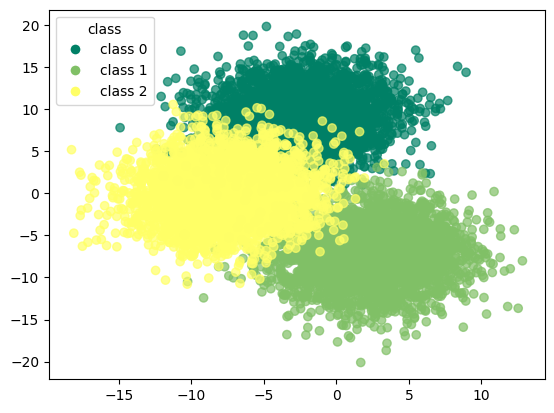

In [ ]:
plt.figure(figsize=(12,8))
scatter = plt.scatter(df_tsne_spectral.iloc[:, 0], df_tsne_spectral.iloc[:, 1], 
                      c=df_tsne_spectral['target'], cmap='summer', alpha=0.7)

unique_labels = np.unique(df_tsne_spectral['target'])
legend_elements = [Line2D([0], [0], marker='o', color='w', label=f'class {label}',
                          markerfacecolor=scatter.cmap(scatter.norm(label)), markersize=8) 
                   for label in unique_labels]
plt.legend(handles=legend_elements, title="class")
plt.show()

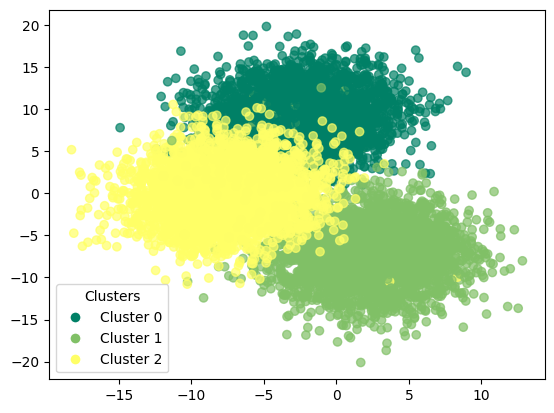

In [ ]:
plt.figure(figsize=(12,8))
scatter = plt.scatter(df_tsne_spectral.iloc[:, 0], df_tsne_spectral.iloc[:, 1], 
                      c=df_tsne_spectral['spectral_tsne'], cmap='summer', alpha=0.7)
unique_clusters = np.unique(df_tsne_spectral['spectral_tsne'])
legend_elements = [Line2D([0], [0], marker='o', color='w', label=f'Cluster {cluster}',
                          markerfacecolor=scatter.cmap(scatter.norm(cluster)), markersize=8) 
                   for cluster in unique_clusters]
plt.legend(handles=legend_elements, title="Clusters")
plt.show()

In [ ]:
print(confusion_matrix(df_tsne_spectral['target'],df_tsne_spectral['spectral_tsne']))

[[3303   29    1]
 [   0 3329    4]
 [   0    1 3332]]


In [ ]:
print(classification_report(df_tsne_spectral['target'],df_tsne_spectral['spectral_tsne'])) 

              precision    recall  f1-score   support

           0       1.00      0.99      1.00      3333
           1       0.99      1.00      0.99      3333
           2       1.00      1.00      1.00      3333

    accuracy                           1.00      9999
   macro avg       1.00      1.00      1.00      9999
weighted avg       1.00      1.00      1.00      9999



In [ ]:
adjusted_rand_score(df_tsne_spectral['target'],df_tsne_spectral['spectral_tsne'])

0.4287245621518938

In [ ]:
normalized_mutual_info_score(df_tsne_spectral['target'],df_tsne_spectral['spectral_tsne'])

0.7692189705956035

In [ ]:
silhouette_score(df_tsne_spectral.drop(columns=['target','spectral_tsne']).values,df_tsne_spectral['spectral_tsne'])

0.41501469842079386

### spectral clustering with umap

In [ ]:
spectral_umap = SpectralClustering(n_clusters=3,affinity ='rbf')

In [ ]:
spectral_umap.fit(X_umap)

KMeans(n_clusters=3, random_state=42)

In [ ]:
df_umap_spectral = corr_dataset.copy()

In [ ]:
df_umap_spectral['spectral_umap'] = spectral_umap.labels_

In [ ]:
df_umap_spectral

,vab_1,vab_2,vab_3,vab_4,vab_5,vab_6,vab_7,vab_8,vab_9,vab_10,...,vab_13,vab_14,vab_15,vab_16,vab_17,vab_18,vab_19,vab_20,target,kmeans_umap
0,-5.152004,9.124349,8.018804,2.909264,-3.593232,-7.170291,-9.392568,3.986254,0.732290,4.812019,...,4.106921,-2.731575,-8.178097,-10.124234,-1.932494,0.666321,0.206354,-8.685204,0,2
1,0.776633,7.139438,-0.956529,-4.054445,-9.419401,-13.455876,-8.429588,6.968542,1.678403,1.004490,...,6.035455,-7.118252,-8.740804,-11.896706,-2.365136,-2.325526,-2.285224,-3.609069,0,2
2,-2.706756,7.837347,6.061989,2.985600,-6.972435,-8.129626,-6.761865,4.359043,2.322148,4.728814,...,4.943632,-3.328174,-3.815171,-10.766150,-3.478127,0.064453,1.617425,-1.288632,0,2
3,-1.831845,7.410481,3.966438,4.072164,-6.687061,-4.511670,-6.201272,8.042037,2.391284,2.192819,...,6.798002,-8.760151,-3.662339,-7.989494,-3.478067,0.965423,4.407371,0.681622,0,2
4,-0.190637,9.221953,6.432244,1.829044,-4.080903,-4.686219,-7.196596,8.747315,3.658733,6.821809,...,2.840858,-5.588362,-7.941978,-6.003940,-3.433710,-0.171449,-0.058949,-3.605684,0,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9994,-4.677455,-3.645803,-8.974268,8.842406,-1.318838,7.394712,-7.441952,-2.754346,7.863326,-11.675801,...,7.010298,6.893327,1.987985,8.618069,0.499451,-7.866530,-8.241748,-4.571805,2,1
9995,-9.818894,-2.279549,-10.627805,8.467228,-5.507880,2.429212,1.343342,-3.196335,-1.992973,-8.184132,...,5.118475,12.095014,3.449935,1.945385,-4.387963,-11.392284,-8.420734,-2.514598,2,1
9996,-15.227076,-4.736645,-8.243842,2.110539,-4.649238,1.493749,-4.114069,-0.522743,1.498673,-6.005086,...,9.068735,8.877587,-1.682355,3.393315,-3.681439,-1.337268,-14.706864,-3.746624,2,1
9997,-5.454461,3.202938,-5.268023,7.006287,-3.409112,4.557069,-4.723157,-2.494617,5.311604,-7.006290,...,12.974825,14.429359,-0.016353,5.918872,-12.139450,-6.083068,-13.410955,-0.592108,2,1


In [ ]:
y_true = df_umap_spectral['target'].values  
y_spectral = df_umap_spectral['spectral_umap'].values  

conf_matrix = confusion_matrix(y_true, y_spectral)

row_ind, col_ind = linear_sum_assignment(-conf_matrix)  

mapping = {old: new for old, new in zip(col_ind, row_ind)}
df_umap_spectral['spectral_umap'] = np.array([mapping[label] for label in y_spectral])

print("accuracy before:", np.mean(y_spectral == y_true))
print("accuracy after:", np.mean(df_umap_spectral['spectral_umap'] == y_true))

accuracy before: 0.0
accuracy after: 1.0


In [ ]:
df_umap_spectral

,vab_1,vab_2,vab_3,vab_4,vab_5,vab_6,vab_7,vab_8,vab_9,vab_10,...,vab_13,vab_14,vab_15,vab_16,vab_17,vab_18,vab_19,vab_20,target,kmeans_umap
0,-5.152004,9.124349,8.018804,2.909264,-3.593232,-7.170291,-9.392568,3.986254,0.732290,4.812019,...,4.106921,-2.731575,-8.178097,-10.124234,-1.932494,0.666321,0.206354,-8.685204,0,0
1,0.776633,7.139438,-0.956529,-4.054445,-9.419401,-13.455876,-8.429588,6.968542,1.678403,1.004490,...,6.035455,-7.118252,-8.740804,-11.896706,-2.365136,-2.325526,-2.285224,-3.609069,0,0
2,-2.706756,7.837347,6.061989,2.985600,-6.972435,-8.129626,-6.761865,4.359043,2.322148,4.728814,...,4.943632,-3.328174,-3.815171,-10.766150,-3.478127,0.064453,1.617425,-1.288632,0,0
3,-1.831845,7.410481,3.966438,4.072164,-6.687061,-4.511670,-6.201272,8.042037,2.391284,2.192819,...,6.798002,-8.760151,-3.662339,-7.989494,-3.478067,0.965423,4.407371,0.681622,0,0
4,-0.190637,9.221953,6.432244,1.829044,-4.080903,-4.686219,-7.196596,8.747315,3.658733,6.821809,...,2.840858,-5.588362,-7.941978,-6.003940,-3.433710,-0.171449,-0.058949,-3.605684,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9994,-4.677455,-3.645803,-8.974268,8.842406,-1.318838,7.394712,-7.441952,-2.754346,7.863326,-11.675801,...,7.010298,6.893327,1.987985,8.618069,0.499451,-7.866530,-8.241748,-4.571805,2,2
9995,-9.818894,-2.279549,-10.627805,8.467228,-5.507880,2.429212,1.343342,-3.196335,-1.992973,-8.184132,...,5.118475,12.095014,3.449935,1.945385,-4.387963,-11.392284,-8.420734,-2.514598,2,2
9996,-15.227076,-4.736645,-8.243842,2.110539,-4.649238,1.493749,-4.114069,-0.522743,1.498673,-6.005086,...,9.068735,8.877587,-1.682355,3.393315,-3.681439,-1.337268,-14.706864,-3.746624,2,2
9997,-5.454461,3.202938,-5.268023,7.006287,-3.409112,4.557069,-4.723157,-2.494617,5.311604,-7.006290,...,12.974825,14.429359,-0.016353,5.918872,-12.139450,-6.083068,-13.410955,-0.592108,2,2


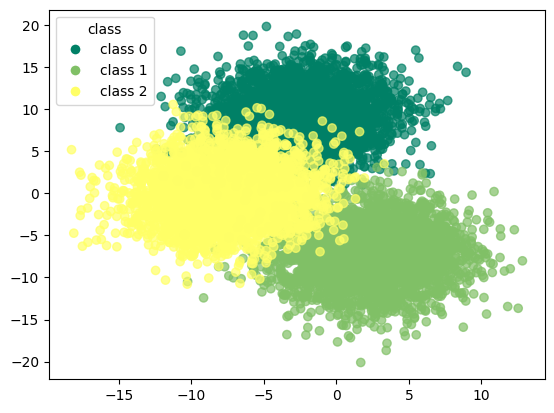

In [ ]:
plt.figure(figsize=(12,8))
scatter = plt.scatter(df_umap_spectral.iloc[:, 0], df_umap_spectral.iloc[:, 1], 
                      c=df_umap_spectral['target'], cmap='summer', alpha=0.7)

unique_labels = np.unique(df_umap_spectral['target'])
legend_elements = [Line2D([0], [0], marker='o', color='w', label=f'class {label}',    
                          markerfacecolor=scatter.cmap(scatter.norm(label)), markersize=8) 
                   for label in unique_labels]
plt.legend(handles=legend_elements, title="class")
plt.show()

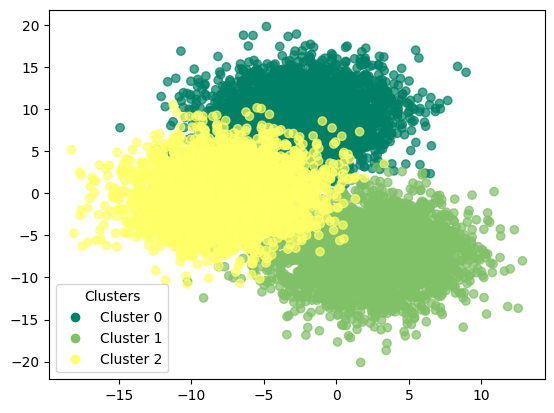

In [ ]:
plt.figure(figsize=(12,8)) 
scatter = plt.scatter(df_umap_spectral.iloc[:, 0], df_umap_spectral.iloc[:, 1], 
                      c=df_umap_spectral['spectral_umap'], cmap='summer', alpha=0.7)
unique_clusters = np.unique(df_umap_spectral['spectral_umap'])
legend_elements = [Line2D([0], [0], marker='o', color='w', label=f'Cluster {cluster}',
                          markerfacecolor=scatter.cmap(scatter.norm(cluster)), markersize=8) 
                   for cluster in unique_clusters]
plt.legend(handles=legend_elements, title="Clusters")
plt.show()

In [ ]:
print(confusion_matrix(df_umap_spectral['target'],df_umap_spectral['spectral_umap']))

[[3333    0    0]
 [   0 3333    0]
 [   0    0 3333]]


In [ ]:
print(classification_report(df_umap_spectral['target'],df_umap_spectral['spectral_umap'])) 

              precision    recall  f1-score   support

           0       1.00      1.00      1.00      3333
           1       1.00      1.00      1.00      3333
           2       1.00      1.00      1.00      3333

    accuracy                           1.00      9999
   macro avg       1.00      1.00      1.00      9999
weighted avg       1.00      1.00      1.00      9999



In [ ]:
adjusted_rand_score(df_umap_spectral['target'],df_umap_spectral['spectral_umap'])

0.4287245621518938

In [ ]:
normalized_mutual_info_score(df_umap_spectral['target'],df_umap_spectral['spectral_umap'])

0.7692189705956035

In [ ]:
silhouette_score(df_umap_spectral.drop(columns=['target','spectral_umap']).values,df_umap_spectral['spectral_umap'])

0.41501469842079386

# overall results k-means

## basic

In [ ]:
print(classification_report(df_kmeans['target'],df_kmeans['k_means']))

              precision    recall  f1-score   support

           0       1.00      1.00      1.00      3333
           1       1.00      1.00      1.00      3333
           2       1.00      1.00      1.00      3333

    accuracy                           1.00      9999
   macro avg       1.00      1.00      1.00      9999
weighted avg       1.00      1.00      1.00      9999



In [ ]:
print(confusion_matrix(df_kmeans['target'],df_kmeans['k_means']))

[[3333    0    0]
 [   0 3333    0]
 [   0    0 3333]]


## + pca

In [ ]:
print(classification_report(df_pca_kmeans['target'],df_pca_kmeans['kmeans_pca']))

              precision    recall  f1-score   support

           0       1.00      0.51      0.68      3333
           1       0.50      1.00      0.67      3333
           2       0.00      0.00      0.00      3333

    accuracy                           0.50      9999
   macro avg       0.50      0.50      0.45      9999
weighted avg       0.50      0.50      0.45      9999



In [ ]:
print(confusion_matrix(df_pca_kmeans['target'],df_pca_kmeans['kmeans_pca']))

[[1708    0 1625]
 [   0 3333    0]
 [   0 3333    0]]


## + t-SNE

In [ ]:
print(classification_report(df_tsne_kmeans['target'],df_tsne_kmeans['kmeans_tsne'])) 

              precision    recall  f1-score   support

           0       1.00      0.99      1.00      3333
           1       0.99      1.00      0.99      3333
           2       1.00      1.00      1.00      3333

    accuracy                           1.00      9999
   macro avg       1.00      1.00      1.00      9999
weighted avg       1.00      1.00      1.00      9999



In [ ]:
print(confusion_matrix(df_tsne_kmeans['target'],df_tsne_kmeans['kmeans_tsne'])) 

[[3303   29    1]
 [   0 3329    4]
 [   0    1 3332]]


## + UMAP

In [ ]:
print(classification_report(df_umap_kmeans['target'],df_umap_kmeans['kmeans_umap'])) 

              precision    recall  f1-score   support

           0       1.00      1.00      1.00      3333
           1       1.00      1.00      1.00      3333
           2       1.00      1.00      1.00      3333

    accuracy                           1.00      9999
   macro avg       1.00      1.00      1.00      9999
weighted avg       1.00      1.00      1.00      9999



In [ ]:
print(confusion_matrix(df_umap_kmeans['target'],df_umap_kmeans['kmeans_umap'])) 

[[3333    0    0]
 [   0 3333    0]
 [   0    0 3333]]


# overall results trimmed k-means

## basic

In [ ]:
print(classification_report(df_trim_kmeans['target'],df_trim_kmeans['trim_kmeans']))

              precision    recall  f1-score   support

           0       1.00      1.00      1.00      3001
           1       1.00      1.00      1.00      2968
           2       1.00      1.00      1.00      3030

    accuracy                           1.00      8999
   macro avg       1.00      1.00      1.00      8999
weighted avg       1.00      1.00      1.00      8999



In [ ]:
print(confusion_matrix(df_trim_kmeans['target'],df_trim_kmeans['trim_kmeans']))

[[3001    0    0]
 [   0 2968    0]
 [   0    0 3030]]


## + pca

In [ ]:
print(classification_report(df_pca_trim_kmeans['target'],df_pca_trim_kmeans['trim_kmeans_pca']))

              precision    recall  f1-score   support

           0       0.90      1.00      0.95      3001
           1       0.94      0.89      0.91      2968
           2       1.00      0.95      0.97      3030

    accuracy                           0.94      8999
   macro avg       0.95      0.94      0.94      8999
weighted avg       0.95      0.94      0.94      8999



In [ ]:
print(confusion_matrix(df_pca_trim_kmeans['target'],df_pca_trim_kmeans['trim_kmeans_pca']))

[[3001    0    0]
 [ 331 2637    0]
 [   0  165 2865]]


## + t-SNE

In [ ]:
print(classification_report(df_tsne_trim_kmeans['target'],df_tsne_trim_kmeans['trim_kmeans_tsne'])) 

              precision    recall  f1-score   support

           0       0.97      0.99      0.98      3001
           1       0.97      0.97      0.97      2968
           2       1.00      0.98      0.99      3030

    accuracy                           0.98      8999
   macro avg       0.98      0.98      0.98      8999
weighted avg       0.98      0.98      0.98      8999



In [ ]:
print(confusion_matrix(df_tsne_trim_kmeans['target'],df_tsne_trim_kmeans['trim_kmeans_tsne'])) 

[[2973   27    1]
 [  77 2888    3]
 [   0   62 2968]]


## + UMAP

In [ ]:
print(classification_report(df_umap_trim_kmeans['target'],df_umap_trim_kmeans['trim_kmeans_umap'])) 

              precision    recall  f1-score   support

           0       1.00      1.00      1.00      2903
           1       1.00      1.00      1.00      3102
           2       1.00      1.00      1.00      2994

    accuracy                           1.00      8999
   macro avg       1.00      1.00      1.00      8999
weighted avg       1.00      1.00      1.00      8999



In [ ]:
print(confusion_matrix(df_umap_trim_kmeans['target'],df_umap_trim_kmeans['trim_kmeans_umap'])) 

[[2903    0    0]
 [   0 3102    0]
 [   0    0 2994]]


# overall results dbscan

## basic

In [ ]:
print(classification_report(df_dbscan['target'],df_dbscan['dbscan']))

              precision    recall  f1-score   support

          -1       0.00      0.00      0.00       0.0
           0       0.00      0.00      0.00    3333.0
           1       0.00      0.00      0.00    3333.0
           2       0.00      0.00      0.00    3333.0

    accuracy                           0.00    9999.0
   macro avg       0.00      0.00      0.00    9999.0
weighted avg       0.00      0.00      0.00    9999.0



In [ ]:
print(confusion_matrix(df_dbscan['target'],df_dbscan['dbscan']))

[[   0    0    0    0]
 [3333    0    0    0]
 [3333    0    0    0]
 [3333    0    0    0]]


## + pca

In [ ]:
print(classification_report(df_pca_dbscan['target'],df_pca_dbscan['dbscan_pca']))

              precision    recall  f1-score   support

          -1       0.00      0.00      0.00         0
           0       1.00      0.96      0.98      3333
           1       1.00      0.95      0.98      3333
           2       1.00      0.97      0.98      3333

    accuracy                           0.96      9999
   macro avg       0.75      0.72      0.74      9999
weighted avg       1.00      0.96      0.98      9999



In [ ]:
print(confusion_matrix(df_pca_dbscan['target'],df_pca_dbscan['dbscan_pca']))

[[   0    0    0    0]
 [ 118 3215    0    0]
 [ 154    0 3179    0]
 [ 108    0    0 3225]]


## + t-SNE

In [ ]:
print(classification_report(df_tsne_dbscan['target'],df_tsne_dbscan['dbscan_tsne']))

              precision    recall  f1-score   support

          -1       0.00      0.00      0.00         0
           0       1.00      0.04      0.08      3333
           1       0.00      0.00      0.00      3333
           2       0.00      0.00      0.00      3333
           3       0.00      0.00      0.00         0
           4       0.00      0.00      0.00         0
           5       0.00      0.00      0.00         0
           6       0.00      0.00      0.00         0
           7       0.00      0.00      0.00         0
           8       0.00      0.00      0.00         0
           9       0.00      0.00      0.00         0
          10       0.00      0.00      0.00         0
          11       0.00      0.00      0.00         0
          12       0.00      0.00      0.00         0
          13       0.00      0.00      0.00         0
          14       0.00      0.00      0.00         0
          15       0.00      0.00      0.00         0
          16       0.00    

In [ ]:
print(confusion_matrix(df_tsne_dbscan['target'],df_tsne_dbscan['dbscan_tsne']))

[[   0    0    0 ...    0    0    0]
 [1452  140  133 ...    0    0    0]
 [1379    0    0 ...    0    0    0]
 ...
 [   0    0    0 ...    0    0    0]
 [   0    0    0 ...    0    0    0]
 [   0    0    0 ...    0    0    0]]


## + UMAP

In [ ]:
print(classification_report(df_umap_dbscan['target'],df_umap_dbscan['dbscan_umap']))

              precision    recall  f1-score   support

           0       1.00      1.00      1.00      3333
           1       1.00      1.00      1.00      3333
           2       1.00      1.00      1.00      3333

    accuracy                           1.00      9999
   macro avg       1.00      1.00      1.00      9999
weighted avg       1.00      1.00      1.00      9999



In [ ]:
print(confusion_matrix(df_umap_dbscan['target'],df_umap_dbscan['dbscan_umap']))

[[3333    0    0]
 [   0 3333    0]
 [   0    0 3333]]


# overall results GMM

## basic

In [ ]:
print(classification_report(df_gmm['target'],df_gmm['gmm']))

              precision    recall  f1-score   support

           0       1.00      1.00      1.00      3333
           1       1.00      1.00      1.00      3333
           2       1.00      1.00      1.00      3333

    accuracy                           1.00      9999
   macro avg       1.00      1.00      1.00      9999
weighted avg       1.00      1.00      1.00      9999



In [ ]:
print(confusion_matrix(df_gmm['target'],df_gmm['gmm']))

[[3333    0    0]
 [   0 3333    0]
 [   0    0 3333]]


## + pca

In [ ]:
print(classification_report(df_pca_gmm['target'],df_pca_gmm['gmm_pca']))

              precision    recall  f1-score   support

           0       1.00      0.81      0.89      3333
           1       0.50      1.00      0.67      3333
           2       0.00      0.00      0.00      3333

    accuracy                           0.60      9999
   macro avg       0.50      0.60      0.52      9999
weighted avg       0.50      0.60      0.52      9999



In [ ]:
print(confusion_matrix(df_pca_gmm['target'],df_pca_gmm['gmm_pca']))

[[2693    0  640]
 [   0 3333    0]
 [   0 3333    0]]


## + t-SNE

In [ ]:
print(classification_report(df_tsne_gmm['target'],df_tsne_gmm['gmm_tsne']))

              precision    recall  f1-score   support

           0       1.00      0.98      0.99      3333
           1       0.99      1.00      0.99      3333
           2       1.00      1.00      1.00      3333

    accuracy                           0.99      9999
   macro avg       0.99      0.99      0.99      9999
weighted avg       0.99      0.99      0.99      9999



In [ ]:
print(confusion_matrix(df_tsne_gmm['target'],df_tsne_gmm['gmm_tsne']))

[[3282   44    7]
 [   0 3333    0]
 [   0    5 3328]]


## + UMAP

In [ ]:
print(classification_report(df_umap_gmm['target'],df_umap_gmm['gmm_umap']))

              precision    recall  f1-score   support

           0       1.00      1.00      1.00      3333
           1       1.00      1.00      1.00      3333
           2       1.00      1.00      1.00      3333

    accuracy                           1.00      9999
   macro avg       1.00      1.00      1.00      9999
weighted avg       1.00      1.00      1.00      9999



In [ ]:
print(confusion_matrix(df_umap_gmm['target'],df_umap_gmm['gmm_umap']))

[[3333    0    0]
 [   0 3333    0]
 [   0    0 3333]]


# overall results pam

## basic

In [ ]:
print(confusion_matrix(df_pam['target'],df_pam['pam']))

[[3333    0    0]
 [   0 3333    0]
 [   0    0 3333]]


In [ ]:
print(classification_report(df_pam['target'],df_pam['pam']))

              precision    recall  f1-score   support

           0       1.00      1.00      1.00      3333
           1       1.00      1.00      1.00      3333
           2       1.00      1.00      1.00      3333

    accuracy                           1.00      9999
   macro avg       1.00      1.00      1.00      9999
weighted avg       1.00      1.00      1.00      9999



## + pca

In [ ]:
print(confusion_matrix(df_pam_pca['target'],df_pam_pca['pam_pca']))

[[3333    0    0]
 [   0 3333    0]
 [   0    0 3333]]


In [ ]:
print(classification_report(df_pam_pca['target'],df_pam_pca['pam_pca']))

              precision    recall  f1-score   support

           0       1.00      1.00      1.00      3333
           1       1.00      1.00      1.00      3333
           2       1.00      1.00      1.00      3333

    accuracy                           1.00      9999
   macro avg       1.00      1.00      1.00      9999
weighted avg       1.00      1.00      1.00      9999



## + t-SNE

In [ ]:
print(confusion_matrix(df_pam_tsne['target'],df_pam_tsne['pam_tsne']))

[[3303   24    6]
 [   0 3320   13]
 [   0    0 3333]]


In [ ]:
print(classification_report(df_pam_tsne['target'],df_pam_tsne['pam_tsne']))

              precision    recall  f1-score   support

           0       1.00      0.99      1.00      3333
           1       0.99      1.00      0.99      3333
           2       0.99      1.00      1.00      3333

    accuracy                           1.00      9999
   macro avg       1.00      1.00      1.00      9999
weighted avg       1.00      1.00      1.00      9999



## + umap

In [ ]:
print(confusion_matrix(df_pam_umap['target'],df_pam_umap['pam_umap']))

[[3333    0    0]
 [   0 3333    0]
 [   0    0 3333]]


In [ ]:
print(classification_report(df_pam_umap['target'],df_pam_umap['pam_umap']))

              precision    recall  f1-score   support

           0       1.00      1.00      1.00      3333
           1       1.00      1.00      1.00      3333
           2       1.00      1.00      1.00      3333

    accuracy                           1.00      9999
   macro avg       1.00      1.00      1.00      9999
weighted avg       1.00      1.00      1.00      9999



# overall results spectral clustering

## basic

In [ ]:
print(confusion_matrix(df_spectral['target'],df_spectral['spectral_clustering']))

[[3333    0    0]
 [   0 3333    0]
 [   0    0 3333]]


In [ ]:
print(classification_report(df_spectral['target'],df_spectral['spectral_clustering']))

              precision    recall  f1-score   support

           0       1.00      1.00      1.00      3333
           1       1.00      1.00      1.00      3333
           2       1.00      1.00      1.00      3333

    accuracy                           1.00      9999
   macro avg       1.00      1.00      1.00      9999
weighted avg       1.00      1.00      1.00      9999



## + pca

In [ ]:
print(confusion_matrix(df_pca_spectral['target'],df_pca_spectral['spectral_pca']))

[[3333    0    0]
 [   0 3333    0]
 [   0    0 3333]]


In [ ]:
print(classification_report(df_pca_spectral['target'],df_pca_spectral['spectral_pca']))

              precision    recall  f1-score   support

           0       1.00      1.00      1.00      3333
           1       1.00      1.00      1.00      3333
           2       1.00      1.00      1.00      3333

    accuracy                           1.00      9999
   macro avg       1.00      1.00      1.00      9999
weighted avg       1.00      1.00      1.00      9999



## + t-SNE

In [ ]:
print(confusion_matrix(df_tsne_spectral['target'],df_tsne_spectral['spectral_tsne']))

[[3303   24    6]
 [   0 3320   13]
 [   0    0 3333]]


In [ ]:
print(classification_report(df_tsne_spectral['target'],df_tsne_spectral['spectral_tsne']))

              precision    recall  f1-score   support

           0       1.00      0.99      1.00      3333
           1       0.99      1.00      0.99      3333
           2       0.99      1.00      1.00      3333

    accuracy                           1.00      9999
   macro avg       1.00      1.00      1.00      9999
weighted avg       1.00      1.00      1.00      9999



## + umap

In [ ]:
print(confusion_matrix(df_umap_spectral['target'],df_umap_spectral['spectral_umap']))

[[3333    0    0]
 [   0 3333    0]
 [   0    0 3333]]


In [ ]:
print(classification_report(df_umap_spectral['target'],df_umap_spectral['spectral_umap']))

              precision    recall  f1-score   support

           0       1.00      1.00      1.00      3333
           1       1.00      1.00      1.00      3333
           2       1.00      1.00      1.00      3333

    accuracy                           1.00      9999
   macro avg       1.00      1.00      1.00      9999
weighted avg       1.00      1.00      1.00      9999



# external measures - overall results 

In [ ]:
def evaluate_clustering(X, y_true, y_pred):
    
    scores = {
    "ARI": adjusted_rand_score(y_true, y_pred),
    "NMI": normalized_mutual_info_score(y_true, y_pred),
    "Silhouette": silhouette_score(X, y_pred)
    }   
    
    return scores

## k-means

In [ ]:
scores = evaluate_clustering(df_kmeans.drop(['target','k_means'],axis=1).values, df_kmeans['target'], df_kmeans['k_means'])

In [ ]:
for metric,value in scores.items():
    print(f"{metric}: {value:.3f}")

ARI: 0.762
NMI: 0.769
Silhouette: 0.415


## k-means + pca

In [ ]:
scores = evaluate_clustering(df_pca_kmeans.drop(['target','kmeans_pca'],axis=1).values, df_pca_kmeans['target'], df_pca_kmeans['kmeans_pca'])

In [ ]:
for metric,value in scores.items():
    print(f"{metric}: {value:.3f}")

ARI: 0.515
NMI: 0.680
Silhouette: 0.161


## k-means + tsne

In [ ]:
scores = evaluate_clustering(df_tsne_kmeans.drop(['target','kmeans_tsne'],axis=1).values, df_tsne_kmeans['target'], df_tsne_kmeans['kmeans_tsne'])

In [ ]:
for metric,value in scores.items():
    print(f"{metric}: {value:.3f}")

## k-means + umap

In [ ]:
scores = evaluate_clustering(df_umap_kmeans.drop(['target','kmeans_umap'],axis=1).values, df_umap_kmeans['target'], df_umap_kmeans['kmeans_umap'])

In [ ]:
for metric,value in scores.items():
    print(f"{metric}: {value:.3f}")

##  trimmed k-means 

In [ ]:
scores = evaluate_clustering(df_trim_kmeans.drop(['target','trim_kmeans'],axis=1).values, df_trim_kmeans['target'], df_trim_kmeans['trim_kmeans'])

In [ ]:
for metric,value in scores.items():
    print(f"{metric}: {value:.3f}")

## trimmed k-means + pca

In [ ]:
scores = evaluate_clustering(df_pca_trim_kmeans.drop(['target','trim_kmeans_pca'],axis=1).values, df_pca_trim_kmeans['target'], df_pca_trim_kmeans['trim_kmeans_pca'])

In [ ]:
for metric,value in scores.items():
    print(f"{metric}: {value:.3f}")

## trimmed k-means + tsne

In [ ]:
scores = evaluate_clustering(df_tsne_trim_kmeans.drop(['target','trim_kmeans_tsne'],axis=1).values, df_tsne_trim_kmeans['target'], df_tsne_trim_kmeans['trim_kmeans_tsne'])

In [ ]:
for metric,value in scores.items():
    print(f"{metric}: {value:.3f}")

## trimmed k-means + umap

In [ ]:
scores = evaluate_clustering(df_umap_trim_kmeans.drop(['target','trim_kmeans_umap'],axis=1).values, df_umap_trim_kmeans['target'], df_umap_trim_kmeans['trim_kmeans_umap'])

In [ ]:
for metric,value in scores.items():
    print(f"{metric}: {value:.3f}")

## dbscan

In [ ]:
scores = evaluate_clustering(df_dbscan.drop(['target','dbscan'],axis=1).values, df_dbscan['target'], df_dbscan['dbscan'])

In [ ]:
for metric,value in scores.items():
    print(f"{metric}: {value:.3f}")

## dbscan + pca

In [ ]:
scores = evaluate_clustering(df_pca_dbscan.drop(['target','dbscan_pca'],axis=1).values, df_pca_dbscan['target'], df_pca_dbscan['dbscan_pca'])

In [ ]:
for metric,value in scores.items():
    print(f"{metric}: {value:.3f}")

## dbscan + tsne

In [ ]:
scores = evaluate_clustering(df_tsne_dbscan.drop(['target','dbscan_tsne'],axis=1).values, df_tsne_dbscan['target'], df_tsne_dbscan['dbscan_tsne'])

In [ ]:
for metric,value in scores.items():
    print(f"{metric}: {value:.3f}")

## dbscan + umap

In [ ]:
scores = evaluate_clustering(df_umap_dbscan.drop(['target','dbscan_umap'],axis=1).values, df_umap_dbscan['target'], df_umap_dbscan['dbscan_umap'])

In [ ]:
for metric,value in scores.items():
    print(f"{metric}: {value:.3f}")

## GMM

In [ ]:
scores = evaluate_clustering(df_gmm.drop(['target','gmm'],axis=1).values, df_gmm['target'], df_gmm['gmm'])

In [ ]:
for metric,value in scores.items():
    print(f"{metric}: {value:.3f}")

## GMM + pca

In [ ]:
scores = evaluate_clustering(df_pca_gmm.drop(['target','gmm_pca'],axis=1).values, df_pca_gmm['target'], df_pca_gmm['gmm_pca'])

In [ ]:
for metric,value in scores.items():
    print(f"{metric}: {value:.3f}")

## GMM + tsne

In [ ]:
scores = evaluate_clustering(df_tsne_gmm.drop(['target','gmm_tsne'],axis=1).values, df_tsne_gmm['target'], df_tsne_gmm['gmm_tsne'])

In [ ]:
for metric,value in scores.items():
    print(f"{metric}: {value:.3f}")

## GMM + umap

In [ ]:
scores = evaluate_clustering(df_umap_gmm.drop(['target','gmm_umap'],axis=1).values, df_umap_gmm['target'], df_umap_gmm['gmm_umap'])

In [ ]:
for metric,value in scores.items():
    print(f"{metric}: {value:.3f}")

## pam

In [ ]:
scores = evaluate_clustering(df_pam.drop(['target','pam'],axis=1).values, df_pam['target'], df_pam['pam'])

In [ ]:
for metric,value in scores.items():
    print(f"{metric}: {value:.3f}")

## pam + pca

In [ ]:
scores = evaluate_clustering(df_pam_pca.drop(['target','pam_pca'],axis=1).values, df_pam_pca['target'], df_pam_pca['pam_pca'])

In [ ]:
for metric,value in scores.items():
    print(f"{metric}: {value:.3f}")

## pam + tsne

In [ ]:
scores = evaluate_clustering(df_pam_tsne.drop(['target','pam_tsne'],axis=1).values, df_pam_tsne['target'], df_pam_tsne['pam_tsne'])

In [ ]:
for metric,value in scores.items():
    print(f"{metric}: {value:.3f}")

## pca + umap

In [ ]:
scores = evaluate_clustering(df_pam_umap.drop(['target','pam_umap'],axis=1).values, df_pam_umap['target'], df_pam_umap['pam_umap'])

In [ ]:
for metric,value in scores.items():
    print(f"{metric}: {value:.3f}")

## spectral clustering

In [ ]:
scores = evaluate_clustering(df_spectral.drop(['target','spectral_clustering'],axis=1).values, df_spectral['target'], df_spectral['spectral_clustering'])

In [ ]:
for metric,value in scores.items():
    print(f"{metric}: {value:.3f}")

## spectral clustering + pca

In [ ]:
scores = evaluate_clustering(df_pca_spectral.drop(['target','spectral_pca'],axis=1).values, df_pca_spectral['target'], df_pca_spectral['spectral_pca'])

In [ ]:
for metric,value in scores.items():
    print(f"{metric}: {value:.3f}")

## spectral clustering + tsne

In [ ]:
scores = evaluate_clustering(df_tsne_spectral.drop(['target','spectral_tsne'],axis=1).values, df_tsne_spectral['target'], df_tsne_spectral['spectral_tsne'])

In [ ]:
for metric,value in scores.items():
    print(f"{metric}: {value:.3f}")

## spectral clustering + umap

In [ ]:
scores = evaluate_clustering(df_umap_spectral.drop(['target','spectral_umap'],axis=1).values, df_umap_spectral['target'], df_umap_spectral['spectral_umap'])

In [ ]:
for metric,value in scores.items():
    print(f"{metric}: {value:.3f}")